In [1]:
import sys
import os
from IPython.display import Image
import json
from collections import defaultdict
import pickle
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import xml.dom.minidom as minidom
import xml.etree.cElementTree as cet
import xml.etree.ElementTree as et
%matplotlib inline

In [11]:
import pandas as pd 
df = pd.read_csv('./nameplate32x32_bounding_box.csv')
dataset = df.replace("Resized","Binary",regex=True)
bb_path_name=dataset['id'].iloc[0]
print(bb_path_name)
bb=dataset['label'].iloc[0]
print(bb,type(bb))
bb=bb.replace("[","").replace("]","").replace("'","").replace(" ","")
bb_info = list(map(int,bb.split(",")))
print(bb_info,type(bb_info))

./Binary32x32Nameplates/Camera1/Set01/classes_carros/aaa-7756/28896.png
[12, 14, 8, 5] <class 'str'>
[12, 14, 8, 5] <class 'list'>


In [12]:
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
import matplotlib.image as img
import torchvision.transforms as transforms
import torch.nn.functional as F
from torchvision.io import read_image
class VehicleNamePlateBBDataset(Dataset):
    def __init__(self, data, path , transform = None,resize=None):
        super().__init__()
        self.data = data.values
        self.path = path
        self.transform = transform
        self.resize=resize
        
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self,index):
        img_name,label_str,_,_ = self.data[index]
        img_path = os.path.join(self.path, img_name)
        image = img.imread(img_path)
        image.resize()
        bb=label_str.replace("[","").replace("]","").replace("'","").replace(" ","")
        bb_info = list(map(int,bb.split(",")))
        if self.resize:
            target_x,target_y = self.resize
            bb_info =[bb_info[0]/float(target_x),bb_info[1]/float(target_y),bb_info[2]/float(target_x),bb_info[3]/float(target_y)]
        label = torch.Tensor(bb_info)
               
        if self.transform is not None:
            image = self.transform(image)
        return img_path, image, label
trans = transforms.Compose([transforms.ToTensor()])#,transforms.Normalize((0.5,), (0.5,))])
train, valid_data = train_test_split(dataset, test_size=0.1,random_state=42)
working_folder = "/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2"
train_data = VehicleNamePlateBBDataset(train, working_folder,trans,(32,32))
valid_data = VehicleNamePlateBBDataset(valid_data, working_folder,trans,(32,32))

training images
tensor([0.3750, 0.4688, 0.2500, 0.0938])
tensor([0.3750, 0.4375, 0.2500, 0.1250])
tensor([0.4062, 0.4375, 0.1875, 0.1250])
tensor([0.3750, 0.4688, 0.2500, 0.0938])
tensor([0.3438, 0.4375, 0.2812, 0.1250])
torch.Size([1, 32, 32])


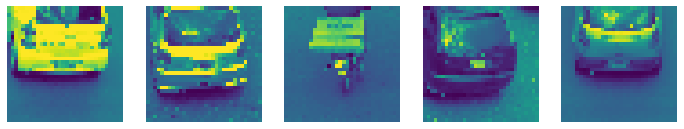

In [13]:
import numpy as np
import torchvision
import matplotlib.pyplot as plt

def imshow(image, ax=None, title=None, normalize=True):
    if ax is None:
        fig, ax = plt.subplots()
    image = image.numpy().transpose((1, 2, 0))

    if normalize:
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = std * image + mean
        image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax
batch_size = 16
train_loader = DataLoader(dataset = train_data, batch_size = batch_size, shuffle=True, num_workers=0)
valid_loader = DataLoader(dataset = valid_data, batch_size = batch_size, shuffle=False, num_workers=0)
image_paths, trainimages, trainlabels = next(iter(train_loader))

fig, axes = plt.subplots(figsize=(12, 12), ncols=5)
print('training images')
for i in range(5):
    axe1 = axes[i] 
    imshow(trainimages[i], ax=axe1, normalize=False)
    print(trainlabels[i])

print(trainimages[0].size())

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F



class YoloLiteModified(nn.Module):
  def __init__(self):
    super(YoloLiteModified, self).__init__()
    self.n_classes = 4

    self.classification = nn.Sequential(
        nn.Conv2d(in_channels= 1, out_channels= 16, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size= 2),
        nn.Conv2d(in_channels= 16, out_channels = 32, kernel_size= 3, stride = 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=32, out_channels= 64, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Conv2d(in_channels=64, out_channels= 128, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
        nn.MaxPool2d(kernel_size = 2),
        nn.Flatten(),
        nn.Linear(in_features = 512, out_features = 32, bias = False),
        nn.Linear(in_features = 32, out_features = 4, bias = False)
#         nn.Conv2d(in_channels=128, out_channels= 128, kernel_size= 3, stride= 1, padding = 1),
# #         nn.ReLU(),
#         nn.MaxPool2d(kernel_size = 2),
#         nn.Conv2d(in_channels=128, out_channels= self.n_classes, kernel_size= 3, stride= 1, padding = 1),
# #         nn.ReLU(),
#         nn.MaxPool2d(kernel_size = 2),

#         nn.Linear(in_features = 32, out_features = self.n_classes, bias = False)
        
#         nn.Conv2d(in_channels=32, out_channels= 64, kernel_size= 3, stride= 1, padding = 1),
#         nn.ReLU(),
#         nn.MaxPool2d(kernel_size = 2),
        
    )

  def forward(self, x):
    logits = self.classification(x)
    boxes = torch.sigmoid(logits)
    return boxes



In [21]:
from torchsummary import summary
model = YoloLiteModified()
summary(model,(1,32,32))
print(model)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             160
         MaxPool2d-2           [-1, 16, 16, 16]               0
            Conv2d-3           [-1, 32, 16, 16]           4,640
         MaxPool2d-4             [-1, 32, 8, 8]               0
            Conv2d-5             [-1, 64, 8, 8]          18,496
         MaxPool2d-6             [-1, 64, 4, 4]               0
            Conv2d-7            [-1, 128, 4, 4]          73,856
         MaxPool2d-8            [-1, 128, 2, 2]               0
           Flatten-9                  [-1, 512]               0
           Linear-10                   [-1, 32]          16,384
           Linear-11                    [-1, 4]             128
Total params: 113,664
Trainable params: 113,664
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/

In [22]:
num_epochs = 100
num_classes = 4
batch_size = 16
learning_rate = 0.001


def criterion(output, target):
    loss = F.mse_loss(output,target)
    return loss
    
optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)

def save_ckp(model, optimizer,epoch,file_prefix):
    checkpoint = {'model': model,
              'state_dict': model.state_dict(),
              'optimizer' : optimizer.state_dict()}
    filename=file_prefix+"_"+str(epoch)+".pth"
    torch.save(checkpoint, filename)

In [24]:
%%time
# keeping-track-of-losses 
device = torch.device('cpu')
train_losses = []
valid_losses = []
file_prefix="./models/nameplate32x32bb/nameplatebb_100"
for epoch in range(1, num_epochs + 1):
    # keep-track-of-training-and-validation-loss
    train_loss = 0.0
    valid_loss = 0.0
    
    # training-the-model
    model.train()
    batch_no =0
    num_correct_train_data = 0
    
    for img_path, data, target in train_loader:
        print("Batch",batch_no)
        # move-tensors-to-GPU 
#         print(data,type(data))
#         print(target,type(target))
        data = data.to(device)
        target = target.to(device)
        
        # clear-the-gradients-of-all-optimized-variables
        optimizer.zero_grad()
        # forward-pass: compute-predicted-outputs-by-passing-inputs-to-the-model
        output = model(data)
        # calculate-the-batch-loss
        loss = criterion(output, target)
        
        # backward-pass: compute-gradient-of-the-loss-wrt-model-parameters
        loss.backward()
        # perform-a-single-optimization-step (parameter-update)
        optimizer.step()
        # update-training-loss
        train_loss += loss.item() * data.size(0)
        batch_no +=1
       
    # validate-the-model
    model.eval()
    for img_path,data, target in valid_loader:
        
        data = data.to(device)
        target = target.to(device)
        
        output = model(data)
        
        loss = criterion(output, target)
        
        # update-average-validation-loss 
        valid_loss += loss.item() * data.size(0)
    
    # calculate-average-losses
    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(valid_loader.sampler)
    train_losses.append(train_loss)
    valid_losses.append(valid_loss)
        
    # print-training/validation-statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    print("Training Losses",train_losses)
    print("Valid Losses",valid_losses)
    save_ckp(model,optimizer,epoch,file_prefix)

Batch 0
Batch 1
Batch 2
Batch 3
Batch 4
Batch 5
Batch 6
Batch 7
Batch 8
Batch 9
Batch 10
Batch 11
Batch 12
Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110


Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945


Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286


Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105

Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455


Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262

Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617


Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400

Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278


Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098

Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430


Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240

Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580


Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368

Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706


Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427
Batch 1428
Batch 1429
Batch 1430
Batch 1431
Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 10 	Training Loss: 0.000155 	Validation Loss: 0.000238
Training Losses [0.00041015690452574105, 0.00032901918733858144, 0.0002889575361363859, 0.00026070037032161007, 0.0002349112769714298, 0.00021671000665543814, 0.0001960667318676685, 0.00017986071147319782, 0.0001689252114717897, 0.00015540689568173272]
Valid Losses [0.0003739978545718277, 0.00034079217070972904, 0.00031888551632470373, 0.0002805049204620895, 0.0002749978862451666, 0.00

Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772
Batch 773
Batch 774
Batch 775
Batch 776
Batch 777
Batch 778
Batch 779
Batch 780
Batch 781
Batch 782
Batch 783
Batch 784
Batch 785
Batch 786
Batch 787
Batch 788
Batch 789
Batch 790
Batch 791
Batch 792
Batch 793
Batch 794
Batch 795
Batch 796
Batch 797
Batch 798
Batch 799
Batch 800
Batch 801
Batch 802
Batch 803
Batch 804
Batch 805
Batch 806
Batch 807
Batch 808
Batch 809
Batch 810
Batch 811
Batch 812
Batch 813
Batch 814
Batch 815
Batch 816
Batch 817
Batch 818
Batch 819
Batch 820
Batch 821
Batch 822
Batch 823
Batch 824
Batch 825


Batch 13
Batch 14
Batch 15
Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 1

Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948


Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231


Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
B

Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349


Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158

Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452


Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248

Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556


Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342

Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644


Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426

Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736


Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 18 	Training Loss: 0.000102 	Validation Loss: 0.000241
Training Losses [0.00041015690452574105, 0.00032901918733858144, 0.0002889575361363859, 0.00026070037032161007, 0.0002349112769714298, 0.00021671000665543814, 0.0001960667318676685, 0.00017986071147319782, 0.0001689252114717897, 0.00015540689568173272, 0.00014501795778832302, 0.00013915938889612995, 0.00013025836617047744, 0.0001221680538876611, 0.00011745265719536149, 0.00011606406402415976, 0.00010703264216024813, 0.00010198876799512458]
Valid Losses [0.0003739978545718277, 0.00034079217070972904, 0.00031888551632470373, 0.0002805049204620895, 0.0002749978862451666, 0.00030976788669789536, 0.00026891079390544786, 0.00025670327211964013, 0.00025212743412889504, 0.00023796005408938028, 0.0002520404087021744, 0.0002536560142901926, 0.00023753091527045156, 0.0002417583880300873, 0.0002568871271031172, 0.0002388818864391543, 0.00025451218685

Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772
Batch 773
Batch 774
Batch 775
Batch 776
Batch 777
Batch 778
Batch 779
Batch 780
Batch 781
Batch 782
Batch 783
Batch 784
Batch 785
Batch 786
Batch 787
Batch 788
Batch 789
Batch 790
Batch 791
Batch 792
Batch 793
Batch 794
Batch 795
Batch 796
Batch 797
Batch 798
Batch 799
Batch 800
Batch 801
Batch 802
Batch 803
Batch 804
Batch 805
Batch 806
Batch 807
Batch 808
Batch 809
Batch 810
Batch 811
Batch 812
Batch 813
Batch 814
Batch 815
Batch 816
Batch 817
Batch 818
Batch 819
Batch 820
Batch 821
Batch 822
Batch 823
Batch 824
Batch 825
Batch 826
Batch 827
Batch 828
Batch 829
Batch 830
Batch 831
Batch 832
Batch 833
Batch 834
Batch 835


Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Bat

Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951


Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200


Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batc

Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245
Batch 246
Batch 247
Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265


Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092

Batch 248
Batch 249
Batch 250
Batch 251
Batch 252
Batch 253
Batch 254
Batch 255
Batch 256
Batch 257
Batch 258
Batch 259
Batch 260
Batch 261
Batch 262
Batch 263
Batch 264
Batch 265
Batch 266
Batch 267
Batch 268
Batch 269
Batch 270
Batch 271
Batch 272
Batch 273
Batch 274
Batch 275
Batch 276
Batch 277
Batch 278
Batch 279
Batch 280
Batch 281
Batch 282
Batch 283
Batch 284
Batch 285
Batch 286
Batch 287
Batch 288
Batch 289
Batch 290
Batch 291
Batch 292
Batch 293
Batch 294
Batch 295
Batch 296
Batch 297
Batch 298
Batch 299
Batch 300
Batch 301
Batch 302
Batch 303
Batch 304
Batch 305
Batch 306
Batch 307
Batch 308
Batch 309
Batch 310
Batch 311
Batch 312
Batch 313
Batch 314
Batch 315
Batch 316
Batch 317
Batch 318
Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347


Batch 1076
Batch 1077
Batch 1078
Batch 1079
Batch 1080
Batch 1081
Batch 1082
Batch 1083
Batch 1084
Batch 1085
Batch 1086
Batch 1087
Batch 1088
Batch 1089
Batch 1090
Batch 1091
Batch 1092
Batch 1093
Batch 1094
Batch 1095
Batch 1096
Batch 1097
Batch 1098
Batch 1099
Batch 1100
Batch 1101
Batch 1102
Batch 1103
Batch 1104
Batch 1105
Batch 1106
Batch 1107
Batch 1108
Batch 1109
Batch 1110
Batch 1111
Batch 1112
Batch 1113
Batch 1114
Batch 1115
Batch 1116
Batch 1117
Batch 1118
Batch 1119
Batch 1120
Batch 1121
Batch 1122
Batch 1123
Batch 1124
Batch 1125
Batch 1126
Batch 1127
Batch 1128
Batch 1129
Batch 1130
Batch 1131
Batch 1132
Batch 1133
Batch 1134
Batch 1135
Batch 1136
Batch 1137
Batch 1138
Batch 1139
Batch 1140
Batch 1141
Batch 1142
Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166

Batch 319
Batch 320
Batch 321
Batch 322
Batch 323
Batch 324
Batch 325
Batch 326
Batch 327
Batch 328
Batch 329
Batch 330
Batch 331
Batch 332
Batch 333
Batch 334
Batch 335
Batch 336
Batch 337
Batch 338
Batch 339
Batch 340
Batch 341
Batch 342
Batch 343
Batch 344
Batch 345
Batch 346
Batch 347
Batch 348
Batch 349
Batch 350
Batch 351
Batch 352
Batch 353
Batch 354
Batch 355
Batch 356
Batch 357
Batch 358
Batch 359
Batch 360
Batch 361
Batch 362
Batch 363
Batch 364
Batch 365
Batch 366
Batch 367
Batch 368
Batch 369
Batch 370
Batch 371
Batch 372
Batch 373
Batch 374
Batch 375
Batch 376
Batch 377
Batch 378
Batch 379
Batch 380
Batch 381
Batch 382
Batch 383
Batch 384
Batch 385
Batch 386
Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418


Batch 1143
Batch 1144
Batch 1145
Batch 1146
Batch 1147
Batch 1148
Batch 1149
Batch 1150
Batch 1151
Batch 1152
Batch 1153
Batch 1154
Batch 1155
Batch 1156
Batch 1157
Batch 1158
Batch 1159
Batch 1160
Batch 1161
Batch 1162
Batch 1163
Batch 1164
Batch 1165
Batch 1166
Batch 1167
Batch 1168
Batch 1169
Batch 1170
Batch 1171
Batch 1172
Batch 1173
Batch 1174
Batch 1175
Batch 1176
Batch 1177
Batch 1178
Batch 1179
Batch 1180
Batch 1181
Batch 1182
Batch 1183
Batch 1184
Batch 1185
Batch 1186
Batch 1187
Batch 1188
Batch 1189
Batch 1190
Batch 1191
Batch 1192
Batch 1193
Batch 1194
Batch 1195
Batch 1196
Batch 1197
Batch 1198
Batch 1199
Batch 1200
Batch 1201
Batch 1202
Batch 1203
Batch 1204
Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233

Batch 387
Batch 388
Batch 389
Batch 390
Batch 391
Batch 392
Batch 393
Batch 394
Batch 395
Batch 396
Batch 397
Batch 398
Batch 399
Batch 400
Batch 401
Batch 402
Batch 403
Batch 404
Batch 405
Batch 406
Batch 407
Batch 408
Batch 409
Batch 410
Batch 411
Batch 412
Batch 413
Batch 414
Batch 415
Batch 416
Batch 417
Batch 418
Batch 419
Batch 420
Batch 421
Batch 422
Batch 423
Batch 424
Batch 425
Batch 426
Batch 427
Batch 428
Batch 429
Batch 430
Batch 431
Batch 432
Batch 433
Batch 434
Batch 435
Batch 436
Batch 437
Batch 438
Batch 439
Batch 440
Batch 441
Batch 442
Batch 443
Batch 444
Batch 445
Batch 446
Batch 447
Batch 448
Batch 449
Batch 450
Batch 451
Batch 452
Batch 453
Batch 454
Batch 455
Batch 456
Batch 457
Batch 458
Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486


Batch 1205
Batch 1206
Batch 1207
Batch 1208
Batch 1209
Batch 1210
Batch 1211
Batch 1212
Batch 1213
Batch 1214
Batch 1215
Batch 1216
Batch 1217
Batch 1218
Batch 1219
Batch 1220
Batch 1221
Batch 1222
Batch 1223
Batch 1224
Batch 1225
Batch 1226
Batch 1227
Batch 1228
Batch 1229
Batch 1230
Batch 1231
Batch 1232
Batch 1233
Batch 1234
Batch 1235
Batch 1236
Batch 1237
Batch 1238
Batch 1239
Batch 1240
Batch 1241
Batch 1242
Batch 1243
Batch 1244
Batch 1245
Batch 1246
Batch 1247
Batch 1248
Batch 1249
Batch 1250
Batch 1251
Batch 1252
Batch 1253
Batch 1254
Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295

Batch 459
Batch 460
Batch 461
Batch 462
Batch 463
Batch 464
Batch 465
Batch 466
Batch 467
Batch 468
Batch 469
Batch 470
Batch 471
Batch 472
Batch 473
Batch 474
Batch 475
Batch 476
Batch 477
Batch 478
Batch 479
Batch 480
Batch 481
Batch 482
Batch 483
Batch 484
Batch 485
Batch 486
Batch 487
Batch 488
Batch 489
Batch 490
Batch 491
Batch 492
Batch 493
Batch 494
Batch 495
Batch 496
Batch 497
Batch 498
Batch 499
Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558


Batch 1255
Batch 1256
Batch 1257
Batch 1258
Batch 1259
Batch 1260
Batch 1261
Batch 1262
Batch 1263
Batch 1264
Batch 1265
Batch 1266
Batch 1267
Batch 1268
Batch 1269
Batch 1270
Batch 1271
Batch 1272
Batch 1273
Batch 1274
Batch 1275
Batch 1276
Batch 1277
Batch 1278
Batch 1279
Batch 1280
Batch 1281
Batch 1282
Batch 1283
Batch 1284
Batch 1285
Batch 1286
Batch 1287
Batch 1288
Batch 1289
Batch 1290
Batch 1291
Batch 1292
Batch 1293
Batch 1294
Batch 1295
Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345

Batch 500
Batch 501
Batch 502
Batch 503
Batch 504
Batch 505
Batch 506
Batch 507
Batch 508
Batch 509
Batch 510
Batch 511
Batch 512
Batch 513
Batch 514
Batch 515
Batch 516
Batch 517
Batch 518
Batch 519
Batch 520
Batch 521
Batch 522
Batch 523
Batch 524
Batch 525
Batch 526
Batch 527
Batch 528
Batch 529
Batch 530
Batch 531
Batch 532
Batch 533
Batch 534
Batch 535
Batch 536
Batch 537
Batch 538
Batch 539
Batch 540
Batch 541
Batch 542
Batch 543
Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599


Batch 1296
Batch 1297
Batch 1298
Batch 1299
Batch 1300
Batch 1301
Batch 1302
Batch 1303
Batch 1304
Batch 1305
Batch 1306
Batch 1307
Batch 1308
Batch 1309
Batch 1310
Batch 1311
Batch 1312
Batch 1313
Batch 1314
Batch 1315
Batch 1316
Batch 1317
Batch 1318
Batch 1319
Batch 1320
Batch 1321
Batch 1322
Batch 1323
Batch 1324
Batch 1325
Batch 1326
Batch 1327
Batch 1328
Batch 1329
Batch 1330
Batch 1331
Batch 1332
Batch 1333
Batch 1334
Batch 1335
Batch 1336
Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386

Batch 544
Batch 545
Batch 546
Batch 547
Batch 548
Batch 549
Batch 550
Batch 551
Batch 552
Batch 553
Batch 554
Batch 555
Batch 556
Batch 557
Batch 558
Batch 559
Batch 560
Batch 561
Batch 562
Batch 563
Batch 564
Batch 565
Batch 566
Batch 567
Batch 568
Batch 569
Batch 570
Batch 571
Batch 572
Batch 573
Batch 574
Batch 575
Batch 576
Batch 577
Batch 578
Batch 579
Batch 580
Batch 581
Batch 582
Batch 583
Batch 584
Batch 585
Batch 586
Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643


Batch 1337
Batch 1338
Batch 1339
Batch 1340
Batch 1341
Batch 1342
Batch 1343
Batch 1344
Batch 1345
Batch 1346
Batch 1347
Batch 1348
Batch 1349
Batch 1350
Batch 1351
Batch 1352
Batch 1353
Batch 1354
Batch 1355
Batch 1356
Batch 1357
Batch 1358
Batch 1359
Batch 1360
Batch 1361
Batch 1362
Batch 1363
Batch 1364
Batch 1365
Batch 1366
Batch 1367
Batch 1368
Batch 1369
Batch 1370
Batch 1371
Batch 1372
Batch 1373
Batch 1374
Batch 1375
Batch 1376
Batch 1377
Batch 1378
Batch 1379
Batch 1380
Batch 1381
Batch 1382
Batch 1383
Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427

Batch 587
Batch 588
Batch 589
Batch 590
Batch 591
Batch 592
Batch 593
Batch 594
Batch 595
Batch 596
Batch 597
Batch 598
Batch 599
Batch 600
Batch 601
Batch 602
Batch 603
Batch 604
Batch 605
Batch 606
Batch 607
Batch 608
Batch 609
Batch 610
Batch 611
Batch 612
Batch 613
Batch 614
Batch 615
Batch 616
Batch 617
Batch 618
Batch 619
Batch 620
Batch 621
Batch 622
Batch 623
Batch 624
Batch 625
Batch 626
Batch 627
Batch 628
Batch 629
Batch 630
Batch 631
Batch 632
Batch 633
Batch 634
Batch 635
Batch 636
Batch 637
Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686


Batch 1384
Batch 1385
Batch 1386
Batch 1387
Batch 1388
Batch 1389
Batch 1390
Batch 1391
Batch 1392
Batch 1393
Batch 1394
Batch 1395
Batch 1396
Batch 1397
Batch 1398
Batch 1399
Batch 1400
Batch 1401
Batch 1402
Batch 1403
Batch 1404
Batch 1405
Batch 1406
Batch 1407
Batch 1408
Batch 1409
Batch 1410
Batch 1411
Batch 1412
Batch 1413
Batch 1414
Batch 1415
Batch 1416
Batch 1417
Batch 1418
Batch 1419
Batch 1420
Batch 1421
Batch 1422
Batch 1423
Batch 1424
Batch 1425
Batch 1426
Batch 1427
Batch 1428
Batch 1429
Batch 1430
Batch 1431
Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 29 	Training Loss: 0.000076 	Validation Loss: 0.000233
Training Losses [0.00041015690452574105, 0.00032901918733858144, 0.0002889575361363859, 0.00026070037032161007, 0.0002349112769714298, 0.00021671000665543814, 0.0001960667318676685, 0.00017986071147319782, 0.0001689252114717897, 0.00015540689568173272, 0.00014501795778832302, 0.00013915938889612995,

Batch 638
Batch 639
Batch 640
Batch 641
Batch 642
Batch 643
Batch 644
Batch 645
Batch 646
Batch 647
Batch 648
Batch 649
Batch 650
Batch 651
Batch 652
Batch 653
Batch 654
Batch 655
Batch 656
Batch 657
Batch 658
Batch 659
Batch 660
Batch 661
Batch 662
Batch 663
Batch 664
Batch 665
Batch 666
Batch 667
Batch 668
Batch 669
Batch 670
Batch 671
Batch 672
Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737


Batch 1432
Batch 1433
Batch 1434
Batch 1435
Batch 1436
Batch 1437
Batch 1438
Batch 1439
Batch 1440
Batch 1441
Epoch: 30 	Training Loss: 0.000074 	Validation Loss: 0.000234
Training Losses [0.00041015690452574105, 0.00032901918733858144, 0.0002889575361363859, 0.00026070037032161007, 0.0002349112769714298, 0.00021671000665543814, 0.0001960667318676685, 0.00017986071147319782, 0.0001689252114717897, 0.00015540689568173272, 0.00014501795778832302, 0.00013915938889612995, 0.00013025836617047744, 0.0001221680538876611, 0.00011745265719536149, 0.00011606406402415976, 0.00010703264216024813, 0.00010198876799512458, 9.975026199777711e-05, 9.637813179751782e-05, 9.219762414452401e-05, 8.918947404629476e-05, 8.604017537387239e-05, 8.467981259457143e-05, 8.34059566638317e-05, 8.065518024829338e-05, 7.754654855872547e-05, 7.661146278949804e-05, 7.64298340330255e-05, 7.40606988199426e-05]
Valid Losses [0.0003739978545718277, 0.00034079217070972904, 0.00031888551632470373, 0.0002805049204620895, 0.0

Batch 673
Batch 674
Batch 675
Batch 676
Batch 677
Batch 678
Batch 679
Batch 680
Batch 681
Batch 682
Batch 683
Batch 684
Batch 685
Batch 686
Batch 687
Batch 688
Batch 689
Batch 690
Batch 691
Batch 692
Batch 693
Batch 694
Batch 695
Batch 696
Batch 697
Batch 698
Batch 699
Batch 700
Batch 701
Batch 702
Batch 703
Batch 704
Batch 705
Batch 706
Batch 707
Batch 708
Batch 709
Batch 710
Batch 711
Batch 712
Batch 713
Batch 714
Batch 715
Batch 716
Batch 717
Batch 718
Batch 719
Batch 720
Batch 721
Batch 722
Batch 723
Batch 724
Batch 725
Batch 726
Batch 727
Batch 728
Batch 729
Batch 730
Batch 731
Batch 732
Batch 733
Batch 734
Batch 735
Batch 736
Batch 737
Batch 738
Batch 739
Batch 740
Batch 741
Batch 742
Batch 743
Batch 744
Batch 745
Batch 746
Batch 747
Batch 748
Batch 749
Batch 750
Batch 751
Batch 752
Batch 753
Batch 754
Batch 755
Batch 756
Batch 757
Batch 758
Batch 759
Batch 760
Batch 761
Batch 762
Batch 763
Batch 764
Batch 765
Batch 766
Batch 767
Batch 768
Batch 769
Batch 770
Batch 771
Batch 772


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952


Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146

Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978


Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
B

Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000

Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181


Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Ba

Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203


Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Ba

Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224


Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
B

Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241


Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070

Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238


Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Ba

Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245


Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batc

Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244
Batch 245


Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 1074
Batch 1075
Batch 1076
Batch 1077
Ba

Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233
Batch 234
Batch 235
Batch 236
Batch 237
Batch 238
Batch 239
Batch 240
Batch 241
Batch 242
Batch 243
Batch 244


Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059
Batch 1060
Batch 1061
Batch 1062
Batch 1063
Batch 1064
Batch 1065
Batch 1066
Batch 1067
Batch 1068
Batch 1069
Batch 1070
Batch 1071
Batch 1072
Batch 1073
Batch 

Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203
Batch 204
Batch 205
Batch 206
Batch 207
Batch 208
Batch 209
Batch 210
Batch 211
Batch 212
Batch 213
Batch 214
Batch 215
Batch 216
Batch 217
Batch 218
Batch 219
Batch 220
Batch 221
Batch 222
Batch 223
Batch 224
Batch 225
Batch 226
Batch 227
Batch 228
Batch 229
Batch 230
Batch 231
Batch 232
Batch 233


Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039
Batch 1040
Batch 1041
Batch 1042
Batch 1043
Batch 1044
Batch 1045
Batch 1046
Batch 1047
Batch 1048
Batch 1049
Batch 1050
Batch 1051
Batch 1052
Batch 1053
Batch 1054
Batch 1055
Batch 1056
Batch 1057
Batch 1058
Batch 1059


Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 184
Batch 185
Batch 186
Batch 187
Batch 188
Batch 189
Batch 190
Batch 191
Batch 192
Batch 193
Batch 194
Batch 195
Batch 196
Batch 197
Batch 198
Batch 199
Batch 200
Batch 201
Batch 202
Batch 203


Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020
Batch 1021
Batch 1022
Batch 1023
Batch 1024
Batch 1025
Batch 1026
Batch 1027
Batch 1028
Batch 1029
Batch 1030
Batch 1031
Batch 1032
Batch 1033
Batch 1034
Batch 1035
Batch 1036
Batch 1037
Batch 1038
Batch 1039


Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 165
Batch 166
Batch 167
Batch 168
Batch 169
Batch 170
Batch 171
Batch 172
Batch 173
Batch 174
Batch 175
Batch 176
Batch 177
Batch 178
Batch 179
Batch 180
Batch 181
Batch 182
Batch 183
Batch 1

Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 1001
Batch 1002
Batch 1003
Batch 1004
Batch 1005
Batch 1006
Batch 1007
Batch 1008
Batch 1009
Batch 1010
Batch 1011
Batch 1012
Batch 1013
Batch 1014
Batch 1015
Batch 1016
Batch 1017
Batch 1018
Batch 1019
Batch 1020

Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127
Batch 128
Batch 129
Batch 130
Batch 131
Batch 132
Batch 133
Batch 134
Batch 135
Batch 136
Batch 137
Batch 138
Batch 139
Batch 140
Batch 141
Batch 142
Batch 143
Batch 144
Batch 145
Batch 146
Batch 147
Batch 148
Batch 149
Batch 150
Batch 151
Batch 152
Batch 153
Batch 154
Batch 155
Batch 156
Batch 157
Batch 158
Batch 159
Batch 160
Batch 161
Batch 162
Batch 163
Batch 164
Batch 16

Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967
Batch 968
Batch 969
Batch 970
Batch 971
Batch 972
Batch 973
Batch 974
Batch 975
Batch 976
Batch 977
Batch 978
Batch 979
Batch 980
Batch 981
Batch 982
Batch 983
Batch 984
Batch 985
Batch 986
Batch 987
Batch 988
Batch 989
Batch 990
Batch 991
Batch 992
Batch 993
Batch 994
Batch 995
Batch 996
Batch 997
Batch 998
Batch 999
Batch 1000
Batch 100

Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 846
Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 847
Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950


Batch 16
Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batc

Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952


Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Bat

Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 848
Batch 849
Batch 850
Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966
Batch 967


Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Bat

Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963


Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Ba

Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953


Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
B

Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 851
Batch 852
Batch 853
Batch 854
Batch 855
Batch 856
Batch 857
Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959
Batch 960
Batch 961
Batch 962
Batch 963
Batch 964
Batch 965
Batch 966


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 858
Batch 859
Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957


Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Batch 125
Batch 126
Batch 127


Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


Batch 17
Batch 18
Batch 19
Batch 20
Batch 21
Batch 22
Batch 23
Batch 24
Batch 25
Batch 26
Batch 27
Batch 28
Batch 29
Batch 30
Batch 31
Batch 32
Batch 33
Batch 34
Batch 35
Batch 36
Batch 37
Batch 38
Batch 39
Batch 40
Batch 41
Batch 42
Batch 43
Batch 44
Batch 45
Batch 46
Batch 47
Batch 48
Batch 49
Batch 50
Batch 51
Batch 52
Batch 53
Batch 54
Batch 55
Batch 56
Batch 57
Batch 58
Batch 59
Batch 60
Batch 61
Batch 62
Batch 63
Batch 64
Batch 65
Batch 66
Batch 67
Batch 68
Batch 69
Batch 70
Batch 71
Batch 72
Batch 73
Batch 74
Batch 75
Batch 76
Batch 77
Batch 78
Batch 79
Batch 80
Batch 81
Batch 82
Batch 83
Batch 84
Batch 85
Batch 86
Batch 87
Batch 88
Batch 89
Batch 90
Batch 91
Batch 92
Batch 93
Batch 94
Batch 95
Batch 96
Batch 97
Batch 98
Batch 99
Batch 100
Batch 101
Batch 102
Batch 103
Batch 104
Batch 105
Batch 106
Batch 107
Batch 108
Batch 109
Batch 110
Batch 111
Batch 112
Batch 113
Batch 114
Batch 115
Batch 116
Batch 117
Batch 118
Batch 119
Batch 120
Batch 121
Batch 122
Batch 123
Batch 124
Bat

Batch 860
Batch 861
Batch 862
Batch 863
Batch 864
Batch 865
Batch 866
Batch 867
Batch 868
Batch 869
Batch 870
Batch 871
Batch 872
Batch 873
Batch 874
Batch 875
Batch 876
Batch 877
Batch 878
Batch 879
Batch 880
Batch 881
Batch 882
Batch 883
Batch 884
Batch 885
Batch 886
Batch 887
Batch 888
Batch 889
Batch 890
Batch 891
Batch 892
Batch 893
Batch 894
Batch 895
Batch 896
Batch 897
Batch 898
Batch 899
Batch 900
Batch 901
Batch 902
Batch 903
Batch 904
Batch 905
Batch 906
Batch 907
Batch 908
Batch 909
Batch 910
Batch 911
Batch 912
Batch 913
Batch 914
Batch 915
Batch 916
Batch 917
Batch 918
Batch 919
Batch 920
Batch 921
Batch 922
Batch 923
Batch 924
Batch 925
Batch 926
Batch 927
Batch 928
Batch 929
Batch 930
Batch 931
Batch 932
Batch 933
Batch 934
Batch 935
Batch 936
Batch 937
Batch 938
Batch 939
Batch 940
Batch 941
Batch 942
Batch 943
Batch 944
Batch 945
Batch 946
Batch 947
Batch 948
Batch 949
Batch 950
Batch 951
Batch 952
Batch 953
Batch 954
Batch 955
Batch 956
Batch 957
Batch 958
Batch 959


[0.00041015690452574105, 0.00032901918733858144, 0.0002889575361363859, 0.00026070037032161007, 0.0002349112769714298, 0.00021671000665543814, 0.0001960667318676685, 0.00017986071147319782, 0.0001689252114717897, 0.00015540689568173272, 0.00014501795778832302, 0.00013915938889612995, 0.00013025836617047744, 0.0001221680538876611, 0.00011745265719536149, 0.00011606406402415976, 0.00010703264216024813, 0.00010198876799512458, 9.975026199777711e-05, 9.637813179751782e-05, 9.219762414452401e-05, 8.918947404629476e-05, 8.604017537387239e-05, 8.467981259457143e-05, 8.34059566638317e-05, 8.065518024829338e-05, 7.754654855872547e-05, 7.661146278949804e-05, 7.64298340330255e-05, 7.40606988199426e-05, 7.246387125677984e-05, 6.987286504730687e-05, 6.85963096700497e-05, 6.748615333186814e-05, 6.736958392351666e-05, 6.571977122289681e-05, 6.448222174276428e-05, 6.375745245903006e-05, 6.389205222470623e-05, 6.166207636878232e-05, 6.0667321116552864e-05, 5.985186654904737e-05, 5.891124923856398e-05, 

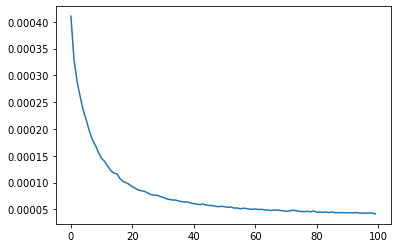

In [25]:
print(train_losses)
x=range(0,len(train_losses))
plt.plot(x,train_losses)
plt.show()

In [29]:
from copy import deepcopy
def calculate_IOU(target, output):
    bb1=target.tolist()
    bb2=output.tolist()
#     print(bb1,bb2)
    bb1[2] = bb1[0] + bb1[2]
    bb1[3] = bb1[1] + bb1[3]
   
    bb2[2] = bb2[0] + bb2[2]
    bb2[3] = bb2[1] + bb2[3]

    assert bb1[0] <= bb1[2]
    assert bb1[1] <= bb1[3]
    assert bb2[0] <= bb2[2]
    assert bb2[1] <= bb2[3]

    # determine the coordinates of the intersection rectangle
    x_left = max(bb1[0], bb2[0])
    y_top = max(bb1[1], bb2[1])
    x_right = min(bb1[2], bb2[2])
    y_bottom = min(bb1[3], bb2[3])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    # The intersection of two axis-aligned bounding boxes is always an
    # axis-aligned bounding box
    intersection_area = (x_right - x_left) * (y_bottom - y_top)

    # compute the area of both AABBs
    bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
    bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

model.eval()
n=0
num_correct_data = 0
batch_test = 0
for img_path,data, target in train_loader:
    print("Batch",batch_test)
    data = data.to(device)
    target = target.to(device)
    output = model(data)
    curr_target = target.size(0)
    print(curr_target)
    n += target.size(0)
    
    for b in range(0,curr_target):
        iou = calculate_IOU(target[b],output[b])
        if(iou >=0.8):
            num_correct_data+=1
    batch_test+=1
print(num_correct_data/n *100.0)

Batch 0
16
Batch 1
16
Batch 2
16
Batch 3
16
Batch 4
16
Batch 5
16
Batch 6
16
Batch 7
16
Batch 8
16
Batch 9
16
Batch 10
16
Batch 11
16
Batch 12
16
Batch 13
16
Batch 14
16
Batch 15
16
Batch 16
16
Batch 17
16
Batch 18
16
Batch 19
16
Batch 20
16
Batch 21
16
Batch 22
16
Batch 23
16
Batch 24
16
Batch 25
16
Batch 26
16
Batch 27
16
Batch 28
16
Batch 29
16
Batch 30
16
Batch 31
16
Batch 32
16
Batch 33
16
Batch 34
16
Batch 35
16
Batch 36
16
Batch 37
16
Batch 38
16
Batch 39
16
Batch 40
16
Batch 41
16
Batch 42
16
Batch 43
16
Batch 44
16
Batch 45
16
Batch 46
16
Batch 47
16
Batch 48
16
Batch 49
16
Batch 50
16
Batch 51
16
Batch 52
16
Batch 53
16
Batch 54
16
Batch 55
16
Batch 56
16
Batch 57
16
Batch 58
16
Batch 59
16
Batch 60
16
Batch 61
16
Batch 62
16
Batch 63
16
Batch 64
16
Batch 65
16
Batch 66
16
Batch 67
16
Batch 68
16
Batch 69
16
Batch 70
16
Batch 71
16
Batch 72
16
Batch 73
16
Batch 74
16
Batch 75
16
Batch 76
16
Batch 77
16
Batch 78
16
Batch 79
16
Batch 80
16
Batch 81
16
Batch 82
16
Batch 83
16
Ba

Batch 658
16
Batch 659
16
Batch 660
16
Batch 661
16
Batch 662
16
Batch 663
16
Batch 664
16
Batch 665
16
Batch 666
16
Batch 667
16
Batch 668
16
Batch 669
16
Batch 670
16
Batch 671
16
Batch 672
16
Batch 673
16
Batch 674
16
Batch 675
16
Batch 676
16
Batch 677
16
Batch 678
16
Batch 679
16
Batch 680
16
Batch 681
16
Batch 682
16
Batch 683
16
Batch 684
16
Batch 685
16
Batch 686
16
Batch 687
16
Batch 688
16
Batch 689
16
Batch 690
16
Batch 691
16
Batch 692
16
Batch 693
16
Batch 694
16
Batch 695
16
Batch 696
16
Batch 697
16
Batch 698
16
Batch 699
16
Batch 700
16
Batch 701
16
Batch 702
16
Batch 703
16
Batch 704
16
Batch 705
16
Batch 706
16
Batch 707
16
Batch 708
16
Batch 709
16
Batch 710
16
Batch 711
16
Batch 712
16
Batch 713
16
Batch 714
16
Batch 715
16
Batch 716
16
Batch 717
16
Batch 718
16
Batch 719
16
Batch 720
16
Batch 721
16
Batch 722
16
Batch 723
16
Batch 724
16
Batch 725
16
Batch 726
16
Batch 727
16
Batch 728
16
Batch 729
16
Batch 730
16
Batch 731
16
Batch 732
16
Batch 733
16
Batch 734
16

16
Batch 1289
16
Batch 1290
16
Batch 1291
16
Batch 1292
16
Batch 1293
16
Batch 1294
16
Batch 1295
16
Batch 1296
16
Batch 1297
16
Batch 1298
16
Batch 1299
16
Batch 1300
16
Batch 1301
16
Batch 1302
16
Batch 1303
16
Batch 1304
16
Batch 1305
16
Batch 1306
16
Batch 1307
16
Batch 1308
16
Batch 1309
16
Batch 1310
16
Batch 1311
16
Batch 1312
16
Batch 1313
16
Batch 1314
16
Batch 1315
16
Batch 1316
16
Batch 1317
16
Batch 1318
16
Batch 1319
16
Batch 1320
16
Batch 1321
16
Batch 1322
16
Batch 1323
16
Batch 1324
16
Batch 1325
16
Batch 1326
16
Batch 1327
16
Batch 1328
16
Batch 1329
16
Batch 1330
16
Batch 1331
16
Batch 1332
16
Batch 1333
16
Batch 1334
16
Batch 1335
16
Batch 1336
16
Batch 1337
16
Batch 1338
16
Batch 1339
16
Batch 1340
16
Batch 1341
16
Batch 1342
16
Batch 1343
16
Batch 1344
16
Batch 1345
16
Batch 1346
16
Batch 1347
16
Batch 1348
16
Batch 1349
16
Batch 1350
16
Batch 1351
16
Batch 1352
16
Batch 1353
16
Batch 1354
16
Batch 1355
16
Batch 1356
16
Batch 1357
16
Batch 1358
16
Batch 1359
16
Bat

In [30]:
def load_ckp(checkpoint_fpath,model):
    """
    checkpoint_path: path to save checkpoint
    model: model that we want to load checkpoint parameters into       
    optimizer: optimizer we defined in previous training
    """
    # load check point
    checkpoint = torch.load(checkpoint_fpath)
    optimizer = torch.optim.Adam(model.parameters(),lr = learning_rate)
#     checkpoint = {'model': model,
#               'state_dict': model.state_dict(),
#               'optimizer' : optimizer.state_dict()}
    
    # initialize state_dict from checkpoint to model
    model.load_state_dict(checkpoint['state_dict'])
    # initialize optimizer from checkpoint to optimizer
    optimizer.load_state_dict(checkpoint['optimizer'])
    # initialize valid_loss_min from checkpoint to valid_loss_min
    
    # return model, optimizer, epoch value, min validation loss 
    return model, optimizer
# checkpoint_path ="./models/nameplatebb/nameplatebb_gray_200_epochs_200.pth"
checkpoint_path = "./models/nameplate32x32bb/nameplatebb_100_99.pth"
saved_model,saved_optimizer = load_ckp(checkpoint_path,model)


In [31]:
def evaluate_model(model,data_loader):
    def calculate_IOU(target, output):
        bb1=target.tolist()
        bb2=output.tolist()
    #     print(bb1,bb2)
        bb1[2] = bb1[0] + bb1[2]
        bb1[3] = bb1[1] + bb1[3]

        bb2[2] = bb2[0] + bb2[2]
        bb2[3] = bb2[1] + bb2[3]

        assert bb1[0] <= bb1[2]
        assert bb1[1] <= bb1[3]
        assert bb2[0] <= bb2[2]
        assert bb2[1] <= bb2[3]

        # determine the coordinates of the intersection rectangle
        x_left = max(bb1[0], bb2[0])
        y_top = max(bb1[1], bb2[1])
        x_right = min(bb1[2], bb2[2])
        y_bottom = min(bb1[3], bb2[3])

        if x_right < x_left or y_bottom < y_top:
            return 0.0

        # The intersection of two axis-aligned bounding boxes is always an
        # axis-aligned bounding box
        intersection_area = (x_right - x_left) * (y_bottom - y_top)

        # compute the area of both AABBs
        bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
        bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

        # compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the interesection area
        iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
        assert iou >= 0.0
        assert iou <= 1.0
        return iou
    model.eval()
    device = torch.device('cpu')
    n=0
    num_correct_data = 0
    batch_test = 0
    for img_path,data, target in data_loader:
#         print("Batch",batch_test)
        
        data = data.to(device)
        target = target.to(device)
        output = model(data)
        curr_target = target.size(0)
        n += target.size(0)
        
        for b in range(0,curr_target):
            iou = calculate_IOU(target[b],output[b])
            print(img_path[b],list(target[b]),iou)
            if(iou >=0.4):
                num_correct_data+=1
        batch_test+=1
    print(num_correct_data/n *100.0)
test_loader = DataLoader(dataset = train_data, batch_size = 1, shuffle=False, num_workers=0)
evaluate_model(saved_model,test_loader)

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayr-4067/21818.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9368712882276433
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/exy-8061/21912.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9333342792113427
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axu-9778/2954.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1562)] 0.9177601297392779
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ami-1174/21807.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9145801007192821
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auo-3593/30189.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8151804923307507
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/apw-6536/8367.png [tensor(0.3750), tensor(0.6562), tensor(0.2500), tensor(0.1875)] 0.8537463220059971
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avy-7819/18487.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9228681994347087
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arw-7358/32874.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8147721768077806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ajy-0700/2799.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8977808841184928
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqm-9109/34640.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9354940672927696
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mki-2628/175.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7889644993503345
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axy-7315/965.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9058242269724388
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bdr-2711/18987.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9530730892409153
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avn-4768/14090.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8754905911338758
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ers-4771/32308.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.9208939145636981
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/mbm-3692/19201.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9503281738657012
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/akn-0076/3127.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9313939768310621
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aoo-1903/24215.png [tensor(0.4062), tensor(0.4375), tensor(0.1562), tensor(0.1250)] 0.7607997903088568
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axe-5710/11753.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1875)] 0.8240362007868072
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alk-7227/29103.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.8349227235214657
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aro-1192/11350.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8991866784029452
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayj-3410/12939.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9430029631463649
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axa-7732/35522.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9119246251108509
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aaw-8473/10623.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7904423510493034
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aiz-6766/16849.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.9193296871878402
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/mih-8767/2986.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8505613061097205
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/afv-0704/29343.png [tensor(0.5625), tensor(0.5625), tensor(0.4062), tensor(0.1250)] 0.7666232599256506
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aup-2915/24510.png [tensor(0.3438), tensor(0.6875), tensor(0.3125), tensor(0.1562)] 0.8016515079326914
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axf-5473/10756.png [tensor(0.4375), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7452407417634114
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ask-8589/34199.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9447188772970523
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/oyk-3390/13556.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9488493733365482
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/agc-3727/19726.png [tensor(0.4375), tensor(0.5000), tensor(0.3125), tensor(0.1562)] 0.8717646414690822
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/amu-3554/18957.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9399079404571162
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awx-0205/30008.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8092041667474964
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/auh-5284/19633.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8761395952261367
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/htg-6294/32532.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8810771078515691
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayk-2193/13142.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9085558964726215
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/auo-7996/24594.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9386306838158662
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auq-0258/16986.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.8540070781947536
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/iwm-5024/27078.png [tensor(0.3750), tensor(0.5625), tensor(0.2812), tensor(0.1875)] 0.8991100534278365
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/mim-7364/13689.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.8248882164085728
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axv-8608/32708.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8831288334575826
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alo-9716/31647.png [tensor(0.3438), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.6620375971187289
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/bdc-8881/10848.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9040280542109613
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bak-1521/6286.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8833662127316972
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axk-0282/23414.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8474089414104765
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aoa-2717/10748.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9072141570127029
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axb-6270/700.png [tensor(0.4688), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8927818310190742
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/bdu-0028/8156.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.0938)] 0.8516422554615685
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axn-9168/16749.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8916499037055075
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayr-4067/21816.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8461255919156104
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/abt-8885/19261.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8583043045605457
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/olv-9215/6013.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9121505558309444
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ato-3326/24132.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8431694873750315
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqs-9798/29099.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.9109004108809674
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arz-2587/35201.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1250)] 0.8402381858773503
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aik-1728/13512.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8783204301626595
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/auw-4859/8451.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9615454020476488
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqw-2155/5396.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9133185381722844
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayh-8856/19286.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7970903953315093
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azc-1579/21390.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.879143423251273
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ert-1230/13591.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9391756761460426
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqs-9798/29108.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.950821315704862
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/age-8131/18088.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9567228078296823
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awf-5786/21752.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.8252511598934327
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/alw-2999/19329.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8829672175483141
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/fqe-7574/17052.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9268738596621945
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auj-5916/1923.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8513634664001613
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asu-0213/32751.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8307001221791409
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/agj-4392/35353.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.933783942557795
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayu-8681/336.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9152384912040098
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ard-9614/24502.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8525540454814734
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bah-6731/11217.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9021660795996493
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awn-2563/701.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9284205999373861
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/itw-7745/8462.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.7660924478412066
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axq-5219/32242.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8355696171901191
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ajk-9991/35374.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8500121459875148
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aqs-1462/35150.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9563105477807993
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/oyk-3390/11298.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.887410759681954
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axg-7523/14028.png [tensor(0.4062), tensor(0.4688), tensor(0.1875), tensor(0.1562)] 0.8773376111058248
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayt-5314/4675.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.953938655247237
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/afe-4407/2841.png [tensor(0.4062), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9478332712202703
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/atk-5450/9037.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8605307750444924
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axb-6270/702.png [tensor(0.4375), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9372931237662889
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplate

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayq-1680/5703.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9230524506304811
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aoi-6507/35379.png [tensor(0.3750), tensor(0.6875), tensor(0.2812), tensor(0.1875)] 0.7786465680550945
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asu-0514/24212.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9056590410900569
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/acv-0565/24355.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9291725182604416
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/fdi-2941/11316.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9019716857368197
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayd-1477/19312.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8682902682593067
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bel-3114/22319.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9454178224696828
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awp-8940/24833.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9114531704355278
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayo-2049/34825.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9536283452052885
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aun-5679/771.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.8619460663373419
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alk-7227/29104.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8717265896603031
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-8736/14009.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.7509364274465047
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azi-8214/24280.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7013126488725112
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asf-9304/32313.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9239579160596951
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/lpy-9962/13861.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9535596876348491
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axa-1305/2813.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8102323514281368
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axa-7732/34660.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9103479326367663
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aub-5698/419.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8539098431957519
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axb-1198/27208.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9003725678932512
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arh-1452/11270.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9540422319032213
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ate-3369/31808.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.934402293193783
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/apb-1532/437.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8271844287969896
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayq-5349/15592.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9010818221397318
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/alx-0044/14025.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8583937962759871
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axj-5515/31514.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8471992833699066
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axv-5392/5816.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8879947519930439
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/alx-4337/6025.png [tensor(0.4062), tensor(0.4688), tensor(0.2188), tensor(0.0625)] 0.7626905522443048
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/abl-4427/24519.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9117639529832078
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ajg-1543/10891.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8259463415629908
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/atk-5450/9032.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.9126459786365184
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axe-2075/2844.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1562)] 0.8313296118541079
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/mlr-5782/19614.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.0938)] 0.7837348299391401
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/dzc-2608/26483.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8927724321575015
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bel-5130/27665.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9472129875938969
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mcs-1314/24073.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.9531109565712725
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atw-6926/8443.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9077446742694097
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/atg-0706/13690.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8499753321093121
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mfk-7531/11435.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.925848283285161
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avt-9724/24419.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9197909402807339
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/asx-7285/8233.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8014010693189686
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/miq-6196/32324.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9225873369943578
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/beb-0726/29886.png [tensor(0.3125), tensor(0.4688), tensor(0.2812), tensor(0.1250)] 0.8423136019611728
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avt-9724/24420.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9417217851241524
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ask-9864/16375.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.917476143911634
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arw-9796/13594.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8487329709231045
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayb-6155/931.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9085102347235211
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axp-5168/35800.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9027795268867806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axx-8139/13436.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.7257865774020269
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/auf-5870/2605.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8612030425291216
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayk-3931/8665.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8710736454821046
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auj-4736/26351.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.874636037383372
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axx-8139/14074.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8325687930792284
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aes-7627/8681.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8326231091418712
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/anp-4012/21001.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9567388793804081
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axe-5710/11760.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9426124046814506
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apo-0483/13580.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.7231823872178619
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqp-4406/8621.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8747798873158102
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/alt-8490/24854.png [tensor(0.4062), tensor(0.4375), tensor(0.2188), tensor(0.1250)] 0.8132618528085688
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/acc-0017/5510.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8596348451860271
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayo-5469/24160.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8130017003115381
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/miq-6196/32322.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8727200424452052
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aub-6274/8152.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9002900261307472
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avz-7167/8754.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.964518672652498
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axg-7623/13679.png [tensor(0.4062), tensor(0.4062), tensor(0.1875), tensor(0.1875)] 0.8907466664153487
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aou-9901/23472.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1562)] 0.9222224772719735
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqp-8756/26657.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8726559138828617
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aue-6873/7900.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.9331412964261752
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aom-5997/6116.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7923626546150399
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ajk-9991/35375.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8265327939477383
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atz-5311/20921.png [tensor(0.4062), tensor(0.4375), tensor(0.1562), tensor(0.1250)] 0.8583469304358137
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awe-8560/364.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9182539929485454
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/afu-3525/879.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9578947797395472
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aqm-7059/21828.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9021196345325349
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/art-0507/16436.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8900499945124736
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aik-1728/13970.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9349469022529943
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/gvv-3555/6021.png [tensor(0.4062), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7988918523050349
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awn-2437/782.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.894691138257321
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/iqe-8520/35230.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9457942106474952
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/cwe-2555/5313.png [tensor(0.4062), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.903137091064472
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awg-7035/18903.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8115337820143086
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aym-7691/23973.png [tensor(0.5000), tensor(0.5625), tensor(0.3438), tensor(0.1562)] 0.840503416618315
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azj-7263/11542.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9187786133753747
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aja-3546/8446.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9396466954073613
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/cub-8450/27097.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8948958561180106
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avp-2968/26341.png [tensor(0.3438), tensor(0.5938), tensor(0.3125), tensor(0.1875)] 0.8749192793418585
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axn-3442/11001.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8584676826229559
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arq-3009/18791.png [tensor(0.5625), tensor(0.5000), tensor(0.4062), tensor(0.1250)] 0.8514369871182396
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcb-0603/16539.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.0938)] 0.595257973254858
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayg-3842/12561.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1562)] 0.8992901543862342
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/asy-0793/32844.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9422556145938522
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aav-9006/22280.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7642534251752785
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mjd-8353/5553.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8972683014240548
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awr-2818/18588.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7927518074367852
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/amm-1775/527.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8727541182678141
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/amz-0381/8855.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9506677221272991
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bel-6303/26446.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.7054051878067046
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arv-5433/13597.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.0938)] 0.8595615799254737
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ajg-1543/10887.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.7341123662775266
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avc-6459/7139.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.9184460343848411
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aty-5169/8432.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9253163567240223
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/exy-8061/21911.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.7430591137844774
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axo-3972/2945.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.811869518206913
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/miu-2380/16770.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7760492542285324
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/atc-1182/8420.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8265075352183342
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axx-8937/848.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9320492538273656
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aqs-4357/18618.png [tensor(0.4375), tensor(0.4688), tensor(0.1562), tensor(0.1875)] 0.8679281532126968
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayt-5314/3117.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8619778675773654
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aes-7627/6435.png [tensor(0.5000), tensor(0.4688), tensor(0.2812), tensor(0.0625)] 0.7296823413456097
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/apw-3528/22422.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9411674855974592
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/cwf-3514/30345.png [tensor(0.5000), tensor(0.4375), tensor(0.3438), tensor(0.1250)] 0.7552583808433964
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aue-9608/32763.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9004994111090304
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awq-5631/2925.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8988964217587504
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/pvp-4305/16121.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8404559851789453
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayh-8856/19278.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.0938)] 0.8542118164646074
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/krn-1403/15837.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9279384694423735
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ajj-5885/11042.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.9268687643940079
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awm-5157/24478.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9557931105687484
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avp-8945/24477.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9289374771537184
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ays-5083/616.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9397853979881902
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ati-5727/563.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9170846682479655
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/auf-8827/10978.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9375457286998194
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayq-1890/11465.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9482910174357364
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aic-3532/27022.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8902230471992217
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mim-7364/11324.png [tensor(0.3438), tensor(0.5625), tensor(0.3125), tensor(0.1250)] 0.8716395646591485
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awp-6583/6232.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9254798292861132
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/amm-5079/32799.png [tensor(0.4375), tensor(0.4062), tensor(0.1562), tensor(0.1875)] 0.9008200326989456
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avn-0166/27471.png [tensor(0.4375), tensor(0.5000), tensor(0.2812), tensor(0.1562)] 0.9668899779743703
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aju-4377/10384.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.8817651128407008
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aza-1872/30038.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9467754947845137
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aog-7062/16355.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7491383299573381
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anu-3602/24340.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8333166187189421
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/auq-0258/19227.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8656309794607182
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/azb-2905/24609.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.8453648386960355
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asz-5718/10304.png [tensor(0.3438), tensor(0.5625), tensor(0.2812), tensor(0.1562)] 0.8648101726372656
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asm-5490/34775.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8274203671509994
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/auf-6294/24599.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7463065322178113
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ata-4839/19045.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8895173788484663
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/eaa-0734/24419.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9692688448711024
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arj-4945/16525.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1875)] 0.8471932036779628
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azf-9940/16488.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8917404901170153
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/atb-2811/30062.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9278089383831102
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avx-4023/18440.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9297627887442328
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/apv-2191/8552.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8574622997179117
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/cwf-3514/30344.png [tensor(0.5312), tensor(0.5000), tensor(0.3750), tensor(0.0938)] 0.8657965903548095
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/agi-9430/5878.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9070168481547319
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awc-7813/24404.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9022477244220816
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/apv-7302/16982.png [tensor(0.5312), tensor(0.4688), tensor(0.3438), tensor(0.0938)] 0.8985430248188626
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axy-7315/960.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.8315543868190998
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/auf-8339/27687.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8214980370211614
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/cub-8450/27100.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9084595531934601
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axl-5299/32950.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9061514206185641
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aru-6769/30484.png [tensor(0.3438), tensor(0.6562), tensor(0.3125), tensor(0.1562)] 0.7925432153103542
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/fhu-5255/8996.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1250)] 0.7920103827760697
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avp-2968/26344.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.87338343718664
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axq-9736/11192.png [tensor(0.3438), tensor(0.5625), tensor(0.2812), tensor(0.1250)] 0.9508068831690172
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atk-5450/8490.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8862936124475885
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/asr-3246/8577.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9528234368584519
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asg-4999/2108.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8451076576347889
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/eco-2060/13794.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.920043800432959
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axb-3538/32487.png [tensor(0.3438), tensor(0.5312), tensor(0.3125), tensor(0.1562)] 0.8312623079910625
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/opy-7476/10817.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9363032044224076
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axf-5473/10758.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.91006403246208
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auu-4903/21703.png [tensor(0.4062), tensor(0.5938), tensor(0.1875), tensor(0.1875)] 0.8377849534119034
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-7094/20755.png [tensor(0.3750), tensor(0.4688), tensor(0.2812), tensor(0.1562)] 0.9817702426895237
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awq-8587/16702.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9088945433844137
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/opq-1452/11047.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8967907538301307
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bao-1330/5339.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9222550526925161
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arv-5433/13596.png [tensor(0.3438), tensor(0.5312), tensor(0.3125), tensor(0.1250)] 0.8051722100209227
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aws-9294/16838.png [tensor(0.3750), tensor(0.4688), tensor(0.2812), tensor(0.1250)] 0.8932218962932912
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/apr-5261/2698.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.7794559022174857
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axp-6595/6305.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9600023780116961
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayj-0528/27228.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8853896995423287
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/asa-7082/14019.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8849974626206241
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/pux-4461/2850.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9093951848971179
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avp-1436/10791.png [tensor(0.4688), tensor(0.5938), tensor(0.3125), tensor(0.1250)] 0.8098936491380019
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axk-2835/8577.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9492940014626379
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ipo-7305/19079.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.953149436037199
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/acs-9007/7873.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.9300428541825726
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alf-7073/18049.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8684048394999146
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awb-8291/27923.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9233640919365326
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axq-9736/12952.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9004937449145458
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awx-4467/1859.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9358708767721605
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/fah-3138/16962.png [tensor(0.3438), tensor(0.6562), tensor(0.3125), tensor(0.1562)] 0.6990142904042547
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aok-7505/35521.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8823016978580679
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mcs-1314/24080.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9184052694639143
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/fde-8265/6025.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8152783086900947
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axw-9560/29861.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9557167252892971
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayv-4334/19097.png [tensor(0.3438), tensor(0.6250), tensor(0.2812), tensor(0.0938)] 0.6381250763590617
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auh-0434/34475.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9341336593792428
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axw-9560/30610.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.9595772578261867
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/dnb-0172/11456.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.8629267853992075
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asz-4758/8864.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9033363951169129
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/amg-6175/16739.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8735186390333269
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aon-2882/27587.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8689911815187127
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aah-9091/285.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1562)] 0.9309111827732423
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/azm-0851/13881.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8306980944802894
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awk-8395/22090.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8812373249912037
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ifm-3404/16498.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8702242879059566
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aux-0342/21732.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8796155200468935
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ajh-2781/10889.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9138628063742347
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ajk-0098/11706.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7827683313132865
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atw-4518/34875.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.8226408065347026
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/olf-0484/21862.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.7675412693654369
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awf-8275/19092.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.913469708218681
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/gem-0025/15495.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1875)] 0.8330812729382825
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aaq-6644/35168.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8373229321209054
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/afz-6384/22030.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.848001162994237
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/amt-7590/11652.png [tensor(0.3750), tensor(0.4062), tensor(0.2812), tensor(0.1562)] 0.8984509293844002
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asy-0793/31593.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8439754805012813
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axb-8661/900.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8805494800461358
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/arc-8115/19441.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9083834433792293
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/atb-5495/6270.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.850035777363168
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/apw-9233/27409.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.85680661400811
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axs-7317/29272.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8491366708631093
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aze-9257/24828.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8987031034647149
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ays-5083/620.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7653352460059903
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/beb-0726/32559.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.921092479964867
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avv-9883/32325.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.9253575522535663
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axu-2907/28776.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8891422448186086
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/acz-1215/3073.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9136027360069028
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awe-1114/13638.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7940525770207976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awj-6914/14287.png [tensor(0.3438), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9404511908173898
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aty-9701/16664.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.89663196677017
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/azd-1797/11160.png [tensor(0.3438), tensor(0.5000), tensor(0.2812), tensor(0.1250)] 0.8773696934678402
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/htg-6294/32531.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9116365791945805
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axo-9712/35299.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9382941972160367
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axp-4236/32328.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.7800805225036843
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayp-5873/21666.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9591832342050441
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aog-7062/18215.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9066563371922521
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ezc-2012/5967.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8293068867336737
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aeh-1968/16242.png [tensor(0.4062), tensor(0.4375), tensor(0.2188), tensor(0.1250)] 0.9169804912778988
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auo-3266/24433.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9814612152498317
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/baa-1962/800.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9572107298043556
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bct-1400/27798.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8824465088744342
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/min-0546/19369.png [tensor(0.3750), tensor(0.6562), tensor(0.2500), tensor(0.1250)] 0.8011297030127679
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aom-7788/35265.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9315193869362713
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axt-8589/21578.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9204606011613062
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/oma-1937/19264.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9103449009338485
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axq-9736/11195.png [tensor(0.3750), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.7684519348758555
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ezc-2012/8219.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1250)] 0.6573438300282253
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atb-9367/11286.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8581764940937411
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/amn-7114/22052.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.856915090793368
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awv-3807/31647.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9445829526951792
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axs-3516/8288.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9146427073912781
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aku-5843/29681.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.7976309642014323
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/opq-1452/11046.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7887922350547294
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bcm-9188/25198.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9492529893386167
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayj-4631/27004.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.9697701878246616
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/alc-9519/3101.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8739004419103186
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awe-9054/3078.png [tensor(0.4062), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8419864459247026
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/att-5872/8925.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8508288964186783
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/azd-6461/439.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.852096331751853
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplate

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axo-6369/497.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9518970883770216
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/apw-3528/22420.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8869147698999064
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aob-3994/27328.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1875)] 0.7591953243249581
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ase-6414/8223.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8427409920175899
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/mll-5306/34960.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9241705574429533
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axw-9560/30617.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.938785730584216
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ans-9522/24988.png [tensor(0.3438), tensor(0.5312), tensor(0.3125), tensor(0.1250)] 0.8851723513090487
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axw-5771/19314.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8630299298144446
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aub-5698/424.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.882808289778902
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-3149/21037.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.928801781075282
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awt-9513/24142.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8595278303408105
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avs-2566/15841.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8176893521289926
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/chw-3022/29833.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.831485911180876
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/fah-3138/16526.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8897180815099626
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awy-8641/12487.png [tensor(0.4062), tensor(0.5312), tensor(0.1875), tensor(0.1562)] 0.7954318834333844
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayj-0528/27233.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.916889733028844
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/csu-0496/32632.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9531014105887844
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axg-3855/30151.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9025358153419806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/anz-7866/27131.png [tensor(0.3438), tensor(0.6875), tensor(0.3125), tensor(0.1250)] 0.8503111353465626
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayk-3931/8662.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9457379092000896
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avz-7167/8752.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8366583203704645
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aha-5376/27845.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8535313433305647
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bcc-0131/10853.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8873672925275483
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/arc-2629/27477.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1562)] 0.9633420486352406
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avv-9383/27392.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.943739215416395
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aog-7062/18221.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9638853045878563
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ays-1527/3430.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9218414997028636
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axe-5710/11754.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8598627598173126
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bbs-0703/16768.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1875)] 0.8809877236506183
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/buq-2247/29297.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9141506612725777
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auq-6171/35312.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8499722609943501
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/afr-7215/24775.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9737552913360407
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/auf-2796/8403.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8494663710267644
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axb-3538/32491.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9215748194169384
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/amn-6544/30171.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8740170025994758
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aue-2414/32463.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9137654461533764
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/fbl-9682/432.png [tensor(0.4375), tensor(0.1875), tensor(0.2500), tensor(0.0938)] 0.6186563091598405
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awz-9793/21766.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8404796011615641
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bde-1976/11118.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7864761436639072
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arx-8757/29871.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8717969987134522
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apy-7367/3259.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9118521663145136
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/oxe-4952/24460.png [tensor(0.3438), tensor(0.6562), tensor(0.3125), tensor(0.1562)] 0.9357115901081813
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/auu-4527/16288.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8727663056365424
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axg-3855/30148.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.7936487725270164
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-3149/21034.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.914604333986042
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ahg-3700/24783.png [tensor(0.4062), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.806432113006925
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awr-9656/16112.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.885075038981024
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bch-1817/11018.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.783627170021736
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayw-5070/12457.png [tensor(0.4062), tensor(0.5000), tensor(0.1875), tensor(0.2188)] 0.7790662043615365
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayg-6177/27182.png [tensor(0.3438), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9297345258622653
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayg-3842/10352.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7799956344434836
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anr-0186/34886.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.9814228072995218
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axm-4905/34960.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8936186522288773
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awr-2818/19312.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8338791335741593
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/asz-4758/11125.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.8336762399487734
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ang-4913/18781.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9468279431627877
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/avj-2656/13588.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9682460393931013
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avb-9795/17084.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8549308913328578
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atb-4221/2598.png [tensor(0.4375), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8771562078471143
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/flo-5416/26909.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9008405494179632
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayg-7883/5589.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9160053192633939
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awd-4779/13450.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9025132470742767
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/baj-8181/32730.png [tensor(0.4062), tensor(0.4688), tensor(0.2812), tensor(0.1562)] 0.9647183745961284
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aue-2414/33224.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.7707003903038644
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axy-1919/16004.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8743048483679651
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aob-5023/35332.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8705484942140163
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/alw-2999/19326.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.768417687959082
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aja-5941/8712.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7123783401372308
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avv-2138/15220.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8713995893894286
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/akc-7557/24668.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.902274162918654
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awd-2917/32308.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8794733948824554
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avn-1413/29743.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8991721281051476
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/avu-7254/29840.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1562)] 0.8489651938550806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayk-1840/35478.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.96666914457084
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/asf-3165/35207.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.93437074806306
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/buq-2247/29301.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8241535443622215
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayl-6529/11177.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.7704546041339929
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/eiq-8844/3327.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8815112223328712
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/dda-6698/5897.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9379599492173278
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awd-4758/7365.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9206489612468138
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/chd-7810/30341.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8479790861189507
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bba-3822/12865.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.901715473504578
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ajg-1543/10886.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8139149422046615
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/bds-1018/24706.png [tensor(0.3438), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8875631802201008
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axp-4821/5563.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9369665625433841
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aut-5004/227.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8166193554502473
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/mka-8202/3299.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8773812525766007
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arc-2795/19138.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8433821357717771
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/alm-1068/19469.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8584989980360985
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/akk-9884/6180.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8896057154250917
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/dqe-9569/5982.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9250738761429196
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayb-8205/9900.png [tensor(0.4062), tensor(0.6562), tensor(0.1875), tensor(0.2188)] 0.9084441464046725
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mcj-2715/3425.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.8466595989027103
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/akm-9697/35283.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.8367780513927976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/anp-4012/20996.png [tensor(0.5000), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8023785803158775
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arx-8757/29872.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7020654944599328
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axd-4626/8376.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9259360195201755
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayw-5070/12461.png [tensor(0.4062), tensor(0.4062), tensor(0.1875), tensor(0.1875)] 0.9014568762941779
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/azg-8722/25019.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9586271958329806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/chw-3022/29834.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.7653432262430512
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ass-4998/34782.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8055696134563971
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ath-3307/35136.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9463705551121809
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awv-8053/32386.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9777834110156033
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awv-3807/31638.png [tensor(0.3750), tensor(0.6562), tensor(0.2500), tensor(0.1875)] 0.8617271041497306
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/alt-2747/32149.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8559619004922627
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ays-5083/2022.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.849187051662249
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aax-1118/2473.png [tensor(0.3438), tensor(0.5938), tensor(0.2812), tensor(0.1562)] 0.8999789663015019
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/auw-0246/33184.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.7704459389902384
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aws-7110/34378.png [tensor(0.4375), tensor(0.5625), tensor(0.1562), tensor(0.2188)] 0.841147886883125
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/lst-5813/5544.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.938201349326539
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axp-3748/13681.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8795486546609472
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aqw-8429/11012.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8802377783187975
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/gem-0025/14016.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9342104480343303
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aml-0036/11356.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1562)] 0.928780747617031
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aay-4721/18951.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.9082696908686476
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/mmm-3299/667.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9575575848947667
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/hsj-5512/11094.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.0938)] 0.8718116999611303
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/hbs-8751/16083.png [tensor(0.5000), tensor(0.5000), tensor(0.3750), tensor(0.1250)] 0.8973229257427966
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/meg-9371/34899.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9658565696343079
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azd-1907/26999.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8256807356672663
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/abm-9103/27304.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.8700677266785908
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayj-1570/31914.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7854252587232592
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/alx-8674/430.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.711696769968818
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/amm-1775/522.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8466413384050497
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aur-7456/29817.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8926705352339607
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/acc-0017/5508.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.886024005467587
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/atu-1107/32880.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9370202672511557
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/arb-3259/29746.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8435120039231374
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayi-9572/24584.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8466478013295482
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avn-9953/34845.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1562)] 0.8882297420130194
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bdj-0811/11071.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8709013326538606
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aty-9701/16666.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9512002065087621
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/arc-2575/11363.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7836423715373766
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axy-2556/33176.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9155550550064522
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axc-3964/4347.png [tensor(0.3750), tensor(0.5625), tensor(0.2812), tensor(0.1562)] 0.8701960144618454
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/mim-8875/32961.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8929741655333782
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avs-6171/34107.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.7546238707804191
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axc-2045/16790.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9176013191270224
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auw-4859/8922.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8839274753729717
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayb-1663/5824.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9118676974969667
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azf-8031/32664.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.916051923054281
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/nql-5754/26929.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8782440860146756
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/asu-9186/22461.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8814058748304237
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/btj-6635/35134.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.8009196501509831
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aom-8867/29957.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8776534693037749
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/kqf-2289/34463.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8634779453606249
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/afz-6384/22035.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8615447494492934
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/azc-8063/30262.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9254840855293132
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bel-6664/21567.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9228128262288671
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awn-2437/786.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9446324069457239
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/alc-9519/3099.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9104306572751887
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/iwm-5024/29784.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9532418953620954
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aup-2915/22000.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9030893123758812
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayq-1890/11464.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9019701858562853
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bag-0160/19137.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8934527997559388
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awp-3264/29985.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8837820348437058
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/bbz-0410/620.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8251526736135113
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayf-3524/32268.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9551896188000414
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/elc-4061/21685.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9118646082141327
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avp-2968/24215.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8940989543469763
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awz-9793/22363.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.926671367017146
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awu-3240/16304.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8949698417668807
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avc-4351/9851.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8390793797628278
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/kwd-2663/29939.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9315429551209476
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/pux-4461/584.png [tensor(0.3438), tensor(0.5625), tensor(0.3125), tensor(0.1250)] 0.8626034377263523
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awp-5750/21947.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9262480182445869
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axl-5267/193.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8905112798081743
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/asg-4999/759.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.912336213239867
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awr-9656/16115.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8841035918042199
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awv-5866/26538.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1562)] 0.9352173069806089
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asy-8412/2705.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9092259833939874
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/afi-0484/26788.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9365287839360077
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atn-4288/21827.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9260912088715134
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aoi-6507/35383.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8654554608443875
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/arp-9635/5389.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9611566805935293
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ahc-9556/8660.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8821982492445041
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auq-7936/13921.png [tensor(0.3125), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9256967897838506
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asp-9088/419.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8381014774843084
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayg-4713/33087.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9052627175801787
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awh-3435/32712.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9642176349445889
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ina-3242/26076.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8018760119552089
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/avm-5718/8570.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.974549366065984
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayj-2304/13338.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9065298349485462
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/asp-3857/29024.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.967694919062645
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqp-4406/8626.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9474974181741758
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayc-7095/24269.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8479854423001557
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ben-1649/18264.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8582992640305995
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awt-2125/27404.png [tensor(0.5000), tensor(0.6250), tensor(0.3125), tensor(0.1562)] 0.8363376875357652
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aog-7062/18216.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7871328137286618
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awb-4298/7274.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9643742844099323
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bek-1976/30003.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8800605312483053
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/mcj-2715/5661.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.9267329154638618
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/arj-1497/7189.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1562)] 0.9637699288797803
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/atw-2730/11008.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.800163106652098
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayj-0528/29806.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8249395048183221
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awr-2818/18580.png [tensor(0.5000), tensor(0.5312), tensor(0.3438), tensor(0.0938)] 0.8295917573433949
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arv-3264/35187.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9107625535746066
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aux-0342/19337.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9434905288402332
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bea-5897/12878.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9265852394773523
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqh-1586/19159.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8456296536826767
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ath-3307/35931.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8721147305946174
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/pvp-4305/16122.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8282697879774605
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avc-6459/7147.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8796721052398001
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayj-0281/8384.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.7856781208435951
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avv-2829/16605.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8505308294145918
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/odw-2934/22060.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8336686343348476
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayf-8204/27671.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8858522662638003
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ato-2486/19602.png [tensor(0.4375), tensor(0.4375), tensor(0.3125), tensor(0.0938)] 0.8334811339937918
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axh-7320/23601.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8897793177665234
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avh-8200/16920.png [tensor(0.4375), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8709665080126303
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azk-3521/23921.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8842743177658894
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/auf-2796/8401.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8161858974774975
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aap-6013/5876.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9031483710978973
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aww-8208/693.png [tensor(0.4062), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.8669364687895749
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axa-7732/35524.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7819227962310713
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aze-7013/32924.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9448766883893315
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/mft-1466/25083.png [tensor(0.3438), tensor(0.5625), tensor(0.3125), tensor(0.1562)] 0.8335746473222391
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-7343/8073.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9321250061473954
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aoe-6227/34644.png [tensor(0.4375), tensor(0.4375), tensor(0.1562), tensor(0.1250)] 0.9054710598076346
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atu-2377/3273.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9025435589155414
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/apl-3500/32350.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8672659004496627
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/apw-6536/8370.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.955656159628789
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-6478/27194.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1562)] 0.8493150159689694
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avz-7167/11067.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.865845724208003
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axr-9675/35484.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8990046028340299
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awx-0205/30010.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.841709700082063
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/nql-5754/26924.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9178171749937922
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aub-5427/8662.png [tensor(0.4375), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8638814056590527
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aup-6455/3460.png [tensor(0.3438), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8855735605634928
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awn-4554/32895.png [tensor(0.3750), tensor(0.5938), tensor(0.2812), tensor(0.1562)] 0.8744783891515895
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avv-2847/6177.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1562)] 0.9028468715688035
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awg-9552/3221.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8893358594417907
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ate-3369/32945.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9578393589229798
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aja-3546/8447.png [tensor(0.3125), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.7854206614937784
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aku-5843/32429.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9476733487866131
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aln-7111/5981.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8886534644146662
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/arj-1497/5696.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9188631096445145
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/agi-9430/5873.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8948189098178572
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aue-3158/16135.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.845496990973252
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asp-8618/24326.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9046148619040507
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayx-3515/8953.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.848738067826161
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axv-8608/30133.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.9472947333613851
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avw-6796/24549.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.8998678196054063
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axv-0882/29564.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1562)] 0.8415689328229158
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aou-8701/15858.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9542993495683806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asl-0042/24953.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9584587557679048
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bdr-2711/16570.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9415282379384619
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aze-9745/27130.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.900852699013867
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayf-7063/2522.png [tensor(0.4375), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.8178545829176056
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alf-7073/18048.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8699395520531431
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/azk-5843/27287.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9230415497444532
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aue-9608/30324.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8630841974671993
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avv-3470/32939.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9166211763642106
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axc-2045/16789.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9587649855322211
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asu-9186/21823.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9285855518446146
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/olf-0484/22505.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.7587176574851761
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/apr-2729/2932.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9024688698069047
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arq-9461/11506.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9186226913249563
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/czl-4171/6100.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8328336129248003
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqk-5686/10525.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8681884970622048
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awy-8641/12493.png [tensor(0.4062), tensor(0.4375), tensor(0.1562), tensor(0.1250)] 0.7249195876854695
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayc-7312/13473.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8517144123533534
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/auq-0258/19224.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8032689589119931
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/eev-5234/35260.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9470155383957567
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asd-8431/23377.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.863814013791646
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/api-3192/3063.png [tensor(0.3438), tensor(0.4062), tensor(0.2812), tensor(0.0938)] 0.9223320230957405
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axs-2874/25149.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.9357876174630894
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/akn-0076/3130.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.957190540082249
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ays-1527/5554.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8934731322072686
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqo-9117/20684.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.9374283667298484
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aed-6155/22419.png [tensor(0.3438), tensor(0.5312), tensor(0.3125), tensor(0.1562)] 0.8106624150314562
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auf-5452/6184.png [tensor(0.4062), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9316349707678737
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aoi-0580/746.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.909449005526913
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/api-3192/3059.png [tensor(0.3438), tensor(0.4062), tensor(0.2812), tensor(0.0938)] 0.7570804151235
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axz-4196/14362.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1562)] 0.8276708912705467
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aat-9096/5612.png [tensor(0.4062), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.944940310079612
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/C

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bel-6664/21565.png [tensor(0.4688), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.7910718366461531
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqs-4935/27140.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.896303655134957
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arv-3264/35188.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9235078207418658
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/anj-1940/33214.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9393475786791049
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arr-9281/6084.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9531241501049048
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axr-3960/6207.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8660964658591711
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-6478/27202.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9131368491110828
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aup-3768/18737.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9033551098237653
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/emh-8264/11168.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8419579522413702
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/apf-3694/32858.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8874049489508323
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axf-6196/3210.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.7635133616180874
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/oxg-8937/16.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9537637837741842
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aou-8701/17826.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8450716203643447
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/atd-2740/18701.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8930769694994917
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aoi-0580/750.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8769590720782775
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awn-7012/8720.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8279031139234441
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/miu-2380/19099.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9406018400058876
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awm-5157/24481.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8414097096924285
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayy-7855/2984.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8799629423680677
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/als-4672/27208.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9221019773061618
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avb-8063/13637.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.8744837382012097
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aud-3851/16717.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8568959757074932
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axc-2045/18475.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8536172307177976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aol-3111/30048.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9379036124784307
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/njr-4069/24651.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7369238597293578
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anx-6627/16563.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9154223613070971
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayi-4294/16843.png [tensor(0.3750), tensor(0.4688), tensor(0.2812), tensor(0.0625)] 0.6977498602653958
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axl-5267/200.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8310564749801884
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/azc-4590/34662.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1562)] 0.8799738278235454
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/mlx-3492/2869.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8701013493419738
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayy-8033/33032.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8843532693258856
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ase-2138/34614.png [tensor(0.5625), tensor(0.5000), tensor(0.3438), tensor(0.0938)] 0.8787987174413421
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axc-2045/16786.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9336442971395673
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avd-1921/32980.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.1250)] 0.9051646793858857
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aue-0705/21740.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.9140811093634825
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/dko-3197/22053.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8910277038591219
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mlr-5782/18936.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8616811779093259
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aaw-1333/24159.png [tensor(0.3750), tensor(0.6562), tensor(0.2500), tensor(0.1875)] 0.9093601202713024
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awe-8560/361.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8922993659194906
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/dgo-1525/21641.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.866793274115338
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ava-3265/24381.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8716785004773794
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asm-8535/30032.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8826538145471032
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aux-9851/3124.png [tensor(0.4375), tensor(0.5000), tensor(0.2812), tensor(0.1250)] 0.8957104897682084
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/dqv-3109/35584.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.918644552249385
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axk-4460/29921.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9199241100566738
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/alj-8226/35185.png [tensor(0.4375), tensor(0.5312), tensor(0.3125), tensor(0.1562)] 0.7295183208063177
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awq-8308/26983.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9596794710756412
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayy-4392/10995.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7467350081823241
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ano-9054/5446.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.885492815031737
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aah-9091/291.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8789993903950986
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/arn-6569/62.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9207146964226071
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aok-3037/13844.png [tensor(0.4062), tensor(0.4062), tensor(0.1562), tensor(0.1562)] 0.8324588324825626
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/gem-0025/14017.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8613379954560295
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arv-3264/35184.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8221718615286149
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asd-8431/23380.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8792345196794525
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awi-5582/3117.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9463566268313484
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awn-1323/6108.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8603329770228074
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avd-1921/32984.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8816077373546554
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/azj-8996/29733.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.7640397328892351
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/jkn-4884/24683.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8744252582799769
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axy-7315/3028.png [tensor(0.3438), tensor(0.5938), tensor(0.3125), tensor(0.1562)] 0.757243101020115
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bes-7722/13908.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8940704317279357
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awi-8981/33017.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8305701802843004
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awf-9542/8773.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8633793866905741
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bbs-0703/18434.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9183965632223263
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqm-9109/34635.png [tensor(0.3750), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.7518996879205184
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aut-1457/20711.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9161318824173552
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ars-4746/13890.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.9286250503743478
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asp-9088/421.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8293778863122675
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/akj-0818/3101.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9465102362844767
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/auf-5462/5781.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8620027279839733
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/abc-0064/21811.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8152585150065736
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aom-8867/27535.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9350570263376398
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ano-4218/19261.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8930332536679828
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aka-4371/5837.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.919052480970902
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ash-7803/24462.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9023048285661162
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/amm-5079/31632.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.906571160826042
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/jzc-8172/13615.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9181090522383294
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arr-9281/6081.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8503629661042027
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awm-6653/7947.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9046796142867602
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/amb-5427/18942.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8527825382616804
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/azc-8063/30267.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9377847981321458
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/azg-8722/24172.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9047993678346536
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/njr-4069/24652.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9214637658299012
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/apd-3786/11075.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1562)] 0.9046148987369177
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ask-8589/34197.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9092477172445151
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/mvj-1146/15712.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9358567966437573
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/bbe-9100/5326.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9189577566490842
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avi-2055/24084.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.937111913118632
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/apv-2379/2948.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9582356142814636
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/baa-1962/799.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8843589574678259
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/kly-1212/27428.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.0938)] 0.7662766947900482
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/adj-1771/2704.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1562)] 0.8675558291153717
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aud-9206/3478.png [tensor(0.3750), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9255580452789631
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bee-2386/24506.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9433510644636061
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avv-9383/29905.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.7962868262053009
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axi-4260/32945.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.870198938091053
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/akn-0076/3129.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9685879800544155
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ava-6308/16731.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.7560722417039958
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayb-6819/24607.png [tensor(0.5938), tensor(0.5312), tensor(0.3750), tensor(0.1250)] 0.8714711564065788
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anr-0186/34892.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9543776795438644
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aov-7938/29502.png [tensor(0.4062), tensor(0.7188), tensor(0.2812), tensor(0.1562)] 0.7811192119110234
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/acc-0017/3361.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.936758305701458
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avp-2968/26349.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8865598468154474
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awt-3652/13688.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1562)] 0.9238145190273688
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/add-3999/32577.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8886159656357964
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awt-3652/13691.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9395214592180426
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apo-0483/13583.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8332839957741381
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ato-3326/24126.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.9245233615620702
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avt-8977/16627.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9141097752397405
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ajk-9991/35372.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9014078303934525
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/mjb-9858/35306.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9354684749384496
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayv-5843/13789.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7691426473134764
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqb-0838/10283.png [tensor(0.3750), tensor(0.5938), tensor(0.2812), tensor(0.1250)] 0.8670488084962804
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ati-5727/559.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8632701915612984
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bbs-0703/16771.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9429519788895128
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atk-5450/8484.png [tensor(0.5312), tensor(0.5938), tensor(0.3125), tensor(0.1562)] 0.9345236912774296
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayd-5470/27204.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.96443974696388
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/okg-0207/11487.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9188914403673889
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aqf-9510/16406.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8819191580225949
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axu-4972/8874.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8753029834782121
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/olv-9215/6021.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8393172578084785
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ado-9466/23205.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8744962377431731
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/asw-5286/5962.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.7214890949455606
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/asz-4901/22349.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1562)] 0.9214314439770002
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/lst-5813/5542.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9345622963660869
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/amf-3495/11168.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8950619792501435
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ava-3265/24377.png [tensor(0.4688), tensor(0.6562), tensor(0.3125), tensor(0.1250)] 0.7988516159582212
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/jnw-6455/24804.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.0938)] 0.7982661523568025
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arh-4334/19018.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8808319488257011
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axy-8083/3023.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8803587538892995
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aud-9206/3119.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8952407198875365
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/hdk-6625/24867.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9296439494654011
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ako-8296/8729.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9018262157288727
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aed-6155/22420.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8518444502717806
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apr-1592/22082.png [tensor(0.5312), tensor(0.5938), tensor(0.4062), tensor(0.1562)] 0.8874763050447287
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azc-1579/21385.png [tensor(0.4688), tensor(0.4688), tensor(0.2812), tensor(0.1250)] 0.9614317018571155
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ame-8160/13618.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9027434488937228
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/alf-9374/3065.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8710735839361375
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/oxa-3951/339.png [tensor(0.3438), tensor(0.5938), tensor(0.2812), tensor(0.1562)] 0.8576001668746217
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aja-5941/10167.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8475055507891105
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcl-1712/24290.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.7327188998136197
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avi-2055/24738.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1250)] 0.9136726053001356
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ang-5378/27243.png [tensor(0.3438), tensor(0.5938), tensor(0.3125), tensor(0.1250)] 0.8148884916253508
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arl-0557/14048.png [tensor(0.4062), tensor(0.4375), tensor(0.2188), tensor(0.0938)] 0.8441443081068268
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aty-9701/16660.png [tensor(0.4688), tensor(0.5312), tensor(0.2812), tensor(0.1562)] 0.7851284065219984
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ato-6241/22029.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8781652601559797
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awg-9552/2734.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1562)] 0.787584485531264
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aub-8330/16282.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.895415273117513
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayf-7663/32469.png [tensor(0.4062), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.7196669102179878
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aym-8456/10931.png [tensor(0.3438), tensor(0.5938), tensor(0.3125), tensor(0.1562)] 0.9347082885111879
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/meg-9371/34898.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8985804884655052
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcr-1952/3478.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9048687637437106
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aze-9257/24829.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8699779742017477
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/bdy-4848/13730.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9430873693184961
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awr-2818/18586.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.837990960526902
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aou-8701/17830.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8224969267199961
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ffs-7259/32391.png [tensor(0.4062), tensor(0.6250), tensor(0.2500), tensor(0.1562)] 0.818130363831344
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayq-1680/7229.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.8510109066443109
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aec-1444/26676.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0625)] 0.7903831304694746
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atw-4518/34873.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8965876901012775
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axc-0123/11073.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8849118236715156
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atn-4288/21828.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8931460981070592
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avg-6609/18756.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8302963222283415
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axy-3722/27810.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8736789292063265
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aul-6048/35121.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9097343994071816
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axa-6701/16603.png [tensor(0.4062), tensor(0.4062), tensor(0.1875), tensor(0.1562)] 0.9117015643798224
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asz-0644/32677.png [tensor(0.5938), tensor(0.6562), tensor(0.4062), tensor(0.1875)] 0.8166505776689895
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aty-1811/27624.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.919937651098858
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axc-6452/30071.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.8604141390324399
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayx-3515/8946.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.9322339349857083
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axx-8635/19307.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8505573346987209
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/auy-3629/5614.png [tensor(0.4062), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.7969946003418608
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqk-5686/12641.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9324849844830323
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awu-2173/22171.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8790569741291516
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aue-6873/7904.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.772995982513933
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aln-2225/19655.png [tensor(0.5312), tensor(0.6562), tensor(0.3438), tensor(0.1875)] 0.8606767471163519
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alo-9716/31641.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1250)] 0.8922070248011512
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/lpy-9149/13515.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9416973298454069
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ask-8693/35372.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8790287004221387
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axx-7094/18601.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8874965096528242
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axl-5299/35429.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8880711615035672
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ask-9864/16910.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.896282026083782
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bel-3114/24567.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8599162468944321
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/arc-8115/19443.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9767135754085169
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avz-8158/19588.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8439348306041011
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awe-8560/368.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9208575928630401
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/akm-6004/381.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.7983797749747022
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/azg-8722/25015.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9080019893363102
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/akk-2137/27314.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8495601437669371
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aph-0548/425.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8669798666324935
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awm-5157/25084.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9006999430203182
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/asm-5490/35766.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8087703505529231
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/hxr-2568/3435.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.8620786588941919
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aro-6745/27891.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9042355906414774
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bel-3114/24570.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8903339286243703
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aup-1696/16644.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.90211674979758
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axv-5168/26921.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9534919297824558
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aol-7107/24689.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.7789562139790429
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axp-3748/13685.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8857366363224896
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayb-5619/16255.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9102546342472022
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayj-6473/15903.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.833544493104284
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atx-8081/26876.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8715696824578608
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aww-8208/690.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9475193007153025
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/agw-6469/15940.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.9515473942936804
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayh-9794/2520.png [tensor(0.3438), tensor(0.6562), tensor(0.3125), tensor(0.1562)] 0.7641605185243421
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aya-7517/8670.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.84235852194979
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axz-4196/13836.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.7367810224706427
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/atg-8925/32707.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9075978678666033
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/alx-8674/846.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9370438645872321
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bcj-7379/24363.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9340223738840179
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayf-7663/29832.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8270291070821989
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/atx-7607/5639.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1875)] 0.8291104926561178
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayj-0528/29804.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8626987813304303
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axb-3538/32488.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1562)] 0.835331343118874
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aax-2860/32627.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7705996588785468
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axr-4784/7799.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8368417563370087
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/jnw-6455/24805.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9379596370589588
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ajx-6947/19045.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.9169616748903766
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/oxa-3951/342.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9115191235391875
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ash-5937/5655.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9009690119914052
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avp-8945/22237.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8403819100047503
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/eiq-8844/2835.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8554838936400693
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awp-8746/30184.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9398273691645396
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aoi-6362/19300.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.897811407356276
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bes-7722/16350.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8212229268660118
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awc-7813/25079.png [tensor(0.4375), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8633840479504826
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/arq-2662/22330.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9412217943664812
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqk-5686/10528.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9241620094031028
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axr-3960/6209.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8186022708901859
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/olv-9215/7361.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.9120613107008118
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axx-8139/13440.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8409318831565071
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/mll-5306/34954.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.1250)] 0.864113442752311
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asp-5788/35518.png [tensor(0.4062), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8377072293945391
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/auf-6294/24595.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.9080677572301086
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aka-4371/6266.png [tensor(0.3438), tensor(0.5312), tensor(0.2812), tensor(0.1250)] 0.8690892760184695
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/baa-2426/11525.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8921190226251839
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/anr-5570/6014.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8143376869962003
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ada-6622/14092.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8512927973100016
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avz-4817/21728.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1562)] 0.7625751508367011
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axg-3492/2898.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9152932209859996
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asj-1781/34510.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9092350804944752
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avv-3470/31998.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8622205666195533
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayh-7449/27728.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.7757327753508625
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/afr-3396/30077.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9613226777223558
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aqb-0838/10285.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8666144826541725
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arh-4334/19020.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8105566487371038
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/nwy-8611/16300.png [tensor(0.4375), tensor(0.6250), tensor(0.3125), tensor(0.1562)] 0.9044607499722753
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/atr-7657/34850.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9240298550485342
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/miy-7558/19445.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9472351442387582
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/akm-6004/378.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.865564345368521
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/hmr-9029/444.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.957322931131976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplate

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arz-3086/24544.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8955680082865654
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/mhl-7631/24239.png [tensor(0.4375), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.7857796303931042
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awj-7037/22045.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.959244336868119
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mgj-3300/5493.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8922211527650605
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awn-1323/6106.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8024234208932892
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bcc-0131/12712.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.902816491558551
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awq-5631/2928.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8293914225732905
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awj-2021/22072.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9233053831404751
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ami-1174/19441.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9785292697825021
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bbm-0282/30330.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8954086910582483
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayb-8205/9903.png [tensor(0.4062), tensor(0.5000), tensor(0.1875), tensor(0.1875)] 0.9165031305952014
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arv-5433/13603.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9325341611336235
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aww-8208/686.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.782809238469464
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azi-8214/24275.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8655888225119205
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aat-9096/5611.png [tensor(0.4062), tensor(0.5000), tensor(0.2812), tensor(0.1250)] 0.8198605757604159
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ave-8804/10672.png [tensor(0.4062), tensor(0.4688), tensor(0.2188), tensor(0.0625)] 0.8021674231148168
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aui-5309/14044.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8961259311480541
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayw-5070/12459.png [tensor(0.4062), tensor(0.4062), tensor(0.1875), tensor(0.1875)] 0.8116421188931638
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asu-9186/21826.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9168335045722428
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/mbw-8032/19033.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9090361920016093
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ajk-5467/6074.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8996812725324898
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bad-8400/3585.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8752813551255627
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/amm-1775/65.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9324779857772966
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atz-5311/20923.png [tensor(0.4375), tensor(0.4375), tensor(0.1562), tensor(0.1250)] 0.8589272864081572
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayg-0330/24175.png [tensor(0.4062), tensor(0.4062), tensor(0.2500), tensor(0.1250)] 0.9449120575283815
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avu-5945/18537.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9622485846361751
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axx-3149/19233.png [tensor(0.3750), tensor(0.5000), tensor(0.2812), tensor(0.1250)] 0.9132556224437967
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ado-9466/23203.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.7840311741969679
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/abw-4462/2601.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1250)] 0.9541774925761596
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayd-7090/11361.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7938809839185098
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ami-7880/16721.png [tensor(0.3750), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.7677046718025098
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arp-9242/3105.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8516054723845572
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asn-3114/17959.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.8063902452010888
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ajd-4721/24328.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8512102319122291
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/alc-9519/3093.png [tensor(0.3750), tensor(0.7188), tensor(0.2500), tensor(0.1875)] 0.8771499119255199
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/auf-8339/27685.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9131403027491356
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atf-1522/26624.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8921698888425209
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/mih-8767/2987.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9177387692388204
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aud-3851/19145.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9100110363695642
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asq-4354/14401.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.973989944576177
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awm-1518/34771.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9746879969905089
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/apu-5438/35141.png [tensor(0.3750), tensor(0.6250), tensor(0.2812), tensor(0.1250)] 0.8432498178554206
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayj-5561/26390.png [tensor(0.3750), tensor(0.7188), tensor(0.2500), tensor(0.1562)] 0.6991219665154748
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awo-1054/29302.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.8312058423602834
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aux-0342/19333.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.922666504098629
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ayo-2049/34823.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8363771449056201
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/cma-0900/365.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9051021224637186
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayk-4073/6027.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.986258314767541
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alw-2999/21139.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1562)] 0.8744955287155628
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asx-7285/10106.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9075003902075853
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bbs-0703/18435.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8713698324825124
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axv-5168/27715.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9153392012024687
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aur-6501/13328.png [tensor(0.4062), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.7576264580261798
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/apb-1532/431.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.1250)] 0.9466616499769166
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/auf-8340/2886.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8197634837006207
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avd-2146/28735.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.9328459964831275
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/atw-2730/11422.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.782951651708088
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aws-1268/73.png [tensor(0.4062), tensor(0.4062), tensor(0.1875), tensor(0.1562)] 0.8539229547405465
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aqc-1395/16718.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8202464436276675
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aua-6287/13828.png [tensor(0.4062), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.914905546057913
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplat

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/akz-5316/34141.png [tensor(0.3438), tensor(0.5000), tensor(0.2812), tensor(0.1562)] 0.8618437317217288
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ars-5402/29817.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9060099858975241
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ben-1649/18268.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9273143492314452
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awf-2545/13534.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8788922707572525
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayk-4615/29808.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8838580234403567
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axi-4260/32937.png [tensor(0.3750), tensor(0.5312), tensor(0.2812), tensor(0.1562)] 0.7470936227536764
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/abc-0064/21817.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.904040063340168
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/alx-4337/6031.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8341388413281965
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avb-8063/14201.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9051449441913995
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awz-7644/27481.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.8360381767494066
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aro-7064/13649.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8823258446426032
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axs-2726/2034.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.9192444313028808
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avz-8158/19582.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1250)] 0.6576312702219683
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awf-2545/13529.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9466123625833216
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayd-1477/19309.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8425521661562376
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayy-5181/19250.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.937647832749953
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/apw-6536/6127.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8340159915772598
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aqn-0345/19149.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9348201528187976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mdb-0841/24499.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.892980537261341
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atd-5439/19429.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8948552187573333
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axh-5541/21807.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.9117154144472697
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axp-0639/8900.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9086195618639968
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayz-3397/5802.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8878023372793429
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayx-3515/8951.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8883077441605923
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mzg-9088/34903.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8611877645228624
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/miu-2380/16765.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8932118608968567
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aop-1014/24054.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9429854860598446
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/are-6696/5827.png [tensor(0.4062), tensor(0.5938), tensor(0.2812), tensor(0.1562)] 0.8034207942908325
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avg-1523/29959.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9512334634007479
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avw-3351/35146.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9228699077270517
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayk-3384/32603.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9399265707753427
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayi-9681/24738.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9258376665128861
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/cvy-3807/219.png [tensor(0.4062), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8659468203336664
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auy-3629/7166.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9273689766162609
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/dnu-9157/13607.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9228349522182697
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/atc-1189/4453.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9619683471898111
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axk-4460/27604.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.924035360413071
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/exy-8215/8768.png [tensor(0.4062), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9342305821918733
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqc-4576/23984.png [tensor(0.4062), tensor(0.5000), tensor(0.1875), tensor(0.1562)] 0.8067242533572794
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aye-6616/13762.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9353517955621464
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arp-1619/5815.png [tensor(0.5000), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.884096146737631
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aku-5843/29680.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8769808476014627
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axn-0078/24643.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9660443168994246
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/amz-2753/35027.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.9160106331275752
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-3149/21032.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8780666051217426
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mez-2813/22412.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8763155223180733
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aaw-1333/24160.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1562)] 0.8173247523235223
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avp-3751/3033.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9505307850056905
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aye-6616/13761.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8882211755772575
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/apy-6924/5928.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.9496926060819844
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/lpy-9149/13510.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1562)] 0.956426988032681
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/agx-7184/32816.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8477917360072056
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/abl-4427/24521.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8745235814209477
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/nmg-2629/15679.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8174561585492874
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bdi-1820/11169.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8708252022466441
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/arv-4798/32771.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.8797522632677021
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awz-2533/127.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8483908038227037
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/bdu-1210/29718.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9224796979281107
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aps-1351/8847.png [tensor(0.4062), tensor(0.4375), tensor(0.1875), tensor(0.1250)] 0.8937469505736432
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/asw-5286/5961.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8533077142274509
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/mim-8875/32958.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.0938)] 0.895316864857903
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/oyk-3390/13549.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.8006052827416642
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayj-5561/26391.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1250)] 0.8338770567864584
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axl-1942/21932.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9434556593753758
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/fah-3138/16529.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8569130551765803
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/auy-7615/13977.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8968422977478977
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/elc-4061/21686.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.928086235184555
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/jnw-6455/27199.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.8633758049891831
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/kmm-4723/14395.png [tensor(0.3438), tensor(0.4688), tensor(0.3125), tensor(0.0938)] 0.793166544036249
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayq-9236/35161.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.918123754496144
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avm-3172/7819.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.899167308443159
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/axi-7955/24450.png [tensor(0.3438), tensor(0.5000), tensor(0.3125), tensor(0.1250)] 0.9342344416574929
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awn-2756/10956.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.8639200597200029
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aml-0036/11354.png [tensor(0.3750), tensor(0.6875), tensor(0.2500), tensor(0.1875)] 0.8816069223217684
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aur-6501/13948.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9344917156536369
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/mmm-8082/24558.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9062954097412842
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arq-9461/11505.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1562)] 0.9210440434029131
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bba-3721/11060.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.1250)] 0.9001882771556222
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asv-8387/32246.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8503374070831398
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/agj-4392/32795.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8366269671725685
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arl-0557/14052.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8098847370078305
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/acc-0017/5506.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9471562072254066
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aun-5679/779.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9486454527922588
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awk-8395/22088.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.7901057967219398
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awp-8940/24830.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8546976516318879
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ari-9230/8736.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8553235905578069
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axz-9737/32512.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8563349422870703
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/fji-7646/19683.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8454617916753211
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/atq-3162/11345.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.7714017667725194
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ars-5402/29811.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8325931900856443
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/lux-9860/32039.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9651459763990887
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aon-2882/30016.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.870585077006434
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/baz-3099/24213.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7902689421765642
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aut-4522/3474.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7927964723353164
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atn-1659/8779.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9337990939020938
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/azd-6461/860.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8670242497858418
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepla

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/gem-0025/15500.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9204672897730249
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awz-3665/2885.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.8527094613333728
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aua-6287/13272.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1562)] 0.9593688084720083
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/add-3999/32580.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8938296523681314
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/fke-3040/15909.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9040483784781845
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avz-8018/3049.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.942266274142216
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asi-8633/32631.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8458404435280377
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/amt-5148/35665.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9276300977445361
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bap-5225/23996.png [tensor(0.3438), tensor(0.5625), tensor(0.3125), tensor(0.1562)] 0.9030126029631398
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awz-7644/27484.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.0938)] 0.955741654123966
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asy-0793/31589.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1250)] 0.9049478219617321
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ata-4839/19042.png [tensor(0.3750), tensor(0.5000), tensor(0.2500), tensor(0.1250)] 0.9550035510316602
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aoh-0409/984.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9172782186995264
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awm-5157/24477.png [tensor(0.3750), tensor(0.5625), tensor(0.2500), tensor(0.1250)] 0.8300444146458531
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/auo-7260/10870.png [tensor(0.4375), tensor(0.4375), tensor(0.1250), tensor(0.1250)] 0.7598485102575427
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aes-7627/6441.png [tensor(0.4062), tensor(0.4375), tensor(0.2188), tensor(0.0938)] 0.8282713485026204
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aaa-7756/28905.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8055980094660407
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/arm-0830/8715.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8314928858446512
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awr-8969/21701.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9188049115383652
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avx-4023/18436.png [tensor(0.3750), tensor(0.4062), tensor(0.2500), tensor(0.1562)] 0.940454163880142
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avp-3274/1066.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9692844604991152
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axc-9664/5604.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9105981880085104
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/fhu-5255/9000.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8114016873167145
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/atk-3801/20913.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0938)] 0.8378356382415065
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/akc-7359/13820.png [tensor(0.3438), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.9180724730247478
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axa-1498/511.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8731497618484161
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ash-5937/6121.png [tensor(0.3750), tensor(0.5938), tensor(0.2500), tensor(0.1875)] 0.8380070515324118
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/dko-3197/22050.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8325215730319951
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namepl

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/dqe-9569/5977.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1875)] 0.8849069722737702
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/asz-4901/21836.png [tensor(0.4062), tensor(0.4375), tensor(0.1562), tensor(0.1562)] 0.7682293419019992
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ajk-0098/13849.png [tensor(0.3438), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8915875229981867
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awc-7813/25082.png [tensor(0.4062), tensor(0.4688), tensor(0.2812), tensor(0.0938)] 0.8113466189330455
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aue-9608/32761.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9528891903251786
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awp-3264/32448.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.893260192156673
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/asa-5172/34937.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9214281111690962
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awz-5232/27562.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9322224354082297
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/azd-5499/801.png [tensor(0.3438), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9278154365966597
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/hdb-2636/24768.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.9211540453596049
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aph-8161/35123.png [tensor(0.4062), tensor(0.4375), tensor(0.2188), tensor(0.0938)] 0.8458330707646737
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/beo-2302/35643.png [tensor(0.3750), tensor(0.4375), tensor(0.2812), tensor(0.1250)] 0.9096265723857669
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avd-1921/31945.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.0938)] 0.8194527988927892
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axs-3516/5960.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8979598706390707
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayc-7312/13475.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.7801293019838061
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axp-6981/25240.png [tensor(0.2812), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.7826641087783802
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Name

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aup-3768/20899.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9177460136617123
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ash-5937/5651.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9165353169681056
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avg-0226/19305.png [tensor(0.3438), tensor(0.6250), tensor(0.3125), tensor(0.1875)] 0.7840655342922288
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aes-7627/8680.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9730663411359262
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awj-7037/22048.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8585153341375183
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axp-0639/10442.png [tensor(0.3438), tensor(0.4375), tensor(0.3125), tensor(0.1250)] 0.9007096168641966
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayg-0639/23442.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.9625574485499194
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axt-8589/22279.png [tensor(0.3750), tensor(0.4688), tensor(0.2500), tensor(0.0625)] 0.8523202270109976
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nam

/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayg-3842/10353.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8185604739638711
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/azg-1306/13692.png [tensor(0.3750), tensor(0.5312), tensor(0.2500), tensor(0.1562)] 0.9357491910788074
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/arb-3259/29752.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.8656736618417371
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/avu-0493/6153.png [tensor(0.3750), tensor(0.4375), tensor(0.2500), tensor(0.1250)] 0.960130044342778
/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Namep

In [10]:
import torch.onnx 

#Function to Convert to ONNX 
def Convert_ONNX(model): 

    # set the model to inference mode 
    model.eval() 

    # Let's create a dummy input tensor  
    
    dummy_input = torch.randn(1, 3, 256, 128, requires_grad=True)  
    
    # Export the model   
    torch.onnx.export(model,         # model being run 
         dummy_input,       # model input (or a tuple for multiple inputs) 
         "NameplateLocalization.onnx",       # where to save the model  
         export_params=True,  # store the trained parameter weights inside the model file 
         opset_version=10,    # the ONNX version to export the model to 
         do_constant_folding=True,  # whether to execute constant folding for optimization 
         input_names = ['modelInput'],   # the model's input names 
         output_names = ['modelOutput'], # the model's output names 
         dynamic_axes={'modelInput' : {0 : 'batch_size'},    # variable length axes 
                                'modelOutput' : {0 : 'batch_size'}}) 
    print(" ") 
    print('Model has been converted to ONNX') 
Convert_ONNX(model)

RuntimeError: Given groups=1, weight of size [16, 1, 3, 3], expected input[1, 3, 256, 128] to have 1 channels, but got 3 channels instead

In [32]:
def dump_data(model,data_loader):
    def calculate_IOU(target, output):
        bb1=target.tolist()
        bb2=output.tolist()
    #     print(bb1,bb2)
        bb1[2] = bb1[0] + bb1[2]
        bb1[3] = bb1[1] + bb1[3]

        bb2[2] = bb2[0] + bb2[2]
        bb2[3] = bb2[1] + bb2[3]

        assert bb1[0] <= bb1[2]
        assert bb1[1] <= bb1[3]
        assert bb2[0] <= bb2[2]
        assert bb2[1] <= bb2[3]

        # determine the coordinates of the intersection rectangle
        x_left = max(bb1[0], bb2[0])
        y_top = max(bb1[1], bb2[1])
        x_right = min(bb1[2], bb2[2])
        y_bottom = min(bb1[3], bb2[3])

        if x_right < x_left or y_bottom < y_top:
            return 0.0

        # The intersection of two axis-aligned bounding boxes is always an
        # axis-aligned bounding box
        intersection_area = (x_right - x_left) * (y_bottom - y_top)

        # compute the area of both AABBs
        bb1_area = (bb1[2] - bb1[0]) * (bb1[3] - bb1[1])
        bb2_area = (bb2[2] - bb2[0]) * (bb2[3] - bb2[1])

        # compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the interesection area
        iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
        assert iou >= 0.0
        assert iou <= 1.0
        return iou
    nameplate_detection_results = {}
    model.eval()
    device = torch.device('cpu')
    n=0
    num_correct_data = 0
    batch_test = 0
    for img_path,data, target in data_loader:
#         print("Batch",batch_test)
        
        data = data.to(device)
        target = target.to(device)
        output = model(data)
        curr_target = target.size(0)
                
        for b in range(0,curr_target):
            iou = calculate_IOU(target[b],output[b])
            image_identifiers = img_path[b].split("/")
            print(image_identifiers)
            frameno = image_identifiers[-1][:-4]
            nameplate = image_identifiers[-2]
            setno = image_identifiers[-4]
            camera = image_identifiers[-5]
            print(camera,setno,nameplate,frameno)
            output_tuple=(img_path[b],output[b].tolist(),iou)
            print(output_tuple)
            if camera not in nameplate_detection_results:
                nameplate_detection_results[camera]={}
            if setno not in nameplate_detection_results[camera]:
                nameplate_detection_results[camera][setno]={}
            if nameplate not in nameplate_detection_results[camera][setno]:
                nameplate_detection_results[camera][setno][nameplate]={}
            nameplate_detection_results[camera][setno][nameplate][frameno]=output_tuple
                
            
    return nameplate_detection_results    
test_loader = DataLoader(dataset = train_data, batch_size = 1, shuffle=False, num_workers=0)
nameplate_detection_results = dump_data(saved_model,test_loader)

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ayr-4067', '21818.png']
Camera2 Set03 ayr-4067 21818
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayr-4067/21818.png', [0.3448490798473358, 0.4324687123298645, 0.2797675132751465, 0.12747442722320557], 0.9368712882276433)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'exy-8061', '21912.png']
Camera1 Set02 exy-8061 21912
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/exy-8061/21912.png', [0.3736675977706909, 0.4660396873950958, 0.2550465166568756, 0.13127844035625458], 0.9333342792113427)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'afj-7453', '432.png']
Camera2 Set05 afj-7453 432
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/afj-7453/432.png', [0.37989047169685364, 0.5436670184135437, 0.25331205129623413, 0.15367791056632996], 0.8249420856355821)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ayb-5619', '16253.png']
Camera1 Set01 ayb-5619 16253
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayb-5619/16253.png', [0.37843582034111023, 0.44025516510009766, 0.25293585658073425, 0.11695492267608643], 0.9012881771162449)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aty-9701', '16663.png']
Camera1 Set01 aty-9701 16663
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aty-9701/16663.png', [0.37209245562553406, 0.4354977309703827, 0.2543712854385376, 0.11793103069067001], 0.8982247828553018)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'axx-6238', '27686.png']
Camera1 Set05 axx-6238 27686
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axx-6238/27686.png', [0.35399553179740906, 0.7524411082267761, 0.2877839207649231, 0.19437158107757568], 0.8325240640278279)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'axx-7094', '20754.png']
Camera2 Set01 axx-7094 20754
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-7094/20754.png', [0.34463298320770264, 0.5441663265228271, 0.3140348196029663, 0.19099061191082], 0.8478223794393211)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'asg-3546', '20663.png']
Camera2 Set01 asg-3546 20663
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asg-3546/20663.png', [0.3744640648365021, 0.4290872812271118, 0.27796030044555664, 0.13215985894203186], 0.9139931618284127)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'avv-9883', '33103.png']
Camera2 Set05 avv-9883 33103
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/avv-9883/33103.png', [0.34324324131011963, 0.577301025390625, 0.3249736428260803, 0.1655103713274002], 0.7567440623969974)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aro-1192', '11350.png']
Camera1 Set03 aro-1192 11350
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aro-1192/11350.png', [0.3766670823097229, 0.42955249547958374, 0.2529803216457367, 0.13044171035289764], 0.8991866784029452)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'arx-2772', '22295.png']
Camera1 Set02 arx-2772 22295
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arx-2772/22295.png', [0.3785679340362549, 0.4395158290863037, 0.2473413646221161, 0.1265740692615509], 0.939766485179231)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ayw-7840', '26233.png']
Camera2 Set01 ayw-7840 26233
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayw-7840/26233.png', [0.35097140073776245, 0.42860889434814453, 0.27912819385528564, 0.1294342577457428], 0.863527167284499)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ata-7692', '27349.png']
Camera2 Set05 ata-7692 27349
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ata-7692/27349.png', [0.38155844807624817, 0.46889570355415344, 0.2486325055360794, 0.10084601491689682], 0.8858359562802215)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'azk-6352', '5128.png']
Camera2 Set01 azk-6352 5128
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/azk-6352/5128.png', [0.36806389689445496, 0.4243881106376648, 0.255555659532547, 0.13324971497058868], 0.8429340086869971)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ayq-1890', '13735.png']
Camera2 Set02 ayq-1890 13735
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayq-1890/13735.png', [0.34950006008148193, 0.42897456884384155, 0.29984235763549805, 0.1213415339589119], 0.81278312032945)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'duh-5966', '8912.png']
Camera2 Set03 duh-5966 8912
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/duh-5966/8912.png', [0.36761555075645447, 0.5670077800750732, 0.31716349720954895, 0.13177946209907532], 0.8574340602604078)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'mih-8767', '750.png']
Camera1 Set05 mih-8767 750
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mih-8767/750.png', [0.3786524832248688, 0.43347007036209106, 0.27904805541038513, 0.13020387291908264], 0.9431903911215119)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'alo-9716', '29615.png']
Camera1 Set01 alo-9716 29615
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/alo-9716/29615.png', [0.373050719499588, 0.5919021368026733, 0.2479485124349594, 0.1280587911605835], 0.9534238207478064)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'awq-3718', '16818.png']
Camera2 Set03 awq-3718 16818
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awq-3718/16818.png', [0.3732321560382843, 0.43231403827667236, 0.25279346108436584, 0.1255550980567932], 0.9147362813210228)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'adr-4354', '13692.png']
Camera2 Set03 adr-4354 13692
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/adr-4354/13692.png', [0.37575918436050415, 0.4371573030948639, 0.2535070478916168, 0.11691951006650925], 0.9127190847523918)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'axb-0871', '31415.png']
Camera1 Set02 axb-0871 31415
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axb-0871/31415.png', [0.40880194306373596, 0.4299026429653168, 0.18070335686206818, 0.13590076565742493], 0.8890324910562715)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ezc-2012', '8223.png']
Camera2 Set02 ezc-2012 8223
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ezc-2012/8223.png', [0.37563422322273254, 0.4413807988166809, 0.2530856132507324, 0.09158863127231598], 0.9257792610252149)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ili-1919', '5776.png']
Camera2 Set02 ili-1919 5776
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ili-1919/5776.png', [0.3462129533290863, 0.43638187646865845, 0.3010486364364624, 0.10244404524564743], 0.8843494379236251)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'axz-9620', '29469.png']
Camera1 Set01 axz-9620 29469
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axz-9620/29469.png', [0.3742544651031494, 0.5653300881385803, 0.2575549781322479, 0.15634945034980774], 0.9360328764344096)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'iwm-5024', '27081.png']
Camera1 Set02 iwm-5024 27081
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/iwm-5024/27081.png', [0.3765924870967865, 0.4331304132938385, 0.25096118450164795, 0.12235508859157562], 0.8977144463516559)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'aoa-2717', '12633.png']
Camera2 Set01 aoa-2717 12633
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aoa-2717/12633.png', [0.348637193441391, 0.4281124472618103, 0.314228355884552, 0.1279292106628418], 0.8520530077900177)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'bbm-0282', '30328.png']
Camera2 Set03 bbm-0282 30328
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bbm-0282/30328.png', [0.37265610694885254, 0.46685129404067993, 0.25147342681884766, 0.06445831060409546], 0.9573682739425431)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'alk-5567', '19454.png']
Camera2 Set02 alk-5567 19454
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/alk-5567/19454.png', [0.37670964002609253, 0.43891075253486633, 0.25469276309013367, 0.09432803839445114], 0.9344502105729996)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experimen

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'afu-3525', '882.png']
Camera2 Set02 afu-3525 882
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/afu-3525/882.png', [0.3509446978569031, 0.4495719373226166, 0.3047843873500824, 0.12021750211715698], 0.8337016166857137)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'adq-9259', '8618.png']
Camera1 Set01 adq-9259 8618
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/adq-9259/8618.png', [0.46501195430755615, 0.42345404624938965, 0.3376624584197998, 0.12208247184753418], 0.7497815838418994)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'atz-5311', '20924.png']
Camera1 Set01 atz-5311 20924
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atz-5311/20924.png', [0.45057523250579834, 0.42902064323425293, 0.1367557793855667, 0.1298217475414276], 0.6860013777496708)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'ans-8806', '3511.png']
Camera2 Set04 ans-8806 3511
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ans-8806/3511.png', [0.3767457902431488, 0.4310820400714874, 0.2521865963935852, 0.12128202617168427], 0.8558014818661498)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'avu-3761', '8355.png']
Camera2 Set02 avu-3761 8355
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avu-3761/8355.png', [0.36752280592918396, 0.4304029643535614, 0.259085088968277, 0.09313483536243439], 0.825448415233124)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'dgo-1525', '21637.png']
Camera1 Set02 dgo-1525 21637
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/dgo-1525/21637.png', [0.38374221324920654, 0.4458036422729492, 0.2806667685508728, 0.1193641945719719], 0.8628086842095298)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awa-2526', '5475.png']
Camera2 Set02 awa-2526 5475
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awa-2526/5475.png', [0.3733227849006653, 0.42964714765548706, 0.24771830439567566, 0.1215791329741478], 0.838114944305399)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awq-8587', '16705.png']
Camera1 Set03 awq-8587 16705
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awq-8587/16705.png', [0.37481456995010376, 0.4375079572200775, 0.25871866941452026, 0.11250122636556625], 0.8726203929259482)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'alk-7227', '29104.png']
Camera2 Set01 alk-7227 29104
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/alk-7227/29104.png', [0.3722999095916748, 0.4806934893131256, 0.2468324899673462, 0.11348963528871536], 0.8717265896603031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aue-8736', '14009.png']
Camera1 Set01 aue-8736 14009
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-8736/14009.png', [0.3798679709434509, 0.4613296091556549, 0.2553853988647461, 0.11224952340126038], 0.7509364274465047)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'aye-6834', '13487.png']
Camera1 Set04 aye-6834 13487
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aye-6834/13487.png', [0.3820819556713104, 0.43115943670272827, 0.24866646528244019, 0.12478344142436981], 0.8586696617661325)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'axo-5859', '18885.png']
Camera1 Set01 axo-5859 18885
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axo-5859/18885.png', [0.3799159526824951, 0.43035000562667847, 0.24740912020206451, 0.12981721758842468], 0.9027027802851948)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awq-3718', '16293.png']
Camera1 Set03 awq-3718 16293
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awq-3718/16293.png', [0.369905561208725, 0.43727079033851624, 0.25738149881362915, 0.1254170686006546], 0.9680907051652412)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'bbr-1936', '10809.png']
Camera1 Set03 bbr-1936 10809
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bbr-1936/10809.png', [0.3431100845336914, 0.6570865511894226, 0.3164747953414917, 0.19297358393669128], 0.9510804173443238)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'axv-3976', '8587.png']
Camera1 Set05 axv-3976 8587
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axv-3976/8587.png', [0.379169762134552, 0.4356076419353485, 0.25577211380004883, 0.1263858526945114], 0.9281976637063568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'akq-6730', '764.png']
Camera1 Set02 akq-6730 764
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/akq-6730/764.png', [0.36600470542907715, 0.47305330634117126, 0.2604537606239319, 0.14632782340049744], 0.901207065506248)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awn-1323', '6102.png']
Camera2 Set02 awn-1323 6102
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awn-1323/6102.png', [0.488691121339798, 0.4309116005897522, 0.31126099824905396, 0.11791936308145523], 0.7881093475683499)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'auf-8339', '27684.png']
Camera2 Set03 auf-8339 27684
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/auf-8339/27684.png', [0.3435947299003601, 0.4464500844478607, 0.3120540678501129, 0.12192285060882568], 0.88469823680011)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axk-2835', '8158.png']
Camera1 Set03 axk-2835 8158
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axk-2835/8158.png', [0.3763793110847473, 0.42911386489868164, 0.2405150830745697, 0.12323378026485443], 0.8303302845523706)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bcm-0171', '2686.png']
Camera1 Set05 bcm-0171 2686
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcm-0171/2686.png', [0.38175877928733826, 0.43170586228370667, 0.24916979670524597, 0.12583979964256287], 0.8741111442042045)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'auf-1535', '24462.png']
Camera1 Set02 auf-1535 24462
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/auf-1535/24462.png', [0.4321640133857727, 0.43282225728034973, 0.1554039567708969, 0.121248759329319], 0.8378064641296703)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'axw-3086', '35155.png']
Camera2 Set02 axw-3086 35155
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axw-3086/35155.png', [0.37025707960128784, 0.6033638715744019, 0.256072074174881, 0.20537331700325012], 0.808663893749721)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'avt-9724', '24416.png']
Camera1 Set03 avt-9724 24416
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avt-9724/24416.png', [0.370056688785553, 0.4748419523239136, 0.2512074112892151, 0.12563404440879822], 0.8733980605471946)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'awn-7012', '8724.png']
Camera2 Set04 awn-7012 8724
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awn-7012/8724.png', [0.37128061056137085, 0.456671804189682, 0.2497463971376419, 0.09755697101354599], 0.7855279492807365)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'koi-6914', '27244.png']
Camera2 Set02 koi-6914 27244
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/koi-6914/27244.png', [0.36209985613822937, 0.4301389753818512, 0.2872447967529297, 0.13081730902194977], 0.8715059649614849)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ayx-9658', '13917.png']
Camera2 Set03 ayx-9658 13917
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ayx-9658/13917.png', [0.37758854031562805, 0.43068820238113403, 0.24962683022022247, 0.12436744570732117], 0.8757567504828626)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'akz-5316', '32077.png']
Camera1 Set01 akz-5316 32077
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/akz-5316/32077.png', [0.37589940428733826, 0.42867591977119446, 0.23519758880138397, 0.12275604158639908], 0.8040869929355212)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'avb-9795', '17083.png']
Camera2 Set02 avb-9795 17083
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avb-9795/17083.png', [0.3816867768764496, 0.4394661784172058, 0.24120984971523285, 0.12662746012210846], 0.9240319769752188)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'eiq-8844', '3328.png']
Camera2 Set03 eiq-8844 3328
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/eiq-8844/3328.png', [0.3707730174064636, 0.4324679374694824, 0.2728378474712372, 0.1310940831899643], 0.8990299352523391)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'auk-2671', '19136.png']
Camera1 Set05 auk-2671 19136
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auk-2671/19136.png', [0.3846387267112732, 0.43028607964515686, 0.2447972446680069, 0.13150815665721893], 0.890018228573115)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aye-4753', '29593.png']
Camera1 Set02 aye-4753 29593
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aye-4753/29593.png', [0.36898601055145264, 0.4403061866760254, 0.25314560532569885, 0.1162342056632042], 0.8990928960639746)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'azd-5499', '3011.png']
Camera2 Set02 azd-5499 3011
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/azd-5499/3011.png', [0.3712843358516693, 0.4299556314945221, 0.2837558090686798, 0.13580475747585297], 0.9048352496410613)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'asx-8477', '11394.png']
Camera2 Set04 asx-8477 11394
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/asx-8477/11394.png', [0.37805771827697754, 0.46444785594940186, 0.24839170277118683, 0.1246998980641365], 0.915002699000296)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'arj-1497', '7193.png']
Camera2 Set01 arj-1497 7193
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/arj-1497/7193.png', [0.3531191647052765, 0.44354066252708435, 0.30796316266059875, 0.12263806164264679], 0.8844741626030539)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'auh-6993', '35341.png']
Camera2 Set03 auh-6993 35341
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/auh-6993/35341.png', [0.4065402150154114, 0.4291231334209442, 0.18469305336475372, 0.1276107281446457], 0.8814078556294667)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'atl-6222', '16433.png']
Camera1 Set01 atl-6222 16433
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atl-6222/16433.png', [0.37340548634529114, 0.5096550583839417, 0.2602904140949249, 0.13280996680259705], 0.7797175247901834)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'asz-5882', '2633.png']
Camera1 Set04 asz-5882 2633
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asz-5882/2633.png', [0.3735104203224182, 0.4339420795440674, 0.24437135457992554, 0.12097254395484924], 0.8830606636459198)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'afe-4407', '2844.png']
Camera1 Set02 afe-4407 2844
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/afe-4407/2844.png', [0.380084753036499, 0.4234972894191742, 0.24128399789333344, 0.11781170219182968], 0.7233161843308729)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'asy-0793', '32842.png']
Camera2 Set02 asy-0793 32842
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/asy-0793/32842.png', [0.3478311598300934, 0.4381600320339203, 0.2778880000114441, 0.12578339874744415], 0.9667959457521303)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'akm-6004', '383.png']
Camera1 Set05 akm-6004 383
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/akm-6004/383.png', [0.44112399220466614, 0.42843392491340637, 0.1273345947265625, 0.13953177630901337], 0.8327012497128448)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'fke-3040', '16593.png']
Camera2 Set03 fke-3040 16593
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/fke-3040/16593.png', [0.3506884276866913, 0.4331769347190857, 0.2780887484550476, 0.1291121542453766], 0.9294401476255203)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'agi-9430', '5420.png']
Camera1 Set03 agi-9430 5420
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/agi-9430/5420.png', [0.3459411561489105, 0.44596895575523376, 0.30724987387657166, 0.12339230626821518], 0.8696528495830629)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'kwd-2663', '32654.png']
Camera2 Set02 kwd-2663 32654
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/kwd-2663/32654.png', [0.3711753487586975, 0.43992382287979126, 0.2587292790412903, 0.12506987154483795], 0.9295878806081807)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aky-3303', '13539.png']
Camera1 Set02 aky-3303 13539
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aky-3303/13539.png', [0.3728327751159668, 0.437442809343338, 0.25959259271621704, 0.12200257182121277], 0.9399322872852294)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'cni-4301', '2907.png']
Camera2 Set04 cni-4301 2907
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/cni-4301/2907.png', [0.38462576270103455, 0.4339003562927246, 0.24951772391796112, 0.12474174797534943], 0.8756189686014271)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'exy-8061', '21911.png']
Camera1 Set02 exy-8061 21911
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/exy-8061/21911.png', [0.3690018653869629, 0.5523324012756348, 0.26033857464790344, 0.154437854886055], 0.7430591137844774)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'aom-8867', '27539.png']
Camera1 Set04 aom-8867 27539
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aom-8867/27539.png', [0.3792113959789276, 0.44058555364608765, 0.25681552290916443, 0.1178290843963623], 0.8897596415829951)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aqc-1395', '16713.png']
Camera1 Set05 aqc-1395 16713
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aqc-1395/16713.png', [0.3789776563644409, 0.46426668763160706, 0.25661832094192505, 0.0958622395992279], 0.8796775192085834)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aac-7003', '24647.png']
Camera2 Set04 aac-7003 24647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aac-7003/24647.png', [0.45071274042129517, 0.5258354544639587, 0.33484527468681335, 0.10253936797380447], 0.8057580203758565)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'apo-0483', '13582.png']
Camera1 Set02 apo-0483 13582
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apo-0483/13582.png', [0.37316980957984924, 0.4301953613758087, 0.24748046696186066, 0.12157417088747025], 0.8437921873463464)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aww-3056', '29931.png']
Camera2 Set04 aww-3056 29931
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aww-3056/29931.png', [0.37091588973999023, 0.4373988211154938, 0.24822011590003967, 0.11458755284547806], 0.8805254495872739)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'axl-7935', '20713.png']
Camera2 Set01 axl-7935 20713
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axl-7935/20713.png', [0.43590208888053894, 0.4929904341697693, 0.16596285998821259, 0.1749223917722702], 0.8175589393106528)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'apk-0300', '21869.png']
Camera1 Set02 apk-0300 21869
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apk-0300/21869.png', [0.38044628500938416, 0.43664222955703735, 0.24751268327236176, 0.13534165918827057], 0.8943711336399781)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'axo-1086', '26650.png']
Camera1 Set01 axo-1086 26650
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axo-1086/26650.png', [0.3760838806629181, 0.4342029392719269, 0.25001704692840576, 0.12598437070846558], 0.9481349359504921)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aqp-4066', '35738.png']
Camera2 Set02 aqp-4066 35738
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aqp-4066/35738.png', [0.34094128012657166, 0.47008591890335083, 0.31209075450897217, 0.12666843831539154], 0.9479424294236977)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'mbm-3692', '19198.png']
Camera1 Set04 mbm-3692 19198
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/mbm-3692/19198.png', [0.3844630718231201, 0.43425145745277405, 0.24305500090122223, 0.12090899795293808], 0.8752416490473042)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiment

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'bcm-9188', '25201.png']
Camera2 Set04 bcm-9188 25201
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bcm-9188/25201.png', [0.3404412269592285, 0.4400979280471802, 0.3098379075527191, 0.12253320962190628], 0.9496728695306494)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'mfd-8925', '19313.png']
Camera1 Set05 mfd-8925 19313
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mfd-8925/19313.png', [0.3731662929058075, 0.4312725365161896, 0.25266242027282715, 0.1290312111377716], 0.9261105693328403)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'anq-8126', '35283.png']
Camera2 Set04 anq-8126 35283
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/anq-8126/35283.png', [0.3454101085662842, 0.4362366795539856, 0.3180135488510132, 0.13130678236484528], 0.925893622098233)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awd-2917', '35183.png']
Camera2 Set02 awd-2917 35183
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awd-2917/35183.png', [0.3407934904098511, 0.4385163486003876, 0.3160504400730133, 0.11834310740232468], 0.9366697074783135)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'amg-6175', '16736.png']
Camera1 Set04 amg-6175 16736
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/amg-6175/16736.png', [0.37692758440971375, 0.4413994550704956, 0.2503191828727722, 0.12826207280158997], 0.9017538001313173)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aze-9076', '16655.png']
Camera2 Set04 aze-9076 16655
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aze-9076/16655.png', [0.3795773684978485, 0.45736098289489746, 0.250589519739151, 0.0795373022556305], 0.7587024252094762)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'auk-2163', '35438.png']
Camera2 Set04 auk-2163 35438
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/auk-2163/35438.png', [0.3868991732597351, 0.43030887842178345, 0.2479248344898224, 0.13490937650203705], 0.8519476025449496)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'arc-8115', '19438.png']
Camera2 Set04 arc-8115 19438
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/arc-8115/19438.png', [0.37165188789367676, 0.4666252136230469, 0.287319153547287, 0.124924436211586], 0.9459183687441841)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ast-2873', '8509.png']
Camera1 Set05 ast-2873 8509
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ast-2873/8509.png', [0.38187867403030396, 0.4327145516872406, 0.2467525601387024, 0.13699756562709808], 0.876698380496222)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ars-4746', '13304.png']
Camera1 Set03 ars-4746 13304
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ars-4746/13304.png', [0.3324507772922516, 0.5050684213638306, 0.31708699464797974, 0.12724246084690094], 0.8581468854439659)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ath-6498', '35052.png']
Camera1 Set05 ath-6498 35052
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ath-6498/35052.png', [0.37684178352355957, 0.43952181935310364, 0.2577207684516907, 0.12293828278779984], 0.9408659051584086)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'awj-2847', '30580.png']
Camera2 Set04 awj-2847 30580
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/awj-2847/30580.png', [0.37403613328933716, 0.4303264319896698, 0.24777215719223022, 0.1292983740568161], 0.9093770779076072)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aub-5427', '8658.png']
Camera1 Set02 aub-5427 8658
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aub-5427/8658.png', [0.5268744826316833, 0.4266164004802704, 0.21285618841648102, 0.16671612858772278], 0.8738478564212243)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'awj-2847', '29814.png']
Camera1 Set04 awj-2847 29814
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awj-2847/29814.png', [0.377539724111557, 0.43362417817115784, 0.2472076565027237, 0.11674115061759949], 0.8662772715324086)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'amu-6726', '35350.png']
Camera1 Set03 amu-6726 35350
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/amu-6726/35350.png', [0.3764570355415344, 0.4353305995464325, 0.25436851382255554, 0.12133928388357162], 0.9114593783601441)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bds-7377', '27627.png']
Camera1 Set05 bds-7377 27627
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bds-7377/27627.png', [0.3767688572406769, 0.4326391816139221, 0.25674208998680115, 0.1253381073474884], 0.8921009644736578)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ajh-0477', '34189.png']
Camera1 Set02 ajh-0477 34189
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ajh-0477/34189.png', [0.3497851490974426, 0.4424807131290436, 0.28144562244415283, 0.12772902846336365], 0.8675512385648543)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'aro-2475', '14127.png']
Camera2 Set05 aro-2475 14127
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aro-2475/14127.png', [0.37722277641296387, 0.43534162640571594, 0.24818052351474762, 0.12092476338148117], 0.9244207029335119)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'gvv-3555', '6016.png']
Camera1 Set03 gvv-3555 6016
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/gvv-3555/6016.png', [0.5801538228988647, 0.6381291151046753, 0.40070512890815735, 0.16733169555664062], 0.7937846032654654)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aww-8208', '368.png']
Camera1 Set02 aww-8208 368
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aww-8208/368.png', [0.3484429717063904, 0.6946187615394592, 0.28809529542922974, 0.17361274361610413], 0.7823225920677979)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'apr-1592', '22081.png']
Camera1 Set02 apr-1592 22081
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apr-1592/22081.png', [0.5788979530334473, 0.6517246961593628, 0.42726024985313416, 0.1631670743227005], 0.9105176805984123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'lst-5813', '5541.png']
Camera2 Set05 lst-5813 5541
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/lst-5813/5541.png', [0.333206444978714, 0.4382205009460449, 0.30222126841545105, 0.12155710160732269], 0.8788263658113878)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'mim-8875', '32132.png']
Camera1 Set05 mim-8875 32132
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mim-8875/32132.png', [0.37907686829566956, 0.4383031129837036, 0.2450726330280304, 0.12302517145872116], 0.9648032863396381)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ayq-1890', '13732.png']
Camera2 Set02 ayq-1890 13732
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayq-1890/13732.png', [0.3424302339553833, 0.5557768940925598, 0.3101488947868347, 0.12369250506162643], 0.8746192932435014)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'meg-9371', '34891.png']
Camera1 Set03 meg-9371 34891
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/meg-9371/34891.png', [0.3733897805213928, 0.563286304473877, 0.24935857951641083, 0.12836942076683044], 0.9472842735656798)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'anq-8126', '32764.png']
Camera1 Set04 anq-8126 32764
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/anq-8126/32764.png', [0.37279391288757324, 0.6209330558776855, 0.2583279311656952, 0.1723216027021408], 0.877503674252973)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ijm-7201', '146.png']
Camera1 Set02 ijm-7201 146
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ijm-7201/146.png', [0.3784703016281128, 0.44498515129089355, 0.24462971091270447, 0.11922090500593185], 0.9078000400657821)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'mfb-0453', '3154.png']
Camera2 Set03 mfb-0453 3154
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mfb-0453/3154.png', [0.3735833168029785, 0.4566899538040161, 0.25304627418518066, 0.09895840287208557], 0.812013784709278)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'bdi-0021', '21049.png']
Camera2 Set01 bdi-0021 21049
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/bdi-0021/21049.png', [0.3538967967033386, 0.42846614122390747, 0.2739849388599396, 0.1362898051738739], 0.8777042379906691)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'agk-4001', '3609.png']
Camera1 Set05 agk-4001 3609
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/agk-4001/3609.png', [0.3763978183269501, 0.4345504939556122, 0.25032585859298706, 0.08950108289718628], 0.8845586467820622)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ayk-9079', '10720.png']
Camera1 Set03 ayk-9079 10720
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayk-9079/10720.png', [0.7317794561386108, 0.5104170441627502, 0.25135859847068787, 0.14995144307613373], 0.6452597468664202)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'mjv-1783', '5262.png']
Camera1 Set02 mjv-1783 5262
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mjv-1783/5262.png', [0.3613574802875519, 0.6768938302993774, 0.289870947599411, 0.15981030464172363], 0.709283991255281)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'awr-8969', '19260.png']
Camera1 Set02 awr-8969 19260
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awr-8969/19260.png', [0.3847620189189911, 0.4456164836883545, 0.24521595239639282, 0.1210022121667862], 0.8550033526257337)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'awi-1890', '19507.png']
Camera1 Set05 awi-1890 19507
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/awi-1890/19507.png', [0.3726627826690674, 0.5993834137916565, 0.25665169954299927, 0.1279630959033966], 0.8712813317306389)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'anp-4012', '19453.png']
Camera1 Set01 anp-4012 19453
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/anp-4012/19453.png', [0.3810971975326538, 0.4297387897968292, 0.24019405245780945, 0.12952327728271484], 0.8832019916407087)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'azg-1306', '13698.png']
Camera2 Set04 azg-1306 13698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/azg-1306/13698.png', [0.3783033490180969, 0.4292650818824768, 0.2473258376121521, 0.12486527860164642], 0.8624772621656623)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'avh-6842', '2816.png']
Camera2 Set03 avh-6842 2816
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avh-6842/2816.png', [0.3703781068325043, 0.4481278955936432, 0.2704325020313263, 0.12191388756036758], 0.8058792587273582)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'arx-9698', '6212.png']
Camera2 Set05 arx-9698 6212
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arx-9698/6212.png', [0.36931148171424866, 0.436682790517807, 0.2855943441390991, 0.12144850939512253], 0.9359557738850969)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ava-3265', '26160.png']
Camera2 Set01 ava-3265 26160
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ava-3265/26160.png', [0.3740353584289551, 0.6770477294921875, 0.2708585858345032, 0.172495037317276], 0.8360665016799367)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'auy-8720', '18123.png']
Camera2 Set01 auy-8720 18123
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auy-8720/18123.png', [0.35753190517425537, 0.6853622198104858, 0.25333210825920105, 0.15112143754959106], 0.8325698459372244)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'kzs-3218', '23286.png']
Camera2 Set01 kzs-3218 23286
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/kzs-3218/23286.png', [0.3377997875213623, 0.519525945186615, 0.3144494295120239, 0.1227441057562828], 0.7889846455206393)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aqn-0345', '19780.png']
Camera2 Set04 aqn-0345 19780
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aqn-0345/19780.png', [0.34026941657066345, 0.4339469373226166, 0.3060394525527954, 0.1268918216228485], 0.9196155831542466)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'anz-3510', '6199.png']
Camera1 Set03 anz-3510 6199
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anz-3510/6199.png', [0.35400068759918213, 0.43390199542045593, 0.2814885377883911, 0.12288501858711243], 0.8638819038153823)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ayg-3842', '12559.png']
Camera2 Set01 ayg-3842 12559
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayg-3842/12559.png', [0.3385404348373413, 0.6250061392784119, 0.3196645975112915, 0.20158684253692627], 0.9092167333303031)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'auj-5916', '481.png']
Camera1 Set01 auj-5916 481
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/auj-5916/481.png', [0.3778642416000366, 0.5007820129394531, 0.2728097438812256, 0.12770043313503265], 0.9385586925323594)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'maz-5230', '8006.png']
Camera1 Set03 maz-5230 8006
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/maz-5230/8006.png', [0.3765985667705536, 0.6501208543777466, 0.25067275762557983, 0.1679396629333496], 0.9165255098087796)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'bba-3822', '11054.png']
Camera1 Set01 bba-3822 11054
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bba-3822/11054.png', [0.37970978021621704, 0.4184544086456299, 0.2531011402606964, 0.12795259058475494], 0.7235375932497565)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'anq-8126', '35280.png']
Camera2 Set04 anq-8126 35280
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/anq-8126/35280.png', [0.3402940034866333, 0.5314018726348877, 0.31604447960853577, 0.13633829355239868], 0.9044569546306466)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'awn-9654', '9032.png']
Camera1 Set04 awn-9654 9032
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awn-9654/9032.png', [0.38294655084609985, 0.43735092878341675, 0.24861940741539001, 0.12540926039218903], 0.9404518137919572)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'aub-5698', '424.png']
Camera2 Set03 aub-5698 424
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aub-5698/424.png', [0.3777078688144684, 0.43012264370918274, 0.25308358669281006, 0.12809795141220093], 0.882808289778902)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aql-2917', '29698.png']
Camera1 Set02 aql-2917 29698
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aql-2917/29698.png', [0.4903492033481598, 0.589418351650238, 0.35599052906036377, 0.16276785731315613], 0.8669315049724879)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'awu-3240', '14040.png']
Camera1 Set02 awu-3240 14040
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awu-3240/14040.png', [0.36594879627227783, 0.43436485528945923, 0.24797460436820984, 0.12434317171573639], 0.8742598694248784)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'atb-9882', '13393.png']
Camera1 Set02 atb-9882 13393
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/atb-9882/13393.png', [0.36852115392684937, 0.4266127645969391, 0.25197774171829224, 0.12408929318189621], 0.8002756494184736)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'asm-5490', '34772.png']
Camera1 Set05 asm-5490 34772
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asm-5490/34772.png', [0.3821270763874054, 0.5333325862884521, 0.2489224225282669, 0.14837895333766937], 0.9018299173571883)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'axl-3584', '5613.png']
Camera2 Set03 axl-3584 5613
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axl-3584/5613.png', [0.373594731092453, 0.4352894723415375, 0.2748351991176605, 0.1255284696817398], 0.9382737922923584)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'auh-5284', '19205.png']
Camera1 Set05 auh-5284 19205
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/auh-5284/19205.png', [0.37569460272789, 0.4390592575073242, 0.25137922167778015, 0.12263289839029312], 0.9704397469149589)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aui-0718', '118.png']
Camera2 Set02 aui-0718 118
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aui-0718/118.png', [0.3485242426395416, 0.5043166279792786, 0.30726033449172974, 0.14528444409370422], 0.9142302082800962)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ayk-3196', '35109.png']
Camera1 Set04 ayk-3196 35109
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayk-3196/35109.png', [0.36921238899230957, 0.43301647901535034, 0.25144487619400024, 0.12105587124824524], 0.8664170240909178)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aix-0049', '13700.png']
Camera1 Set03 aix-0049 13700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aix-0049/13700.png', [0.40328171849250793, 0.4360392093658447, 0.24737407267093658, 0.12721861898899078], 0.9496690409432842)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'awb-4298', '7268.png']
Camera2 Set01 awb-4298 7268
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awb-4298/7268.png', [0.3441498279571533, 0.43429118394851685, 0.31331130862236023, 0.13130353391170502], 0.9471619511238162)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aph-8161', '35122.png']
Camera1 Set03 aph-8161 35122
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aph-8161/35122.png', [0.4003937542438507, 0.4332808256149292, 0.2247152030467987, 0.10771293938159943], 0.8472644903074547)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'awn-2563', '700.png']
Camera1 Set01 awn-2563 700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/awn-2563/700.png', [0.3711138963699341, 0.43539488315582275, 0.2504189610481262, 0.11881735920906067], 0.892732313979525)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ayc-5356', '32385.png']
Camera1 Set03 ayc-5356 32385
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayc-5356/32385.png', [0.37469011545181274, 0.4679661691188812, 0.24484777450561523, 0.1261201649904251], 0.9684513811694712)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'asz-5882', '2628.png']
Camera1 Set04 asz-5882 2628
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/asz-5882/2628.png', [0.36159980297088623, 0.5055763721466064, 0.24906861782073975, 0.15009769797325134], 0.8612121131748188)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ayg-3842', '10352.png']
Camera1 Set01 ayg-3842 10352
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayg-3842/10352.png', [0.3686615824699402, 0.4264872372150421, 0.2587675154209137, 0.1203954815864563], 0.7799956344434836)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'anr-0186', '34886.png']
Camera1 Set03 anr-0186 34886
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anr-0186/34886.png', [0.37576669454574585, 0.530444324016571, 0.25130465626716614, 0.15741868317127228], 0.9814228072995218)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'oxe-4952', '24468.png']
Camera2 Set02 oxe-4952 24468
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/oxe-4952/24468.png', [0.3465176224708557, 0.43842488527297974, 0.31276771426200867, 0.1267024576663971], 0.9545271108819655)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aon-8467', '8295.png']
Camera1 Set05 aon-8467 8295
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aon-8467/8295.png', [0.37946122884750366, 0.43465137481689453, 0.2388012409210205, 0.1162182092666626], 0.8478728769310482)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'avu-3761', '7812.png']
Camera1 Set02 avu-3761 7812
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avu-3761/7812.png', [0.37266719341278076, 0.4332563877105713, 0.24318769574165344, 0.11325680464506149], 0.8069866445871553)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'bat-5997', '18323.png']
Camera1 Set01 bat-5997 18323
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bat-5997/18323.png', [0.5276908874511719, 0.46161946654319763, 0.31508493423461914, 0.0983949527144432], 0.8921441379106789)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'bbb-5773', '13274.png']
Camera1 Set04 bbb-5773 13274
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/bbb-5773/13274.png', [0.3504262864589691, 0.45509231090545654, 0.2550104856491089, 0.09845609217882156], 0.7392492637684193)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awj-3322', '34586.png']
Camera1 Set03 awj-3322 34586
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awj-3322/34586.png', [0.40128594636917114, 0.4907803535461426, 0.24145476520061493, 0.1008007824420929], 0.829232252543629)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'awv-9043', '16802.png']
Camera2 Set05 awv-9043 16802
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awv-9043/16802.png', [0.38092657923698425, 0.6373937129974365, 0.28144460916519165, 0.1873936504125595], 0.8418986910634741)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bcr-1952', '3479.png']
Camera1 Set05 bcr-1952 3479
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcr-1952/3479.png', [0.377163290977478, 0.4369663894176483, 0.24444903433322906, 0.12545926868915558], 0.9731525724931678)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'arj-1965', '11045.png']
Camera1 Set04 arj-1965 11045
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/arj-1965/11045.png', [0.3727920949459076, 0.6285020709037781, 0.2542131841182709, 0.15922114253044128], 0.923469788969075)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'any-8865', '13204.png']
Camera1 Set02 any-8865 13204
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/any-8865/13204.png', [0.371611624956131, 0.6252891421318054, 0.24855537712574005, 0.15895621478557587], 0.9479611817562523)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ikt-9523', '29504.png']
Camera1 Set01 ikt-9523 29504
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ikt-9523/29504.png', [0.36385250091552734, 0.4364914894104004, 0.26131609082221985, 0.11634468287229538], 0.8785859212916071)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'atc-1182', '8418.png']
Camera2 Set03 atc-1182 8418
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/atc-1182/8418.png', [0.37226027250289917, 0.43474099040031433, 0.2611207067966461, 0.1255723237991333], 0.9210204996749712)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'jwc-3492', '27456.png']
Camera2 Set02 jwc-3492 27456
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/jwc-3492/27456.png', [0.37022700905799866, 0.49996745586395264, 0.2682095170021057, 0.12213779985904694], 0.91171751308442)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ayf-7663', '29834.png']
Camera1 Set03 ayf-7663 29834
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayf-7663/29834.png', [0.37455523014068604, 0.472228467464447, 0.2591154873371124, 0.07074109464883804], 0.768520342306221)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'awp-6583', '6229.png']
Camera2 Set03 awp-6583 6229
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awp-6583/6229.png', [0.40279674530029297, 0.6830853819847107, 0.19934242963790894, 0.24176117777824402], 0.8800908324641802)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'arv-9922', '3228.png']
Camera1 Set05 arv-9922 3228
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/arv-9922/3228.png', [0.407896488904953, 0.4296872913837433, 0.24683777987957, 0.10186201333999634], 0.9096374634163952)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'mcj-2715', '3425.png']
Camera1 Set02 mcj-2715 3425
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mcj-2715/3425.png', [0.3432358205318451, 0.45699504017829895, 0.2735491096973419, 0.10363519936800003], 0.8466595989027103)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'akm-9697', '35283.png']
Camera2 Set04 akm-9697 35283
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/akm-9697/35283.png', [0.3732493221759796, 0.5189045071601868, 0.24905337393283844, 0.15577127039432526], 0.8367780513927976)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'amf-3495', '11165.png']
Camera2 Set04 amf-3495 11165
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/amf-3495/11165.png', [0.3778952658176422, 0.43779227137565613, 0.25442084670066833, 0.12308064848184586], 0.9459833450073543)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'azk-7072', '13463.png']
Camera1 Set02 azk-7072 13463
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/azk-7072/13463.png', [0.3712819516658783, 0.49979397654533386, 0.25081223249435425, 0.12869127094745636], 0.9462693566902511)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aya-6675', '21740.png']
Camera1 Set02 aya-6675 21740
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aya-6675/21740.png', [0.38009870052337646, 0.43314462900161743, 0.2519756853580475, 0.12386047095060349], 0.8817240515061342)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aqd-9058', '16520.png']
Camera1 Set01 aqd-9058 16520
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqd-9058/16520.png', [0.4617341160774231, 0.427368700504303, 0.3480573296546936, 0.11716776341199875], 0.7726344462323029)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axg-3492', '647.png']
Camera1 Set03 axg-3492 647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axg-3492/647.png', [0.37062034010887146, 0.43119359016418457, 0.2853280305862427, 0.11851538717746735], 0.8418527459425988)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'avd-2146', '28737.png']
Camera2 Set01 avd-2146 28737
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/avd-2146/28737.png', [0.37151598930358887, 0.43057841062545776, 0.25693854689598083, 0.12136546522378922], 0.8459153295306433)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ans-9522', '24989.png']
Camera2 Set03 ans-9522 24989
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ans-9522/24989.png', [0.3421788811683655, 0.4342229962348938, 0.3170907497406006, 0.12762592732906342], 0.9554139668464162)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awy-0642', '32750.png']
Camera1 Set03 awy-0642 32750
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awy-0642/32750.png', [0.36489439010620117, 0.6724089980125427, 0.25811970233917236, 0.17331905663013458], 0.7082769979551091)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'meg-9371', '34899.png']
Camera1 Set03 meg-9371 34899
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/meg-9371/34899.png', [0.37391746044158936, 0.43887338042259216, 0.2503299117088318, 0.12160676717758179], 0.9658565696343079)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'azd-1907', '26999.png']
Camera1 Set03 azd-1907 26999
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azd-1907/26999.png', [0.37933555245399475, 0.4589502513408661, 0.2507689595222473, 0.09835225343704224], 0.8256807356672663)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aur-7456', '29822.png']
Camera1 Set05 aur-7456 29822
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aur-7456/29822.png', [0.3780139684677124, 0.47396236658096313, 0.2544076144695282, 0.06845922768115997], 0.7489422971930191)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ase-6414', '8226.png']
Camera1 Set03 ase-6414 8226
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ase-6414/8226.png', [0.3770080804824829, 0.4361031949520111, 0.2694261968135834, 0.1270017772912979], 0.9434858161557388)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'bdj-0811', '11069.png']
Camera1 Set02 bdj-0811 11069
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bdj-0811/11069.png', [0.345672070980072, 0.42946597933769226, 0.30630266666412354, 0.12602335214614868], 0.8703645990829035)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'eis-2271', '18649.png']
Camera1 Set01 eis-2271 18649
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/eis-2271/18649.png', [0.3736173212528229, 0.4288639426231384, 0.25425484776496887, 0.13616438210010529], 0.90264558002833)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aac-7003', '24648.png']
Camera2 Set04 aac-7003 24648
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aac-7003/24648.png', [0.4170452356338501, 0.43526363372802734, 0.299653559923172, 0.10888642817735672], 0.7104182731864379)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aft-1017', '33270.png']
Camera2 Set04 aft-1017 33270
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aft-1017/33270.png', [0.40298283100128174, 0.4380956292152405, 0.25383996963500977, 0.12422961741685867], 0.978893913597995)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'axc-4245', '13785.png']
Camera1 Set02 axc-4245 13785
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axc-4245/13785.png', [0.37171420454978943, 0.43036413192749023, 0.2496621459722519, 0.1309649795293808], 0.9123802040954803)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'auf-8340', '3320.png']
Camera2 Set02 auf-8340 3320
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auf-8340/3320.png', [0.3391530215740204, 0.684411346912384, 0.31551674008369446, 0.1616290956735611], 0.9480445367674185)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'btj-6635', '35134.png']
Camera1 Set02 btj-6635 35134
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/btj-6635/35134.png', [0.3744369149208069, 0.550757884979248, 0.2598120868206024, 0.14551237225532532], 0.8009196501509831)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ayn-9273', '19229.png']
Camera1 Set03 ayn-9273 19229
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ayn-9273/19229.png', [0.3833564221858978, 0.4703064560890198, 0.2554663419723511, 0.12336283922195435], 0.9045559996412489)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'azi-3108', '7424.png']
Camera2 Set01 azi-3108 7424
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/azi-3108/7424.png', [0.3786761462688446, 0.4572869539260864, 0.26764869689941406, 0.09956694394350052], 0.8011105043649633)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'avb-2306', '22370.png']
Camera2 Set02 avb-2306 22370
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/avb-2306/22370.png', [0.3745090067386627, 0.44076329469680786, 0.27799010276794434, 0.12526477873325348], 0.933282371496907)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'atg-9905', '19694.png']
Camera1 Set04 atg-9905 19694
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/atg-9905/19694.png', [0.38179391622543335, 0.43683427572250366, 0.26926660537719727, 0.12938281893730164], 0.9262978351568795)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'kee-9866', '11227.png']
Camera2 Set05 kee-9866 11227
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/kee-9866/11227.png', [0.3405010998249054, 0.5941184759140015, 0.32397982478141785, 0.1612042784690857], 0.9306656105884157)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'alx-8674', '838.png']
Camera2 Set03 alx-8674 838
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/alx-8674/838.png', [0.3693021535873413, 0.6658074259757996, 0.2491399496793747, 0.13729524612426758], 0.7523953713451993)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ava-1382', '16161.png']
Camera1 Set01 ava-1382 16161
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ava-1382/16161.png', [0.3782040476799011, 0.4323718845844269, 0.2478143274784088, 0.1291406899690628], 0.937473477770154)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_da

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'asq-4354', '14399.png']
Camera1 Set05 asq-4354 14399
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/asq-4354/14399.png', [0.3685303330421448, 0.4284575283527374, 0.28381675481796265, 0.10177373141050339], 0.8708319793880155)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'bbe-1993', '34962.png']
Camera1 Set03 bbe-1993 34962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/bbe-1993/34962.png', [0.37114444375038147, 0.4333537220954895, 0.2518708407878876, 0.12956520915031433], 0.9428292325846624)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'axx-7094', '20760.png']
Camera2 Set01 axx-7094 20760
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axx-7094/20760.png', [0.34400492906570435, 0.43683966994285583, 0.3095831274986267, 0.12391620874404907], 0.9717577431883492)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'baa-1962', '793.png']
Camera1 Set03 baa-1962 793
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/baa-1962/793.png', [0.38080447912216187, 0.5571520924568176, 0.2578903138637543, 0.1596064567565918], 0.8852060607860417)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'cub-8450', '27838.png']
Camera2 Set04 cub-8450 27838
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/cub-8450/27838.png', [0.3389434218406677, 0.443241685628891, 0.3153599798679352, 0.1300320029258728], 0.8606372886078106)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'opq-1452', '8877.png']
Camera1 Set02 opq-1452 8877
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/opq-1452/8877.png', [0.3717294931411743, 0.6393765807151794, 0.256050705909729, 0.19989396631717682], 0.7901262770592948)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'amy-7468', '8606.png']
Camera1 Set03 amy-7468 8606
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/amy-7468/8606.png', [0.3803206980228424, 0.4375132918357849, 0.23640398681163788, 0.12414389848709106], 0.9391396013020028)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'aug-8890', '18962.png']
Camera2 Set03 aug-8890 18962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aug-8890/18962.png', [0.36887770891189575, 0.45676684379577637, 0.28788208961486816, 0.09233374148607254], 0.7446042584498026)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'aeq-4747', '21084.png']
Camera2 Set01 aeq-4747 21084
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aeq-4747/21084.png', [0.3750823736190796, 0.6059059500694275, 0.25686734914779663, 0.1497725397348404], 0.867279544862864)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'axu-3221', '20993.png']
Camera1 Set01 axu-3221 20993
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axu-3221/20993.png', [0.37631914019584656, 0.43248870968818665, 0.25194215774536133, 0.12738417088985443], 0.924651101353302)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axn-8651', '19555.png']
Camera1 Set03 axn-8651 19555
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axn-8651/19555.png', [0.41841641068458557, 0.48847848176956177, 0.29578039050102234, 0.10645003616809845], 0.7731947135519103)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aex-8880', '16553.png']
Camera1 Set01 aex-8880 16553
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aex-8880/16553.png', [0.37729912996292114, 0.5182915329933167, 0.25190269947052, 0.12372318655252457], 0.7843557085651639)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ads-0268', '18738.png']
Camera1 Set02 ads-0268 18738
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ads-0268/18738.png', [0.3440077602863312, 0.4560498297214508, 0.31061163544654846, 0.09416460990905762], 0.7612067411563256)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awu-2173', '22169.png']
Camera2 Set02 awu-2173 22169
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awu-2173/22169.png', [0.4069518744945526, 0.4349808394908905, 0.19333039224147797, 0.12139511108398438], 0.8989818654934986)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'apr-2729', '2928.png']
Camera1 Set01 apr-2729 2928
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/apr-2729/2928.png', [0.34733712673187256, 0.43694016337394714, 0.30064061284065247, 0.12397992610931396], 0.9458150798441904)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'agr-1631', '35290.png']
Camera2 Set02 agr-1631 35290
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/agr-1631/35290.png', [0.34902817010879517, 0.4354615807533264, 0.28421470522880554, 0.12297026067972183], 0.9085646193302042)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ber-1850', '35038.png']
Camera1 Set02 ber-1850 35038
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ber-1850/35038.png', [0.37813881039619446, 0.43326735496520996, 0.2518147826194763, 0.12555232644081116], 0.9098427229429379)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'axw-3665', '3332.png']
Camera2 Set02 axw-3665 3332
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/axw-3665/3332.png', [0.3392086327075958, 0.4278852939605713, 0.2934074401855469, 0.11810852587223053], 0.7765082134570727)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ays-2811', '8877.png']
Camera2 Set02 ays-2811 8877
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ays-2811/8877.png', [0.3419060707092285, 0.6184923052787781, 0.3165234625339508, 0.1551782190799713], 0.9023699361036824)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'axx-0691', '24647.png']
Camera1 Set02 axx-0691 24647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axx-0691/24647.png', [0.37507393956184387, 0.4300573766231537, 0.25147998332977295, 0.12636591494083405], 0.8923801038622197)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'awa-2526', '3203.png']
Camera1 Set02 awa-2526 3203
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awa-2526/3203.png', [0.37923869490623474, 0.4358184039592743, 0.24502785503864288, 0.12332375347614288], 0.9413707683694801)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aqp-4066', '35741.png']
Camera2 Set02 aqp-4066 35741
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aqp-4066/35741.png', [0.3804124891757965, 0.4281888008117676, 0.2841695547103882, 0.12147878855466843], 0.7987245450225227)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ani-0095', '3137.png']
Camera2 Set05 ani-0095 3137
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ani-0095/3137.png', [0.37431034445762634, 0.4627607762813568, 0.25058284401893616, 0.07621505856513977], 0.8175052193696372)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'bdu-0028', '5920.png']
Camera1 Set02 bdu-0028 5920
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bdu-0028/5920.png', [0.3708098232746124, 0.43159836530685425, 0.2602653503417969, 0.12476395070552826], 0.8738294459393517)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aue-8736', '14011.png']
Camera1 Set01 aue-8736 14011
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-8736/14011.png', [0.37413373589515686, 0.4273416996002197, 0.2515992820262909, 0.12562507390975952], 0.849258060254695)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aln-2225', '19664.png']
Camera1 Set03 aln-2225 19664
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aln-2225/19664.png', [0.3804427683353424, 0.4364008903503418, 0.2552069127559662, 0.12405756860971451], 0.9156640968985746)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ang-5378', '27249.png']
Camera2 Set03 ang-5378 27249
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ang-5378/27249.png', [0.34482041001319885, 0.44071611762046814, 0.2850206792354584, 0.1197226271033287], 0.9386609779888918)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aoo-3043', '32480.png']
Camera1 Set03 aoo-3043 32480
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aoo-3043/32480.png', [0.4091781973838806, 0.5962140560150146, 0.1927303522825241, 0.2554452121257782], 0.9061713793401843)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'axu-9778', '2955.png']
Camera2 Set03 axu-9778 2955
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axu-9778/2955.png', [0.34336206316947937, 0.4384048283100128, 0.3249622583389282, 0.1227588877081871], 0.9450586034086824)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'axl-5267', '198.png']
Camera2 Set04 axl-5267 198
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/axl-5267/198.png', [0.33684226870536804, 0.4370950758457184, 0.3169492483139038, 0.1226433515548706], 0.9466409181500682)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_dat

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'pue-4434', '19452.png']
Camera1 Set03 pue-4434 19452
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/pue-4434/19452.png', [0.37560293078422546, 0.4381626546382904, 0.24903883039951324, 0.1278958022594452], 0.9635499187605813)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'axv-9330', '32540.png']
Camera1 Set02 axv-9330 32540
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/axv-9330/32540.png', [0.37413153052330017, 0.42854174971580505, 0.2462703436613083, 0.12037587910890579], 0.8148947891472457)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'arj-4945', '16531.png']
Camera2 Set03 arj-4945 16531
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arj-4945/16531.png', [0.34782475233078003, 0.4364774525165558, 0.31360623240470886, 0.12144198268651962], 0.9283458024099835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'aex-8880', '18368.png']
Camera2 Set01 aex-8880 18368
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/aex-8880/18368.png', [0.37270069122314453, 0.43220630288124084, 0.2543182671070099, 0.13079001009464264], 0.9395023974752483)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ayy-8033', '32247.png']
Camera1 Set05 ayy-8033 32247
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayy-8033/32247.png', [0.34659093618392944, 0.43977704644203186, 0.31970253586769104, 0.1188298761844635], 0.914069471016455)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'auy-3629', '5615.png']
Camera1 Set01 auy-3629 5615
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/auy-3629/5615.png', [0.36916691064834595, 0.49603861570358276, 0.24691836535930634, 0.1216619610786438], 0.8621035295247444)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awv-3807', '32884.png']
Camera2 Set02 awv-3807 32884
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awv-3807/32884.png', [0.34317484498023987, 0.44269293546676636, 0.3136548697948456, 0.1279863864183426], 0.8964085087723763)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awp-8940', '24080.png']
Camera1 Set03 awp-8940 24080
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awp-8940/24080.png', [0.38571035861968994, 0.5943674445152283, 0.2534463107585907, 0.1355452537536621], 0.8304538937595133)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aml-9372', '35263.png']
Camera1 Set05 aml-9372 35263
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aml-9372/35263.png', [0.37964847683906555, 0.42939046025276184, 0.24908672273159027, 0.1312214732170105], 0.8955190017861967)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ask-9864', '16382.png']
Camera1 Set03 ask-9864 16382
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ask-9864/16382.png', [0.3756699860095978, 0.43715646862983704, 0.24867601692676544, 0.12422104179859161], 0.9830842542677525)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'asu-9186', '22460.png']
Camera2 Set03 asu-9186 22460
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/asu-9186/22460.png', [0.36804863810539246, 0.43613022565841675, 0.2751968502998352, 0.12269864231348038], 0.8946936734898133)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'arv-5433', '13599.png']
Camera2 Set03 arv-5433 13599
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/arv-5433/13599.png', [0.33653613924980164, 0.4401571452617645, 0.3101913630962372, 0.11467441916465759], 0.8709950100615393)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'amg-7343', '10047.png']
Camera2 Set01 amg-7343 10047
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/amg-7343/10047.png', [0.33638879656791687, 0.43465641140937805, 0.3186796307563782, 0.12826701998710632], 0.9485912908418238)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'avs-9246', '13909.png']
Camera1 Set05 avs-9246 13909
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avs-9246/13909.png', [0.36960309743881226, 0.4372399151325226, 0.24231292307376862, 0.11657226085662842], 0.862729275652867)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'elx-1607', '11114.png']
Camera2 Set02 elx-1607 11114
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/elx-1607/11114.png', [0.34886571764945984, 0.43463632464408875, 0.27706000208854675, 0.12194791436195374], 0.9119060845184678)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'hgv-6437', '13969.png']
Camera2 Set05 hgv-6437 13969
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/hgv-6437/13969.png', [0.3442097008228302, 0.46427881717681885, 0.3191376030445099, 0.09868128597736359], 0.9276310394319659)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'anj-1940', '32430.png']
Camera1 Set03 anj-1940 32430
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/anj-1940/32430.png', [0.37304461002349854, 0.46297046542167664, 0.252697616815567, 0.12776555120944977], 0.9230303595845282)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aja-3546', '8442.png']
Camera1 Set05 aja-3546 8442
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aja-3546/8442.png', [0.3715353012084961, 0.4308154881000519, 0.25669118762016296, 0.12809045612812042], 0.8985523604063828)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'awv-5866', '26532.png']
Camera1 Set04 awv-5866 26532
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/awv-5866/26532.png', [0.4035761058330536, 0.42896464467048645, 0.19237442314624786, 0.1848551630973816], 0.877907346909369)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'arv-3264', '35181.png']
Camera1 Set02 arv-3264 35181
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arv-3264/35181.png', [0.3434562385082245, 0.6352680325508118, 0.2754732668399811, 0.1863749474287033], 0.8818466638607247)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ers-4771', '34333.png']
Camera2 Set01 ers-4771 34333
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ers-4771/34333.png', [0.3676129877567291, 0.5705054998397827, 0.2808385193347931, 0.16875562071800232], 0.7979747262022179)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'arr-9281', '6084.png']
Camera1 Set03 arr-9281 6084
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arr-9281/6084.png', [0.3749074339866638, 0.4401191174983978, 0.24665099382400513, 0.12084677815437317], 0.9531241501049048)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'api-9748', '34663.png']
Camera1 Set03 api-9748 34663
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/api-9748/34663.png', [0.42292290925979614, 0.6535100340843201, 0.17350326478481293, 0.18294072151184082], 0.8563028671194686)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'eir-6045', '19118.png']
Camera1 Set02 eir-6045 19118
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/eir-6045/19118.png', [0.3720591068267822, 0.45955920219421387, 0.2706926763057709, 0.10213804244995117], 0.8543818371125017)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'avo-5611', '5900.png']
Camera2 Set04 avo-5611 5900
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avo-5611/5900.png', [0.38561931252479553, 0.4350045621395111, 0.2510594129562378, 0.12694843113422394], 0.8938398696934771)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'bal-0120', '5289.png']
Camera1 Set04 bal-0120 5289
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/bal-0120/5289.png', [0.37965500354766846, 0.44039323925971985, 0.25196486711502075, 0.1266702115535736], 0.9021361786773768)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'arp-9242', '3108.png']
Camera1 Set02 arp-9242 3108
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arp-9242/3108.png', [0.4055158793926239, 0.4283992052078247, 0.24330011010169983, 0.12057317048311234], 0.8060382734984266)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ars-5402', '29810.png']
Camera1 Set02 ars-5402 29810
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ars-5402/29810.png', [0.3339531123638153, 0.4712273180484772, 0.2843335270881653, 0.11398858577013016], 0.8627369565094252)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'avh-5173', '24378.png']
Camera2 Set03 avh-5173 24378
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avh-5173/24378.png', [0.3445947468280792, 0.6367123126983643, 0.3108363747596741, 0.16462217271327972], 0.8158101002887811)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'anq-8126', '32770.png']
Camera1 Set04 anq-8126 32770
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/anq-8126/32770.png', [0.4047745168209076, 0.43625837564468384, 0.2594371438026428, 0.12860730290412903], 0.9365958664261792)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'mlx-3492', '2869.png']
Camera1 Set03 mlx-3492 2869
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/mlx-3492/2869.png', [0.37321457266807556, 0.4304772615432739, 0.25624242424964905, 0.12460304796695709], 0.8701013493419738)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ayy-8033', '33032.png']
Camera2 Set05 ayy-8033 33032
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ayy-8033/33032.png', [0.3681889474391937, 0.440320760011673, 0.2829384505748749, 0.12981483340263367], 0.8843532693258856)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'asb-1547', '26022.png']
Camera2 Set01 asb-1547 26022
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asb-1547/26022.png', [0.3448661267757416, 0.4420098066329956, 0.2929342985153198, 0.12633581459522247], 0.8787436117212764)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'axx-8139', '14069.png']
Camera2 Set03 axx-8139 14069
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axx-8139/14069.png', [0.3732476532459259, 0.42629700899124146, 0.2818912863731384, 0.12417009472846985], 0.8217255171540568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'aqc-6168', '11077.png']
Camera2 Set05 aqc-6168 11077
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aqc-6168/11077.png', [0.3725169003009796, 0.4658813178539276, 0.2517367899417877, 0.09888096898794174], 0.9361263376646678)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'bdi-1820', '11171.png']
Camera2 Set04 bdi-1820 11171
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/bdi-1820/11171.png', [0.37330856919288635, 0.4386277198791504, 0.2760787606239319, 0.12032317370176315], 0.9336926092305742)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'bdy-4848', '13731.png']
Camera2 Set05 bdy-4848 13731
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/bdy-4848/13731.png', [0.378586083650589, 0.433471143245697, 0.24942800402641296, 0.12536829710006714], 0.9165892844729099)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'dzc-2608', '28970.png']
Camera2 Set01 dzc-2608 28970
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/dzc-2608/28970.png', [0.3501487970352173, 0.43208372592926025, 0.3034539222717285, 0.11541852355003357], 0.8200398117901131)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ieb-8755', '16307.png']
Camera2 Set05 ieb-8755 16307
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ieb-8755/16307.png', [0.37716740369796753, 0.46743690967559814, 0.24971844255924225, 0.08297433704137802], 0.7427009616992749)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'awh-3029', '307.png']
Camera2 Set05 awh-3029 307
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awh-3029/307.png', [0.3808066248893738, 0.4601556360721588, 0.24125544726848602, 0.13192912936210632], 0.8929206161219422)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'aii-9292', '27801.png']
Camera2 Set03 aii-9292 27801
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aii-9292/27801.png', [0.3340279459953308, 0.23055927455425262, 0.3010362982749939, 0.23156073689460754], 0.3132753837661339)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'avn-4768', '14089.png']
Camera1 Set05 avn-4768 14089
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/avn-4768/14089.png', [0.38899850845336914, 0.4382901191711426, 0.24659112095832825, 0.1210310235619545], 0.8780212896206405)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aui-2112', '34632.png']
Camera1 Set01 aui-2112 34632
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aui-2112/34632.png', [0.3760385811328888, 0.4330098628997803, 0.24770602583885193, 0.129276841878891], 0.9551385946479138)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ayz-5220', '22295.png']
Camera1 Set04 ayz-5220 22295
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayz-5220/22295.png', [0.3813841938972473, 0.43389803171157837, 0.26040565967559814, 0.1208500936627388], 0.8362523464573681)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'eyg-7366', '22141.png']
Camera2 Set03 eyg-7366 22141
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/eyg-7366/22141.png', [0.37075909972190857, 0.4351362884044647, 0.25293266773223877, 0.11944351345300674], 0.9002113992250736)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ati-5727', '562.png']
Camera1 Set05 ati-5727 562
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ati-5727/562.png', [0.37780436873435974, 0.429937481880188, 0.2541813254356384, 0.12373381108045578], 0.8450216348918875)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'aup-0849', '8933.png']
Camera1 Set04 aup-0849 8933
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aup-0849/8933.png', [0.3702974319458008, 0.4399286210536957, 0.2516559064388275, 0.10351548343896866], 0.8372587318973018)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'ano-9054', '6026.png']
Camera2 Set04 ano-9054 6026
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ano-9054/6026.png', [0.3496825397014618, 0.4374469518661499, 0.288064181804657, 0.11861869692802429], 0.8898760384095807)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'azz-6864', '30270.png']
Camera1 Set03 azz-6864 30270
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azz-6864/30270.png', [0.369350403547287, 0.5318279266357422, 0.2541945278644562, 0.12497976422309875], 0.9635384999018818)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'asg-4999', '2111.png']
Camera2 Set01 asg-4999 2111
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/asg-4999/2111.png', [0.3724369704723358, 0.4348844587802887, 0.2821299731731415, 0.12487272173166275], 0.9439769702982748)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'arw-9796', '13590.png']
Camera2 Set05 arw-9796 13590
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arw-9796/13590.png', [0.3740531802177429, 0.42903390526771545, 0.2411946952342987, 0.11965404450893402], 0.7998463058691739)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'mic-8902', '35478.png']
Camera1 Set04 mic-8902 35478
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/mic-8902/35478.png', [0.3804151117801666, 0.44126424193382263, 0.25375065207481384, 0.12759770452976227], 0.8727576162243029)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aul-6048', '35116.png']
Camera1 Set01 aul-6048 35116
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aul-6048/35116.png', [0.3707873225212097, 0.4287487268447876, 0.2524338960647583, 0.1273031234741211], 0.8665592186443387)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'avc-8415', '32699.png']
Camera2 Set04 avc-8415 32699
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/avc-8415/32699.png', [0.3818114399909973, 0.43514642119407654, 0.2566809058189392, 0.13590623438358307], 0.8506435940946977)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'bcv-1103', '2649.png']
Camera1 Set01 bcv-1103 2649
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bcv-1103/2649.png', [0.4060821533203125, 0.567154049873352, 0.2804054319858551, 0.15600557625293732], 0.9397362577286057)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aub-8330', '16291.png']
Camera1 Set01 aub-8330 16291
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aub-8330/16291.png', [0.3728785812854767, 0.4417057931423187, 0.2774321734905243, 0.10260160267353058], 0.8168567407585992)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'avw-3351', '35143.png']
Camera1 Set02 avw-3351 35143
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/avw-3351/35143.png', [0.37714967131614685, 0.5037689805030823, 0.24969594180583954, 0.16390834748744965], 0.8956139409341146)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'pux-4461', '589.png']
Camera1 Set03 pux-4461 589
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/pux-4461/589.png', [0.34703588485717773, 0.4346981346607208, 0.2869406044483185, 0.1317291408777237], 0.9093500310070364)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'axi-4260', '32945.png']
Camera1 Set05 axi-4260 32945
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/axi-4260/32945.png', [0.39830538630485535, 0.43583714962005615, 0.2760978639125824, 0.13358257710933685], 0.870198938091053)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'akn-0076', '3129.png']
Camera1 Set01 akn-0076 3129
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/akn-0076/3129.png', [0.3725157082080841, 0.43724325299263, 0.250702440738678, 0.12364670634269714], 0.9685879800544155)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'azz-6864', '30269.png']
Camera1 Set03 azz-6864 30269
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/azz-6864/30269.png', [0.3668431341648102, 0.6663575768470764, 0.2483651041984558, 0.15763182938098907], 0.8143385625944289)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aqt-6687', '3034.png']
Camera1 Set03 aqt-6687 3034
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aqt-6687/3034.png', [0.3830074965953827, 0.43216264247894287, 0.2525724768638611, 0.12649208307266235], 0.8653670674781498)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aeh-1968', '16865.png']
Camera2 Set04 aeh-1968 16865
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aeh-1968/16865.png', [0.3576352000236511, 0.4307102859020233, 0.27895301580429077, 0.12649187445640564], 0.8326304002556804)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'awm-5157', '25079.png']
Camera2 Set03 awm-5157 25079
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/awm-5157/25079.png', [0.34457606077194214, 0.4396578371524811, 0.31845006346702576, 0.12337006628513336], 0.9556622410522654)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'alq-1925', '32619.png']
Camera1 Set03 alq-1925 32619
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/alq-1925/32619.png', [0.3765236437320709, 0.43177831172943115, 0.24304446578025818, 0.13322728872299194], 0.9137120738451522)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aro-7064', '13650.png']
Camera2 Set04 aro-7064 13650
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aro-7064/13650.png', [0.35241979360580444, 0.43372249603271484, 0.2829674780368805, 0.13175341486930847], 0.8880996597559387)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'arb-9835', '27271.png']
Camera1 Set03 arb-9835 27271
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arb-9835/27271.png', [0.37875068187713623, 0.4381766617298126, 0.23691733181476593, 0.11913489550352097], 0.9032038901992046)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'avj-2656', '13586.png']
Camera2 Set05 avj-2656 13586
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/avj-2656/13586.png', [0.3746545910835266, 0.4410516917705536, 0.27368444204330444, 0.12038859724998474], 0.9349127401130274)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'asw-5286', '5962.png']
Camera2 Set03 asw-5286 5962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/asw-5286/5962.png', [0.3814137578010559, 0.4270067811012268, 0.2984464168548584, 0.11764653027057648], 0.7214890949455606)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ass-4998', '34781.png']
Camera1 Set05 ass-4998 34781
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ass-4998/34781.png', [0.37645408511161804, 0.42965543270111084, 0.24706406891345978, 0.10629481077194214], 0.8728329573541893)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ben-1649', '18263.png']
Camera2 Set01 ben-1649 18263
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ben-1649/18263.png', [0.3451894521713257, 0.45927780866622925, 0.2844860553741455, 0.09913264960050583], 0.8509838590278962)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'avn-9953', '35693.png']
Camera2 Set03 avn-9953 35693
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/avn-9953/35693.png', [0.34407496452331543, 0.43051591515541077, 0.3211389482021332, 0.12584082782268524], 0.8757003107591694)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'adr-8732', '35544.png']
Camera2 Set05 adr-8732 35544
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/adr-8732/35544.png', [0.3807825744152069, 0.4598463475704193, 0.25610965490341187, 0.1011100485920906], 0.8397894369232246)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ard-9614', '24499.png']
Camera1 Set02 ard-9614 24499
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ard-9614/24499.png', [0.37466081976890564, 0.43566498160362244, 0.2726568877696991, 0.12108832597732544], 0.9097336236761365)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aqk-1498', '189.png']
Camera2 Set02 aqk-1498 189
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aqk-1498/189.png', [0.3526371121406555, 0.4283668100833893, 0.27258744835853577, 0.09973832219839096], 0.8545682429209638)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'atb-9367', '15586.png']
Camera2 Set01 atb-9367 15586
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/atb-9367/15586.png', [0.37134554982185364, 0.4395869970321655, 0.2466137409210205, 0.13722416758537292], 0.8476900279622421)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ash-5247', '11099.png']
Camera2 Set05 ash-5247 11099
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ash-5247/11099.png', [0.37171855568885803, 0.5361558198928833, 0.25502508878707886, 0.15564903616905212], 0.9246150033184769)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ayu-6327', '8431.png']
Camera1 Set01 ayu-6327 8431
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayu-6327/8431.png', [0.3752777576446533, 0.4662538468837738, 0.24722641706466675, 0.07782020419836044], 0.7959615686521258)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'njz-3326', '10708.png']
Camera1 Set01 njz-3326 10708
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/njz-3326/10708.png', [0.37472477555274963, 0.4297533333301544, 0.24835821986198425, 0.13211274147033691], 0.9290816665788296)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'iln-8000', '35870.png']
Camera2 Set02 iln-8000 35870
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/iln-8000/35870.png', [0.3435281813144684, 0.4338880777359009, 0.27321308851242065, 0.13541853427886963], 0.8972784232296896)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aku-5843', '32423.png']
Camera2 Set02 aku-5843 32423
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aku-5843/32423.png', [0.3537171483039856, 0.5709980130195618, 0.3052704930305481, 0.15363964438438416], 0.8759529320043343)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'iqm-8664', '30095.png']
Camera2 Set02 iqm-8664 30095
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/iqm-8664/30095.png', [0.3722566068172455, 0.43376126885414124, 0.27202504873275757, 0.12451094388961792], 0.8908942341971245)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'fdh-4716', '18012.png']
Camera2 Set01 fdh-4716 18012
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/fdh-4716/18012.png', [0.3724793791770935, 0.4743170440196991, 0.2541810870170593, 0.14752055704593658], 0.9294554771292475)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aon-2882', '27590.png']
Camera1 Set03 aon-2882 27590
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aon-2882/27590.png', [0.377622127532959, 0.44380369782447815, 0.25642281770706177, 0.1279246211051941], 0.8464363909808044)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'awr-8969', '19256.png']
Camera1 Set02 awr-8969 19256
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/awr-8969/19256.png', [0.4322441816329956, 0.6506257653236389, 0.27960124611854553, 0.19655106961727142], 0.9144761218430925)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'bba-3822', '11056.png']
Camera1 Set01 bba-3822 11056
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/bba-3822/11056.png', [0.36988896131515503, 0.431282639503479, 0.2539599537849426, 0.12815015017986298], 0.9070517117776942)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'mfb-0453', '1083.png']
Camera1 Set03 mfb-0453 1083
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/mfb-0453/1083.png', [0.37869739532470703, 0.4934372007846832, 0.24595125019550323, 0.15672224760055542], 0.9079391597817016)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'eev-0755', '5872.png']
Camera1 Set02 eev-0755 5872
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/eev-0755/5872.png', [0.37076637148857117, 0.4240959584712982, 0.2587490677833557, 0.12994706630706787], 0.8152615273374779)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'axs-3516', '5959.png']
Camera1 Set04 axs-3516 5959
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axs-3516/5959.png', [0.372487336397171, 0.4294480085372925, 0.2526001036167145, 0.12472232431173325], 0.8684113611542641)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'exy-8215', '8769.png']
Camera1 Set01 exy-8215 8769
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/exy-8215/8769.png', [0.40373939275741577, 0.42512619495391846, 0.2589884102344513, 0.1031513661146164], 0.8265093121282533)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'emw-9627', '551.png']
Camera2 Set02 emw-9627 551
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/emw-9627/551.png', [0.36951595544815063, 0.4536125659942627, 0.25409936904907227, 0.09864220768213272], 0.7483481335353963)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'arb-9835', '27265.png']
Camera1 Set03 arb-9835 27265
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/arb-9835/27265.png', [0.3384341597557068, 0.57581627368927, 0.2882792055606842, 0.12348421663045883], 0.7983870361966271)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'arp-9635', '5879.png']
Camera2 Set05 arp-9635 5879
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/arp-9635/5879.png', [0.3643348217010498, 0.4591004550457001, 0.25901469588279724, 0.10361196845769882], 0.8625881154520322)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'avi-2055', '24085.png']
Camera1 Set03 avi-2055 24085
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/avi-2055/24085.png', [0.3812495470046997, 0.4337407350540161, 0.2575377821922302, 0.1340223103761673], 0.8632123108924585)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'awy-7326', '28879.png']
Camera2 Set01 awy-7326 28879
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awy-7326/28879.png', [0.37064826488494873, 0.43579596281051636, 0.2705475389957428, 0.12932893633842468], 0.902446761424535)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ayq-1890', '13740.png']
Camera2 Set02 ayq-1890 13740
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayq-1890/13740.png', [0.3463357985019684, 0.42615824937820435, 0.3069382309913635, 0.1231953501701355], 0.8069851084830503)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aty-5754', '35017.png']
Camera1 Set05 aty-5754 35017
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aty-5754/35017.png', [0.3763497769832611, 0.4324989914894104, 0.2502826154232025, 0.1338808536529541], 0.9229292395448633)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ajy-0700', '2793.png']
Camera1 Set01 ajy-0700 2793
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ajy-0700/2793.png', [0.4044833183288574, 0.46334442496299744, 0.3028387725353241, 0.12395573407411575], 0.8724774697139468)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'axs-2726', '2038.png']
Camera2 Set01 axs-2726 2038
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/axs-2726/2038.png', [0.3427085876464844, 0.43325021862983704, 0.31962692737579346, 0.12581978738307953], 0.9201536291382235)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'apz-0990', '3325.png']
Camera1 Set02 apz-0990 3325
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/apz-0990/3325.png', [0.37083572149276733, 0.49863770604133606, 0.2577652037143707, 0.12291634827852249], 0.9337370569957835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ard-9614', '27122.png']
Camera2 Set02 ard-9614 27122
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ard-9614/27122.png', [0.37769579887390137, 0.432552307844162, 0.24308283627033234, 0.11581764370203018], 0.8304573448245252)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'ayv-4334', '19100.png']
Camera2 Set02 ayv-4334 19100
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/ayv-4334/19100.png', [0.3441224992275238, 0.4647398293018341, 0.27875208854675293, 0.07254284620285034], 0.8549591039213686)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ayk-6543', '24539.png']
Camera1 Set05 ayk-6543 24539
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ayk-6543/24539.png', [0.3738614022731781, 0.4301747977733612, 0.25168973207473755, 0.1270727664232254], 0.8991132126713997)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'fda-6093', '2700.png']
Camera1 Set01 fda-6093 2700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/fda-6093/2700.png', [0.37166497111320496, 0.43281975388526917, 0.2456231415271759, 0.1262603998184204], 0.8979540011345795)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'axa-7732', '35523.png']
Camera2 Set03 axa-7732 35523
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axa-7732/35523.png', [0.3440014719963074, 0.4313134253025055, 0.3177829682826996, 0.12624697387218475], 0.8991610873348533)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'ayg-4713', '33084.png']
Camera2 Set04 ayg-4713 33084
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayg-4713/33084.png', [0.3386138379573822, 0.43921250104904175, 0.3219188451766968, 0.12625612318515778], 0.9355979035547712)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'atx-7607', '5639.png']
Camera2 Set04 atx-7607 5639
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/atx-7607/5639.png', [0.36603108048439026, 0.6030395030975342, 0.2501484751701355, 0.1916673481464386], 0.8291104926561178)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'ayj-0528', '29804.png']
Camera2 Set04 ayj-0528 29804
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/ayj-0528/29804.png', [0.3745627999305725, 0.42999839782714844, 0.2551635503768921, 0.12402041256427765], 0.8626987813304303)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vi

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'aze-9745', '27126.png']
Camera2 Set05 aze-9745 27126
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aze-9745/27126.png', [0.3438400626182556, 0.4368359446525574, 0.31101328134536743, 0.131422221660614], 0.9468280179843205)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'mho-4746', '289.png']
Camera2 Set04 mho-4746 289
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/mho-4746/289.png', [0.37527337670326233, 0.4373393952846527, 0.2505417466163635, 0.11998865008354187], 0.9533686842330743)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'meg-9371', '34896.png']
Camera1 Set03 meg-9371 34896
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/meg-9371/34896.png', [0.3687247633934021, 0.43714720010757446, 0.25283223390579224, 0.12230904400348663], 0.9366027222874411)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ffs-7259', '33180.png']
Camera2 Set03 ffs-7259 33180
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ffs-7259/33180.png', [0.3762061893939972, 0.42817750573158264, 0.24892626702785492, 0.11652817577123642], 0.7941717407019022)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'azk-3521', '24700.png']
Camera2 Set03 azk-3521 24700
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/azk-3521/24700.png', [0.3452502489089966, 0.5841858386993408, 0.322907418012619, 0.15690357983112335], 0.7259974301400509)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'mgj-3300', '5486.png']
Camera2 Set03 mgj-3300 5486
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/mgj-3300/5486.png', [0.3405555486679077, 0.4683098793029785, 0.31136536598205566, 0.12564688920974731], 0.9712110910843679)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aux-2597', '21912.png']
Camera1 Set05 aux-2597 21912
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aux-2597/21912.png', [0.37731170654296875, 0.42801064252853394, 0.24771228432655334, 0.11693067103624344], 0.7919468755063228)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'auh-0434', '34477.png']
Camera2 Set01 auh-0434 34477
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/auh-0434/34477.png', [0.34257572889328003, 0.4365578889846802, 0.3095281422138214, 0.12210898846387863], 0.9459667888134311)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'avz-4817', '21728.png']
Camera1 Set04 avz-4817 21728
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/avz-4817/21728.png', [0.40942448377609253, 0.42384105920791626, 0.17552652955055237, 0.15135520696640015], 0.7625751508367011)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aws-8073', '32893.png']
Camera1 Set05 aws-8073 32893
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aws-8073/32893.png', [0.3705183267593384, 0.43056079745292664, 0.277331680059433, 0.1231893002986908], 0.8435479033038514)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'bbm-5544', '8351.png']
Camera2 Set03 bbm-5544 8351
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/bbm-5544/8351.png', [0.3392903506755829, 0.5575605034828186, 0.3139074742794037, 0.15194246172904968], 0.8913572054996957)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ave-5011', '22056.png']
Camera1 Set04 ave-5011 22056
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ave-5011/22056.png', [0.37461283802986145, 0.43460074067115784, 0.2505483329296112, 0.11914036422967911], 0.9069958222984099)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'asn-0614', '24592.png']
Camera2 Set05 asn-0614 24592
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/asn-0614/24592.png', [0.3459709584712982, 0.5409470200538635, 0.2831498980522156, 0.12571720778942108], 0.8339223962337247)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'mgj-3300', '2985.png']
Camera1 Set03 mgj-3300 2985
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/mgj-3300/2985.png', [0.34159114956855774, 0.4489384889602661, 0.300773948431015, 0.12376296520233154], 0.8002451051852022)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'auf-8827', '11647.png']
Camera2 Set04 auf-8827 11647
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/auf-8827/11647.png', [0.34767428040504456, 0.434543251991272, 0.30774012207984924, 0.118719182908535], 0.8912333745805795)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aze-7013', '32928.png']
Camera1 Set05 aze-7013 32928
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aze-7013/32928.png', [0.368912011384964, 0.43841466307640076, 0.2507210075855255, 0.12491598725318909], 0.9423126958808655)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ato-2486', '19600.png']
Camera1 Set04 ato-2486 19600
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ato-2486/19600.png', [0.4908246099948883, 0.4968457818031311, 0.33853447437286377, 0.10570023208856583], 0.8315508821218796)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ayg-0639', '21343.png']
Camera1 Set01 ayg-0639 21343
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ayg-0639/21343.png', [0.37545788288116455, 0.43589648604393005, 0.24239908158779144, 0.10842381417751312], 0.8418374861667656)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'ava-3159', '16238.png']
Camera2 Set03 ava-3159 16238
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/ava-3159/16238.png', [0.37428614497184753, 0.5629463195800781, 0.2599543631076813, 0.15786625444889069], 0.9465685853584526)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ayf-3524', '34157.png']
Camera2 Set01 ayf-3524 34157
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayf-3524/34157.png', [0.3768090009689331, 0.43319687247276306, 0.26213717460632324, 0.13131120800971985], 0.8954100270941124)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ars-4746', '13311.png']
Camera1 Set03 ars-4746 13311
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ars-4746/13311.png', [0.3417346477508545, 0.43879151344299316, 0.3087703287601471, 0.1128123477101326], 0.8807807421600963)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'bcl-1712', '24831.png']
Camera2 Set05 bcl-1712 24831
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/bcl-1712/24831.png', [0.36418119072914124, 0.4649204611778259, 0.2506050765514374, 0.09726940840482712], 0.8818285793416835)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'kzd-0762', '8937.png']
Camera2 Set05 kzd-0762 8937
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/kzd-0762/8937.png', [0.37327688932418823, 0.6580811738967896, 0.2615291476249695, 0.15337537229061127], 0.9390914454406915)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'kzd-0762', '8634.png']
Camera1 Set05 kzd-0762 8634
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/kzd-0762/8634.png', [0.3948695659637451, 0.44132888317108154, 0.2584322392940521, 0.12735901772975922], 0.874588840932146)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'mfk-7531', '11438.png']
Camera1 Set05 mfk-7531 11438
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mfk-7531/11438.png', [0.3856446146965027, 0.43615981936454773, 0.24748392403125763, 0.09691428393125534], 0.8982056935985082)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ans-8806', '3219.png']
Camera1 Set04 ans-8806 3219
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ans-8806/3219.png', [0.37487512826919556, 0.43177181482315063, 0.2533220052719116, 0.1303289830684662], 0.940667359255016)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axi-1269', '14262.png']
Camera1 Set03 axi-1269 14262
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axi-1269/14262.png', [0.3782770335674286, 0.43979743123054504, 0.2545619010925293, 0.12672114372253418], 0.910897951592563)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'auf-8340', '3321.png']
Camera2 Set02 auf-8340 3321
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/auf-8340/3321.png', [0.33327651023864746, 0.5997410416603088, 0.31753775477409363, 0.15468516945838928], 0.8905909447219429)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'mjv-1783', '5269.png']
Camera1 Set02 mjv-1783 5269
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/mjv-1783/5269.png', [0.37226030230522156, 0.43441638350486755, 0.24132917821407318, 0.11775805056095123], 0.8468436856425563)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'aed-6155', '22421.png']
Camera1 Set05 aed-6155 22421
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/aed-6155/22421.png', [0.37038883566856384, 0.43616655468940735, 0.2793993651866913, 0.12108539044857025], 0.9120149866407022)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'atb-5495', '8274.png']
Camera2 Set03 atb-5495 8274
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/atb-5495/8274.png', [0.3688681125640869, 0.47114476561546326, 0.2502442002296448, 0.06947790086269379], 0.8000663399842947)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'aps-1351', '8846.png']
Camera2 Set03 aps-1351 8846
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/aps-1351/8846.png', [0.4105735123157501, 0.4299291968345642, 0.18657664954662323, 0.1306983232498169], 0.8925697346219621)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'atz-6932', '5759.png']
Camera1 Set01 atz-6932 5759
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/atz-6932/5759.png', [0.37137144804000854, 0.4692077040672302, 0.2514973282814026, 0.06683947145938873], 0.9016068560973924)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'auh-6993', '32863.png']
Camera1 Set03 auh-6993 32863
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/auh-6993/32863.png', [0.41175326704978943, 0.42385441064834595, 0.18949532508850098, 0.12367668747901917], 0.7458669754107246)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awq-5631', '3385.png']
Camera2 Set02 awq-5631 3385
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awq-5631/3385.png', [0.3400786817073822, 0.43601176142692566, 0.3184354901313782, 0.11944001913070679], 0.9160817323002011)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'axw-9560', '29857.png']
Camera1 Set04 axw-9560 29857
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/axw-9560/29857.png', [0.381293922662735, 0.4380604028701782, 0.2422955483198166, 0.1228715106844902], 0.9526790417338482)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'amb-5427', '16487.png']
Camera1 Set02 amb-5427 16487
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/amb-5427/16487.png', [0.3761603832244873, 0.4462655186653137, 0.2507106065750122, 0.1189689189195633], 0.8995652154298882)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'akq-6730', '2962.png']
Camera2 Set02 akq-6730 2962
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/akq-6730/2962.png', [0.3456951975822449, 0.4381107985973358, 0.3068470060825348, 0.11731964349746704], 0.9215790428638229)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ahc-9556', '10109.png']
Camera2 Set01 ahc-9556 10109
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ahc-9556/10109.png', [0.37557709217071533, 0.5121073126792908, 0.24818898737430573, 0.15160037577152252], 0.8743984485910373)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'mae-4466', '16497.png']
Camera1 Set05 mae-4466 16497
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/mae-4466/16497.png', [0.4039407968521118, 0.46868717670440674, 0.24677160382270813, 0.0637345090508461], 0.9505369810572172)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'asw-5286', '5446.png']
Camera1 Set03 asw-5286 5446
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/asw-5286/5446.png', [0.3692318797111511, 0.5360577702522278, 0.24877791106700897, 0.11086826771497726], 0.8448571871730083)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'azg-2582', '8251.png']
Camera2 Set03 azg-2582 8251
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/azg-2582/8251.png', [0.3374203145503998, 0.44106146693229675, 0.30405130982398987, 0.12349675595760345], 0.893662441177898)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vide

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bbf-4646', '19344.png']
Camera1 Set05 bbf-4646 19344
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bbf-4646/19344.png', [0.3735039234161377, 0.4318528175354004, 0.25163882970809937, 0.11733468621969223], 0.849875261514242)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'apz-1461', '8850.png']
Camera1 Set01 apz-1461 8850
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/apz-1461/8850.png', [0.3792368471622467, 0.4327129125595093, 0.2561395764350891, 0.12030860781669617], 0.8430897923550668)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'atz-9871', '35559.png']
Camera2 Set05 atz-9871 35559
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/atz-9871/35559.png', [0.3744470179080963, 0.5713013410568237, 0.2797146141529083, 0.1587757170200348], 0.872165277158053)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'agi-9430', '5870.png']
Camera2 Set03 agi-9430 5870
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/agi-9430/5870.png', [0.34278157353401184, 0.5366500616073608, 0.3127760589122772, 0.132999449968338], 0.8598735348647871)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'ady-2222', '19455.png']
Camera1 Set02 ady-2222 19455
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/ady-2222/19455.png', [0.3948267996311188, 0.6339280605316162, 0.26290184259414673, 0.1606457382440567], 0.828282781175094)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'atg-0706', '11476.png']
Camera1 Set05 atg-0706 11476
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/atg-0706/11476.png', [0.38640889525413513, 0.42970195412635803, 0.24002821743488312, 0.12201938033103943], 0.8187308857628627)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aoi-6362', '19299.png']
Camera1 Set02 aoi-6362 19299
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aoi-6362/19299.png', [0.3540289103984833, 0.4352833330631256, 0.2673010528087616, 0.1231028288602829], 0.9038912582691383)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aut-1457', '18459.png']
Camera1 Set01 aut-1457 18459
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aut-1457/18459.png', [0.3439091742038727, 0.43678078055381775, 0.3171404302120209, 0.11417077481746674], 0.8895556462905778)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'aur-6501', '13949.png']
Camera2 Set05 aur-6501 13949
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aur-6501/13949.png', [0.3480411767959595, 0.436491996049881, 0.28560200333595276, 0.12585754692554474], 0.9467447904094606)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'hxx-0902', '24928.png']
Camera1 Set05 hxx-0902 24928
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/hxx-0902/24928.png', [0.3717777132987976, 0.43542128801345825, 0.2834007143974304, 0.10426265746355057], 0.8859356878105203)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ate-2805', '22106.png']
Camera1 Set04 ate-2805 22106
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ate-2805/22106.png', [0.37555599212646484, 0.4630504548549652, 0.24517758190631866, 0.07532721757888794], 0.8163901332050568)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aoa-9732', '30730.png']
Camera2 Set04 aoa-9732 30730
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aoa-9732/30730.png', [0.3549405336380005, 0.43072885274887085, 0.288987398147583, 0.12438087165355682], 0.8012861784512156)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'koi-6914', '27250.png']
Camera2 Set02 koi-6914 27250
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/koi-6914/27250.png', [0.4058111608028412, 0.4253760576248169, 0.24991580843925476, 0.1264011412858963], 0.8304525028055435)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'amf-3495', '8930.png']
Camera1 Set04 amf-3495 8930
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/amf-3495/8930.png', [0.3729588985443115, 0.436961829662323, 0.27479588985443115, 0.12377133220434189], 0.9453467342159662)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'aqs-9798', '30083.png']
Camera2 Set02 aqs-9798 30083
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/aqs-9798/30083.png', [0.3747611939907074, 0.5004339218139648, 0.2469942718744278, 0.08887521922588348], 0.9348524746435067)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'akq-3426', '11163.png']
Camera2 Set03 akq-3426 11163
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/akq-3426/11163.png', [0.4025512635707855, 0.6134282350540161, 0.18968288600444794, 0.22114507853984833], 0.886135099782401)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set04', 'classes_carros', 'aul-8792', '3186.png']
Camera2 Set04 aul-8792 3186
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set04/classes_carros/aul-8792/3186.png', [0.3851121962070465, 0.4996272027492523, 0.25254514813423157, 0.12230964750051498], 0.8894298237087723)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'man-9250', '29478.png']
Camera1 Set03 man-9250 29478
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/man-9250/29478.png', [0.37560945749282837, 0.43030744791030884, 0.244802325963974, 0.12140357494354248], 0.8469701868905516)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aye-4224', '34663.png']
Camera1 Set02 aye-4224 34663
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aye-4224/34663.png', [0.36876997351646423, 0.4395769536495209, 0.24643997848033905, 0.1185983419418335], 0.8905754189601748)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aue-6478', '27200.png']
Camera1 Set01 aue-6478 27200
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aue-6478/27200.png', [0.3833193778991699, 0.4355292022228241, 0.23755796253681183, 0.12154633551836014], 0.8955785696167089)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'arv-4798', '32765.png']
Camera1 Set05 arv-4798 32765
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/arv-4798/32765.png', [0.3386803865432739, 0.632117509841919, 0.31330668926239014, 0.16393157839775085], 0.8477953786530043)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'aye-6834', '13488.png']
Camera1 Set04 aye-6834 13488
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/aye-6834/13488.png', [0.3733070492744446, 0.4280189573764801, 0.24963055551052094, 0.12491998821496964], 0.8464892497088152)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'azj-7263', '11537.png']
Camera1 Set01 azj-7263 11537
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azj-7263/11537.png', [0.3617749810218811, 0.5343184471130371, 0.2562643587589264, 0.12123723328113556], 0.8968766941437629)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'awo-1054', '31648.png']
Camera2 Set01 awo-1054 31648
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/awo-1054/31648.png', [0.3673339784145355, 0.6987616419792175, 0.2670850157737732, 0.20631341636180878], 0.7607152924573677)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ayd-2258', '26169.png']
Camera2 Set01 ayd-2258 26169
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayd-2258/26169.png', [0.3420649468898773, 0.4632430970668793, 0.3140876591205597, 0.1278858631849289], 0.9325129386215135)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'aii-9292', '27235.png']
Camera1 Set03 aii-9292 27235
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/aii-9292/27235.png', [0.3769364655017853, 0.44283613562583923, 0.24642017483711243, 0.1327706277370453], 0.8552142196556134)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'asn-0614', '24594.png']
Camera2 Set05 asn-0614 24594
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/asn-0614/24594.png', [0.3509855270385742, 0.45903903245925903, 0.28705912828445435, 0.10393974930047989], 0.8418384902799882)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'flo-5416', '27576.png']
Camera2 Set03 flo-5416 27576
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/flo-5416/27576.png', [0.37346702814102173, 0.5044628381729126, 0.246221125125885, 0.1250809133052826], 0.9060154001945776)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ava-3417', '16034.png']
Camera1 Set04 ava-3417 16034
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ava-3417/16034.png', [0.37948155403137207, 0.4378220736980438, 0.25197941064834595, 0.12646318972110748], 0.9417124781212611)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'awc-2384', '13788.png']
Camera2 Set02 awc-2384 13788
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/awc-2384/13788.png', [0.3482472598552704, 0.4325200021266937, 0.2793152630329132, 0.12242253869771957], 0.882066288861363)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'awr-2818', '19308.png']
Camera2 Set05 awr-2818 19308
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/awr-2818/19308.png', [0.36674532294273376, 0.4331676959991455, 0.2476271092891693, 0.11220692843198776], 0.7774667852779615)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'apo-0907', '16978.png']
Camera1 Set05 apo-0907 16978
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/apo-0907/16978.png', [0.37392300367355347, 0.4326125681400299, 0.2873327434062958, 0.1323481649160385], 0.9244842160562936)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set02', 'classes_carros', 'asu-1423', '35385.png']
Camera2 Set02 asu-1423 35385
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set02/classes_carros/asu-1423/35385.png', [0.3744164705276489, 0.43877995014190674, 0.25079166889190674, 0.12238790839910507], 0.9760769383084933)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'bel-5130', '29922.png']
Camera2 Set05 bel-5130 29922
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/bel-5130/29922.png', [0.3868067264556885, 0.42836567759513855, 0.2449568510055542, 0.12817710638046265], 0.8268586392987148)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'apv-2191', '8550.png']
Camera1 Set04 apv-2191 8550
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/apv-2191/8550.png', [0.38338935375213623, 0.4281765818595886, 0.2488277107477188, 0.13447639346122742], 0.8751441235573213)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set03', 'classes_carros', 'axu-9778', '2958.png']
Camera2 Set03 axu-9778 2958
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set03/classes_carros/axu-9778/2958.png', [0.3756793439388275, 0.4270825982093811, 0.2906169891357422, 0.12558221817016602], 0.8213341775219941)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'azf-9373', '5916.png']
Camera1 Set05 azf-9373 5916
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/azf-9373/5916.png', [0.3470108211040497, 0.4640135169029236, 0.28574201464653015, 0.09549125283956528], 0.8875830493587081)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'amm-1775', '66.png']
Camera1 Set05 amm-1775 66
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/amm-1775/66.png', [0.3785499930381775, 0.43508821725845337, 0.2536456882953644, 0.13397563993930817], 0.8948517998993735)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_data

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'aet-1642', '22203.png']
Camera1 Set02 aet-1642 22203
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/aet-1642/22203.png', [0.37144768238067627, 0.43101251125335693, 0.2751065492630005, 0.1220812052488327], 0.8403907949639536)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bcb-0603', '16541.png']
Camera1 Set05 bcb-0603 16541
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcb-0603/16541.png', [0.3741986155509949, 0.47278857231140137, 0.2417592853307724, 0.06281814724206924], 0.8422502555705209)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set01', 'classes_carros', 'ayj-6473', '15899.png']
Camera2 Set01 ayj-6473 15899
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set01/classes_carros/ayj-6473/15899.png', [0.3366706967353821, 0.6131009459495544, 0.32431724667549133, 0.158733069896698], 0.7436668445413016)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'aqj-5627', '8174.png']
Camera2 Set05 aqj-5627 8174
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/aqj-5627/8174.png', [0.37302064895629883, 0.4367309808731079, 0.2697819173336029, 0.12639392912387848], 0.9355946721935159)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'vid

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'awb-0652', '2682.png']
Camera1 Set03 awb-0652 2682
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/awb-0652/2682.png', [0.3815319240093231, 0.43431422114372253, 0.24820540845394135, 0.12565509974956512], 0.9140570910280772)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'arh-0209', '21648.png']
Camera1 Set02 arh-0209 21648
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/arh-0209/21648.png', [0.37958866357803345, 0.4324089288711548, 0.2460853010416031, 0.12326718121767044], 0.8901026960773137)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axx-8139', '13438.png']
Camera1 Set03 axx-8139 13438
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axx-8139/13438.png', [0.37728551030158997, 0.4263398349285126, 0.258803129196167, 0.12715932726860046], 0.8111512029464659)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'axq-5219', '32247.png']
Camera1 Set01 axq-5219 32247
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/axq-5219/32247.png', [0.37749364972114563, 0.4335015118122101, 0.25476109981536865, 0.13140100240707397], 0.9156708721141502)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'ajk-0098', '13847.png']
Camera2 Set05 ajk-0098 13847
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/ajk-0098/13847.png', [0.3480474054813385, 0.438198983669281, 0.2548964321613312, 0.10036720335483551], 0.8740344574410531)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'hbs-8751', '16088.png']
Camera1 Set01 hbs-8751 16088
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/hbs-8751/16088.png', [0.37440231442451477, 0.4394473731517792, 0.2464936226606369, 0.12201016396284103], 0.9578225798611496)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'ame-4529', '19383.png']
Camera1 Set01 ame-4529 19383
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/ame-4529/19383.png', [0.368755578994751, 0.43769752979278564, 0.24850964546203613, 0.1211044117808342], 0.9166774816798986)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ayz-5220', '22288.png']
Camera1 Set04 ayz-5220 22288
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayz-5220/22288.png', [0.38073423504829407, 0.5033807158470154, 0.24874994158744812, 0.12808795273303986], 0.8893256272536985)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments',

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'axp-6889', '26750.png']
Camera1 Set03 axp-6889 26750
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/axp-6889/26750.png', [0.37362733483314514, 0.5669445395469666, 0.26779547333717346, 0.15436232089996338], 0.8940531936039203)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bcm-0171', '2687.png']
Camera1 Set05 bcm-0171 2687
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcm-0171/2687.png', [0.3861427307128906, 0.4346296489238739, 0.2496403306722641, 0.12975922226905823], 0.8837145395537642)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'v

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'aqm-2596', '11678.png']
Camera1 Set01 aqm-2596 11678
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/aqm-2596/11678.png', [0.3688047230243683, 0.435464471578598, 0.2513912618160248, 0.11764737218618393], 0.8728244823162123)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera2', 'Set05', 'classes_carros', 'hmr-9029', '821.png']
Camera2 Set05 hmr-9029 821
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera2/Set05/classes_carros/hmr-9029/821.png', [0.3487740755081177, 0.4421131908893585, 0.28036022186279297, 0.1177980825304985], 0.9129042110072733)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_d

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'ieb-8755', '14238.png']
Camera1 Set05 ieb-8755 14238
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/ieb-8755/14238.png', [0.37354931235313416, 0.4312514364719391, 0.24745994806289673, 0.10056003928184509], 0.9130856077776262)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set05', 'classes_carros', 'bcm-0171', '2682.png']
Camera1 Set05 bcm-0171 2682
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set05/classes_carros/bcm-0171/2682.png', [0.38506433367729187, 0.6667072772979736, 0.2518925368785858, 0.15748126804828644], 0.7995631638000246)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', '

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set01', 'classes_carros', 'azf-9940', '16482.png']
Camera1 Set01 azf-9940 16482
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set01/classes_carros/azf-9940/16482.png', [0.3764559328556061, 0.42858585715293884, 0.25654688477516174, 0.1217101439833641], 0.8140278057048586)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set04', 'classes_carros', 'ayj-0528', '27230.png']
Camera1 Set04 ayj-0528 27230
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set04/classes_carros/ayj-0528/27230.png', [0.3722637891769409, 0.4316059648990631, 0.25395604968070984, 0.1244131326675415], 0.8920414249978336)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 

['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set02', 'classes_carros', 'bah-6731', '11216.png']
Camera1 Set02 bah-6731 11216
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set02/classes_carros/bah-6731/11216.png', [0.34659552574157715, 0.43437695503234863, 0.30565541982650757, 0.1214657872915268], 0.9039166412672868)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments', 'video_datasets', 'data', 'dataset2', '.', 'Binary32x32Nameplates', 'Camera1', 'Set03', 'classes_carros', 'ans-9522', '24358.png']
Camera1 Set03 ans-9522 24358
('/home/anirban/ResearchTools/DL_Experiments/video_datasets/data/dataset2/./Binary32x32Nameplates/Camera1/Set03/classes_carros/ans-9522/24358.png', [0.3720088601112366, 0.4308312237262726, 0.28130006790161133, 0.12612009048461914], 0.8891370942109398)
['', 'home', 'anirban', 'ResearchTools', 'DL_Experiments'

In [33]:
import pickle
# save dictionary to pickle file
with open('./models/nameplatebb/detection_results_32x32.pickle', 'wb') as file:
    pickle.dump(nameplate_detection_results, file, protocol=pickle.HIGHEST_PROTOCOL)